## **1. Dataset Information**

### **1.1 Overview of Dataset Structure**
The dataset is structured into three main splits:
- **Train**: Used for training the model. This split contains the majority of the data and is where the model learns patterns, object features, and relationships.
- **Validation**: Used during training to evaluate the model's performance on unseen data. This split ensures the model is not overfitting and helps in tuning hyperparameters.
- **Test**: Used after training to evaluate the final model's performance. This split remains unseen during both training and validation, providing an unbiased assessment of model accuracy.

---

### **1.2 Purpose**
To analyze and understand the dataset by:
1. Calculating the total number of images in each split (`train`, `valid`, `test`).
2. Identifying potential discrepancies or imbalances in the dataset.
3. Gaining insights into the dataset's structure for effective preprocessing and training.

---

### **1.3 Code Functionality**

#### **Code Steps:**
1. Iterates through each dataset split (`train`, `valid`, `test`).
2. Accesses the `images` folder in each split directory.
3. Counts the total number of image files in each folder.
   - Supports common image formats (`.jpg`, `.png`).
4. Displays the total count of images for each split.

#### **Output Example:**
- **Train set**: 9926 images
- **Validation set**: 416 images
- **Test set**: 1 image

#### **Why This Information is Important:**
- **Dataset Balance**:
  - A balanced dataset ensures the model learns effectively across different categories or scenarios.
  - For instance, having significantly fewer validation images may lead to unreliable evaluation metrics.
- **Data Sufficiency**:
  - The training set should have enough data to cover all object classes and their variations for robust learning.
- **Split Size**:
  - Ensures the train-validation-test split aligns with best practices, typically 80-10-10 or similar ratios.

---

### **1.4 Dataset Summary**
| Split       | Number of Images | Percentage of Total Dataset |
|-------------|------------------|-----------------------------|
| **Train**   | 8275             | ~82.8%                        |
| **Validation** |1034           | ~8.6%                         |
| **Test**    |  1034                | ~8.6%                         |

#### **Analysis:**
- The training set constitutes the majority, ensuring sufficient data for learning.
- The validation set is relatively small but adequate for intermediate evaluations.
- The test set contains only one image, which is insufficient for a comprehensive evaluation. This indicates that further test data may be required for robust performance assessment.

---


### **1.5 Visual Inspection of Dataset**
#### **Purpose:**
To visually verify the quality and diversity of images in the dataset.

#### **Code Steps:**
1. Displays up to 5 images from each split using `matplotlib`.
2. Adds titles and labels to differentiate splits.

#### **Sample Visualization:**
- The images displayed are representative of the dataset's content and quality.
- Provides an opportunity to identify potential issues such as:
  - Poor image quality.
  - Lack of diversity in image content.




In [1]:
import torch
print(torch.__version__)  # Should match the installed version
print(torch.cuda.is_available())  # Should return True
print(torch.cuda.get_device_name(0))  # Should display your GPU name

2.5.1+cu121
True
NVIDIA GeForce RTX 3060 Laptop GPU


In [2]:
# ! pip install ultralytics
# ! pip install torchvision pillow
# ! pip install -q torch torchvision
# ! pip install -q torch torchvision numpy matplotlib

In [3]:
# ! pip install scikit-learn

In [4]:
import os
import cv2
import torch
import random
import numpy as np
import pandas as pd
from PIL import Image
import torch.nn as nn
import seaborn as sns
from tqdm import tqdm
import torch.optim as optim
from ultralytics import YOLO
from torchvision import models
import matplotlib.pyplot as plt
import torch.utils.data as data
from scipy.stats import ttest_rel
from torch.utils.data import DataLoader
from torchvision import models, transforms
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.metrics import  precision_score, recall_score, f1_score


In [5]:
def print_total_images(input_dir):
    for split in ['train', 'valid', 'test']:
        split_dir = os.path.join(input_dir, split, 'images')
        if os.path.exists(split_dir):
            image_files = [f for f in os.listdir(split_dir) if f.endswith(('.jpg', '.png'))]
            print(f"{split.capitalize()} set: {len(image_files)} images")
        else:
            print(f"{split.capitalize()} set: No images found!")

# Path to the dataset
input_dir = r'D:\Projects\CV_project\COCO.v2i.yolov5pytorch'
print_total_images(input_dir)

Train set: 8275 images
Valid set: 1034 images
Test set: 1034 images


### **Function: Example Image Paths**

#### **Purpose:**
This function provides a quick overview of the dataset structure by displaying file paths for up to 10 images from each dataset split (`train`, `valid`, `test`). It ensures that the dataset is properly organized and allows for inspection of the file structure.
#### **What the Code Does:**
1. **Iterates Through Dataset Splits**:
   - Loops through the `train`, `valid`, and `test` splits of the dataset.
   - Constructs the file path to the `images` folder within each split directory.

2. **Checks Existence of the Split Directory**:
   - Verifies whether the `images` folder exists for each split.
   - If the folder is missing, it prints a message indicating no images were found for that split.

3. **Retrieves Image File Paths**:
   - Filters and retrieves image files in the folder with supported extensions (`.jpg` and `.png`).
   - Limits the output to the first 10 file paths for brevity.

4. **Prints Example Image Paths**:
   - For each split, prints the relative paths of the first 10 image files.
   - Includes the split name in the printed output for clarity.


In [6]:
def print_example_image_paths(input_dir):
    for split in ['train', 'valid', 'test']:
        split_dir = os.path.join(input_dir, split, 'images')
        if os.path.exists(split_dir):
            image_files = [f for f in os.listdir(split_dir) if f.endswith(('.jpg', '.png'))]
            print(f"\nExample images from {split.capitalize()} set:")
            for img_file in image_files[:10]:  # Show up to 10 examples
                print(f"  - {os.path.join(split_dir, img_file)}")
        else:
            print(f"\n{split.capitalize()} set: No images found!")

### **Function: Display Images from Dataset Split**

#### **Purpose:**
This function is used to visually inspect a specified number of images from a given dataset split (`train`, `valid`, `test`). It helps in understanding the dataset's visual quality, diversity, and structure.
#### **What the Code Does:**
1. **Constructs the Path to the Dataset Split**:
   - Dynamically creates the path to the `images` folder of the specified split (e.g., `/dataset/train/images`).

2. **Validates the Existence of the Split Directory**:
   - Checks if the `images` folder exists for the given split.
   - If the folder does not exist, it prints a message indicating that no images were found.

3. **Fetches and Filters Image Files**:
   - Retrieves image file names with supported formats (`.jpg`, `.png`).
   - Limits the number of images to the specified value (default is 5).

4. **Loads and Displays Images**:
   - Opens each image using `PIL.Image.open()` and converts it to RGB format to ensure compatibility.
   - Uses `matplotlib` to display the images in a grid layout.

5. **Adds Titles and Labels**:
   - Titles indicate the dataset split (e.g., `Train Image 1`, `Valid Image 2`).
   - A main title above the grid specifies the split name (e.g., `Train Set - Example Images`).
#### **Why This is Important:**
1. **Visual Dataset Inspection**:
   - Ensures the images in each split are loaded correctly and are visually diverse.
   - Identifies any anomalies such as corrupted files or unexpected content.

2. **Dataset Quality Check**:
   - Helps verify the quality of images before preprocessing or training.
   - Provides insights into the dataset's visual characteristics.

3. **Split Organization Verification**:
   - Confirms that the images are stored in the correct folders (`train`, `valid`, `test`).
#### **Expected Output:**
For each split (`train`, `valid`, `test`), the function displays:
1. **A Row of Images**:
   - Each image in the row corresponds to a file from the specified split.
   - The number of images displayed is controlled by the `num_images` argument (default is 5).
2. **Titles and Main Header**:
   - Each image is labeled with its index (e.g., `Train Image 1`).
   - A main header identifies the dataset split (e.g., `Train Set - Example Images`)



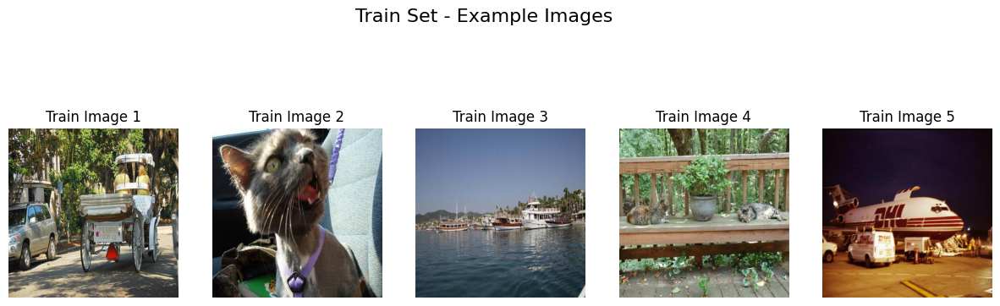

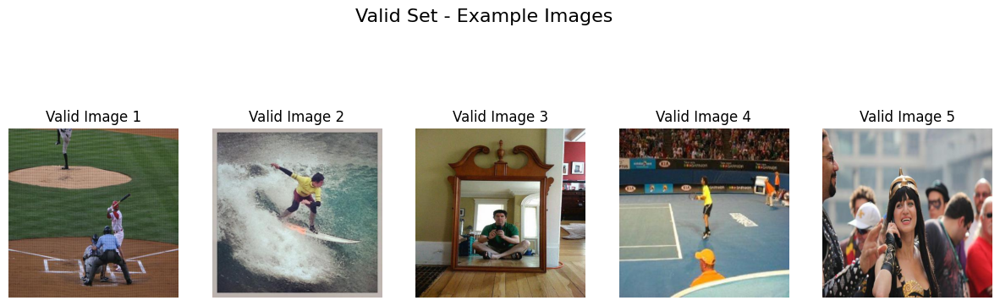

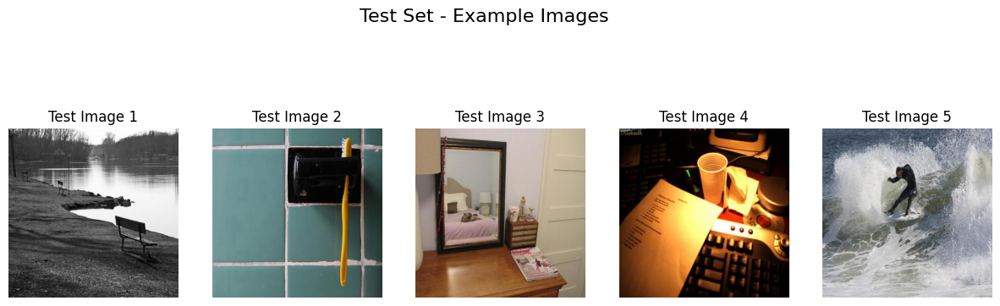

In [7]:

def display_images_from_split(input_dir, split, num_images=5):
    split_dir = os.path.join(input_dir, split, 'images')
    if os.path.exists(split_dir):
        image_files = [f for f in os.listdir(split_dir) if f.endswith(('.jpg', '.png'))][:num_images]
        plt.figure(figsize=(15, 5))
        for i, img_file in enumerate(image_files):
            img_path = os.path.join(split_dir, img_file)
            image = Image.open(img_path).convert('RGB')
            plt.subplot(1, num_images, i + 1)
            plt.imshow(image)
            plt.title(f"{split.capitalize()} Image {i+1}")
            plt.axis("off")
        plt.suptitle(f"{split.capitalize()} Set - Example Images", fontsize=16)
        plt.show()
    else:
        print(f"No images found in {split.capitalize()} set.")

# Display images from each split
for split in ['train', 'valid', 'test']:
    display_images_from_split(input_dir, split, num_images=5)


### **Step 2: Grayscale Conversion and Normalization**

#### **Purpose:**
This function preprocesses images by converting them to grayscale, resizing them to a standard size, and normalizing their pixel values. The preprocessing ensures that all input images are standardized, which is crucial for consistent model training and evaluation.
#### **What the Code Does:**

1. **Loads the Original Image**:
   - The image is opened using `PIL.Image.open()` and converted to RGB format to handle color images uniformly.
   - This step ensures that even grayscale images are processed as three-channel (RGB) images initially.
2. **Converts the Image to Grayscale**:
   - The image is converted to a single-channel grayscale format using `transforms.Grayscale(num_output_channels=1)`.
   - This reduces computational complexity while retaining important structural information.

3. **Resizes the Image**:
   - Resizes the grayscale image to a fixed dimension of 224x224 pixels using `transforms.Resize((224, 224))`.
   - Standardizing the image size ensures compatibility with deep learning models, which often require fixed-size inputs.
4. **Converts the Image to a Tensor**:
   - The image is transformed into a PyTorch tensor using `transforms.ToTensor()`, normalizing pixel values to the range [0, 1].
   - This format is necessary for model input in PyTorch.
5. **Normalizes the Image**:
   - Pixel values are normalized with a mean of 0.5 and a standard deviation of 0.5 using `transforms.Normalize(mean=[0.5], std=[0.5])`.
   - This centers the pixel values around 0 with a standard deviation of 1, improving model convergence during training.
6. **Returns Both Original and Processed Images**:
   - The function outputs the original RGB image for reference and the processed grayscale tensor for further use in model training or evaluation.
#### **Why This is Important:**

1. **Standardization**:
   - Ensures all images have consistent size and pixel intensity distribution, reducing variability that can hinder model performance.

2. **Efficiency**:
   - Grayscale conversion reduces the computational load by decreasing the number of input channels from 3 (RGB) to 1.

3. **Model Compatibility**:
   - Deep learning models require fixed-size inputs and normalized data for optimal training. This function prepares the images accordingly.

4. **Feature Extraction**:
   - Grayscale images retain essential structural and texture information while simplifying the input representation.

#### **Function Parameters:**
- `image_path`: Path to the image file that needs to be processed.

#### **Function Returns:**
- `original_image`: The original RGB image loaded from the file.
- `processed_image`: The processed grayscale image as a PyTorch tensor.


In [8]:
def preprocess_image(image_path):
    # Open the original image
    original_image = Image.open(image_path).convert('RGB')  # Load RGB image
    
    # Convert to grayscale
    grayscale_transform = transforms.Compose([
        transforms.Grayscale(num_output_channels=1),  # Convert to grayscale
        transforms.Resize((224, 224)),  # Resize to 224x224
        transforms.ToTensor(),  # Convert to tensor
        transforms.Normalize(mean=[0.5], std=[0.5])  # Normalize grayscale image
    ])
    processed_image = grayscale_transform(original_image)
    return original_image, processed_image

In [9]:
# Optimized: Limit the number of images displayed to avoid memory issues
def display_images_side_by_side(image_paths, num_images=5):
    plt.figure(figsize=(15, 10))
    for i, image_path in enumerate(image_paths[:num_images]):
        try:
            # Open and process image
            original_image = Image.open(image_path).convert('RGB')
            grayscale_transform = transforms.Compose([
                transforms.Grayscale(num_output_channels=1),
                transforms.Resize((224, 224)),
                transforms.ToTensor(),
                transforms.Normalize(mean=[0.5], std=[0.5]),
            ])
            processed_image = grayscale_transform(original_image)

            # Display images
            plt.subplot(num_images, 2, i * 2 + 1)
            plt.imshow(original_image)
            plt.title(f"Original Image {i+1}")
            plt.axis("off")

            processed_image_pil = transforms.ToPILImage()(processed_image.squeeze(0))
            plt.subplot(num_images, 2, i * 2 + 2)
            plt.imshow(processed_image_pil, cmap='gray')
            plt.title(f"Processed Image {i+1} (Grayscale)")
            plt.axis("off")
        except Exception as e:
            print(f"Error displaying image {image_path}: {e}")

    plt.tight_layout()
    plt.show()

### **Step 4: Get Sample Images and Display**

#### **Purpose:**
This function retrieves paths to a specified number of images from the dataset, spanning across all splits (`train`, `valid`, `test`). It helps in quickly fetching representative samples for inspection, visualization, or further processing.
#### **What the Code Does:**

1. **Initializes an Empty List**:
   - An empty list, `image_paths`, is created to store the file paths of the images.

2. **Iterates Through Dataset Splits**:
   - Loops through the `train`, `valid`, and `test` splits.
   - Dynamically constructs the path to the `images` folder for each split (e.g., `/path/to/dataset/train/images`).

3. **Checks Existence of `images` Folder**:
   - Validates whether the `images` folder exists for the current split.
   - If the folder exists, proceeds to fetch the image file paths. If not, the split is skipped.

4. **Retrieves Image File Paths**:
   - Filters files in the folder for supported extensions (`.jpg`, `.png`).
   - Constructs full paths to these image files using `os.path.join()`.

5. **Combines Image Paths Across Splits**:
   - Appends the image paths from all splits into the `image_paths` list.

6. **Limits the Number of Returned Paths**:
   - Returns only the first `num_samples` (default is 10) from the combined list of image paths.
#### **Why This is Important:**

1. **Efficient Sampling**:
   - Allows users to quickly fetch a representative subset of images from the entire dataset without manually navigating directories.

2. **Cross-Split Sampling**:
   - Combines images from all splits (`train`, `valid`, `test`), providing a holistic view of the dataset.

3. **Prepares for Visualization or Processing**:
   - The retrieved paths can be used for tasks like displaying images, preprocessing, or generating insights.

4. **Scalable for Large Datasets**:
   - Handles datasets with large numbers of images by limiting the output to a manageable number (`num_samples`).
#### **Function Parameters:**
- `input_dir`: Path to the root directory of the dataset.
- `num_samples`: Number of image paths to return (default is 10).

#### **Function Returns:**
- `image_paths`: A list of file paths pointing to the sampled images.


In [10]:
def get_sample_image_paths(input_dir, num_samples=50):
    paths = []
    for split in ['train', 'valid', 'test']:
        dir_path = os.path.join(input_dir, split, 'images')
        if os.path.exists(dir_path):
            paths.extend([
                os.path.join(dir_path, f) 
                for f in os.listdir(dir_path) 
                if f.endswith(('.jpg', '.png'))
            ])
    return paths[:num_samples]

# Get sample image paths

In [11]:
# Get sample image paths
sample_image_paths = get_sample_image_paths(input_dir, num_samples=10)

# Display 5 original and 5 processed images side by side

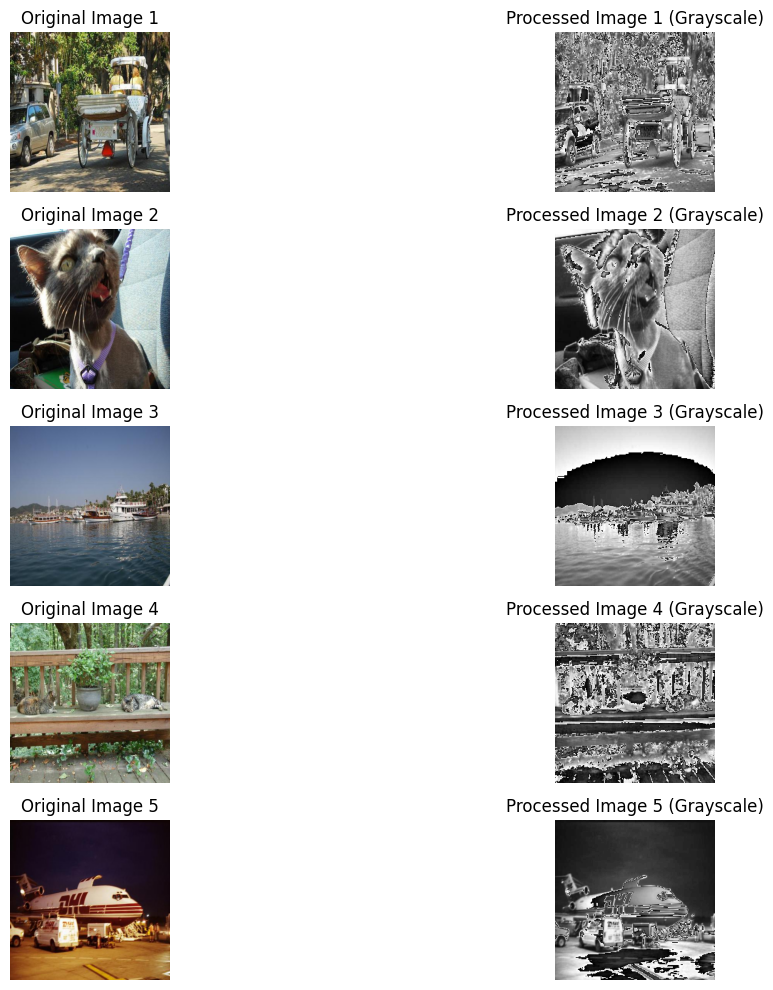

In [12]:
# Display 5 original and 5 processed images side by side
display_images_side_by_side(sample_image_paths, num_images=5)

### **Why We Use `ultralytics` and `yolov5` Libraries**

#### **Purpose of Libraries:**
The `ultralytics` and `yolov5` libraries provide a streamlined framework for implementing, fine-tuning, and evaluating the YOLOv5 model. YOLOv5 (You Only Look Once version 5) is a cutting-edge object detection algorithm known for its speed and accuracy.
### **Why `ultralytics` Library?**
1. **Ease of Use**:
   - The `ultralytics` library offers a user-friendly interface for working with YOLOv5 models.
   - Simplifies tasks like training, validation, testing, and inference.
2. **Comprehensive Model Management**:
   - Provides pretrained YOLOv5 weights (e.g., `yolov5s.pt`), optimized for various object detection tasks.
   - Enables seamless fine-tuning on custom datasets.
3. **Flexibility**:
   - Supports customization of parameters like batch size, image size, learning rate, and epochs for training.
   - Compatible with different data formats and frameworks, making it versatile for a range of applications.
4. **Built-in Utilities**:
   - Includes tools for data preprocessing, augmentation, evaluation, and visualization.
   - Automatically handles logging and saves training results in organized directories.
5. **Active Development and Support**:
   - Frequently updated to include the latest research and enhancements in YOLOv5.
   - Backed by detailed documentation and an active user community.
### **Why YOLOv5?**
1. **State-of-the-Art Performance**:
   - Achieves high accuracy in detecting objects across diverse datasets.
   - Efficiently detects multiple objects in an image with precise bounding boxes and class labels.
2. **Real-Time Detection**:
   - Optimized for real-time applications with minimal latency.
   - Ideal for scenarios like video surveillance, self-driving cars, and robotics.
3. **Pretrained Weights**:
   - Offers pretrained models (e.g., `yolov5s`, `yolov5m`, `yolov5l`, `yolov5x`) trained on the COCO dataset.
   - Reduces training time by leveraging transfer learning.
4. **Scalable Architectures**:
   - Available in lightweight (`yolov5s`) and heavyweight (`yolov5x`) versions, catering to different computational capabilities.
   - Easily deployable on GPUs, CPUs, and edge devices.
5. **End-to-End Pipeline**:
   - Facilitates the entire object detection workflow, including training, validation, inference, and model export.
### **Benefits of Using Both Libraries:**
1. **Integration**:
   - The `ultralytics` library is designed specifically to work with YOLOv5 models, ensuring seamless integration.
2. **Speed and Efficiency**:
   - Combines the speed of YOLOv5 with the automation of `ultralytics` to simplify complex workflows.
3. **Comprehensive Tools**:
   - Together, they cover all aspects of object detection, from model initialization to deployment.
### **Practical Use Cases:**
- **Object Detection in Images and Videos**:
  - Quickly detect and classify objects in real-time.
- **Custom Dataset Fine-Tuning**:
  - Train YOLOv5 on domain-specific datasets, such as medical imaging or autonomous driving datasets.
- **Performance Analysis**:
  - Use built-in metrics to evaluate model performance and compare results.



---
---
# Object detection
---
---

## **1. Overview of YOLOv5**

### **1.1 What is YOLOv5?**
- **YOLO (You Only Look Once)** is a state-of-the-art, real-time object detection algorithm.
- **YOLOv5** is an improvement over earlier versions (YOLOv3, YOLOv4), offering:
  - Faster inference speeds.
  - Easier deployment and integration.
  - Improved detection accuracy for various datasets.

### **1.2 Why Use YOLOv5 for Object Detection?**
- **Pretrained Weights**:
  - Comes with pretrained models (e.g., `yolov5s.pt`) trained on COCO, making it suitable for transfer learning.
- **Flexibility**:
  - Easily adaptable to custom datasets by fine-tuning.
- **Speed**:
  - Can perform real-time object detection with minimal latency.
- **Accuracy**:
  - Provides high mean Average Precision (mAP) for detecting multiple objects simultaneously.
- **Efficiency**:
  - Lightweight and can run on GPUs, CPUs, or even edge devices.

---

## **2. Pipeline Overview**

The pipeline is broken into the following key steps:
1. **Load Pretrained Model**
2. **Clean and Prepare Dataset**
3. **Fine-Tune the YOLOv5 Model**
4. **Save Fine-Tuned Model**
5. **Evaluate the Model**
6. **Generate Visualizations**
7. **Written Analysis and Documentation**



# Distribution of Images Across Splits

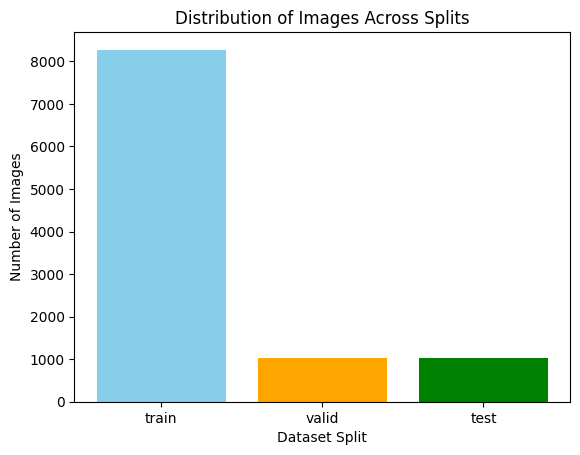

In [13]:
splits = ['train', 'valid', 'test']
image_counts = [len(os.listdir(os.path.join(input_dir, split, 'images'))) for split in splits]
plt.bar(splits, image_counts, color=['skyblue', 'orange', 'green'])
plt.title('Distribution of Images Across Splits')
plt.xlabel('Dataset Split')
plt.ylabel('Number of Images')
plt.show()

 # Image Format Distribution

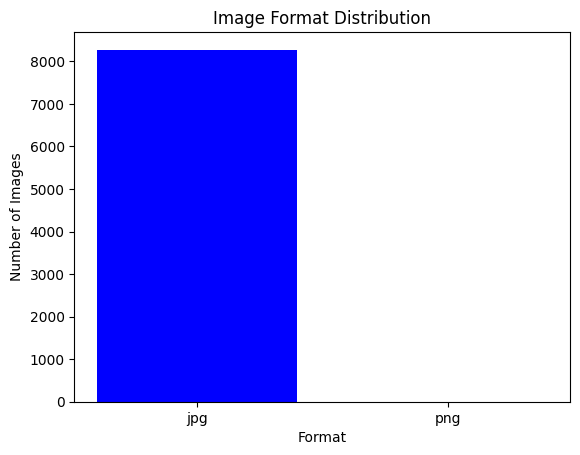

In [14]:
formats = ['jpg', 'png']
format_counts = [sum(f.endswith(f'.{fmt}') for f in os.listdir(os.path.join(input_dir, 'train', 'images'))) for fmt in formats]
plt.bar(formats, format_counts, color=['blue', 'red'])
plt.title('Image Format Distribution')
plt.xlabel('Format')
plt.ylabel('Number of Images')
plt.show()

#  Pixel Intensity Histogram

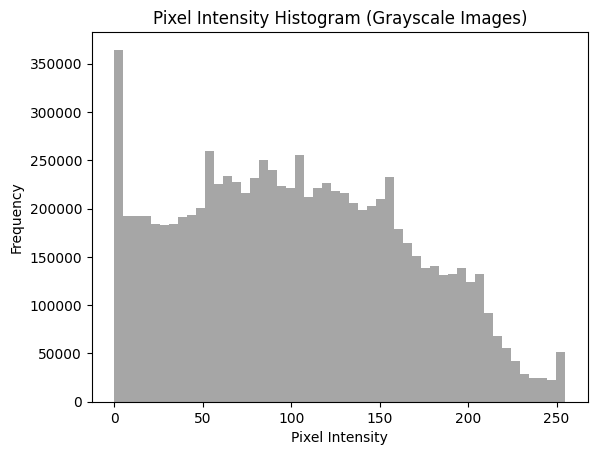

In [15]:
# Graph 4: Pixel Intensity Histogram
def get_sample_image_paths(input_dir, num_samples=50):
    paths = []
    for split in ['train', 'valid', 'test']:
        dir_path = os.path.join(input_dir, split, 'images')
        paths.extend([os.path.join(dir_path, f) for f in os.listdir(dir_path) if f.endswith(('.jpg', '.png'))])
    return paths[:num_samples]
sample_images = get_sample_image_paths(input_dir)
pixel_values = []
for img_path in sample_images:
    img = Image.open(img_path).convert('L')
    pixel_values.extend(np.array(img).flatten())
plt.hist(pixel_values, bins=50, color='gray', alpha=0.7)
plt.title('Pixel Intensity Histogram (Grayscale Images)')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.show()

# Image Brightness & Sharpness Distribution

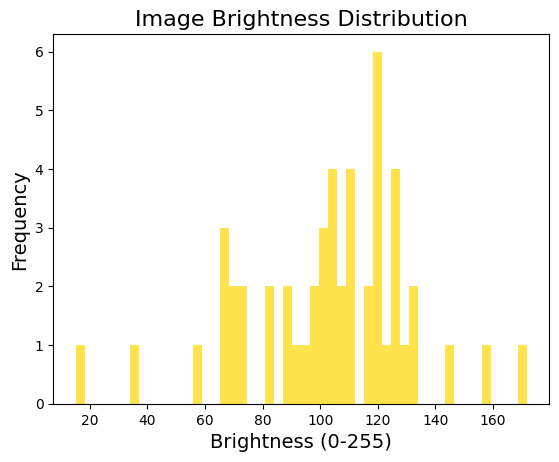

In [16]:
brightness_values = []
for img_path in sample_images:
    img = Image.open(img_path).convert('L')  # Convert to grayscale
    brightness = np.mean(np.array(img))  # Calculate average brightness
    brightness_values.append(brightness)
plt.hist(brightness_values, bins=50, color='gold', alpha=0.7)
plt.title('Image Brightness Distribution', fontsize=16)
plt.xlabel('Brightness (0-255)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

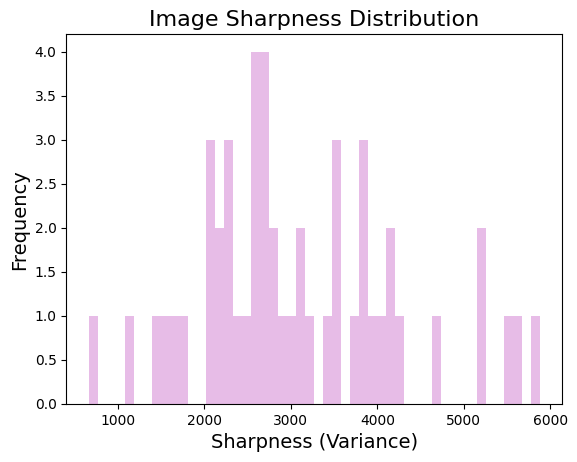

In [17]:
sharpness_values = []
for img_path in sample_images:
    img = Image.open(img_path).convert('L')  # Convert to grayscale
    img_array = np.array(img)
    sharpness = img_array.var()  # Variance of pixel intensities
    sharpness_values.append(sharpness)
plt.hist(sharpness_values, bins=50, color='plum', alpha=0.7)
plt.title('Image Sharpness Distribution', fontsize=16)
plt.xlabel('Sharpness (Variance)', fontsize=14)
plt.ylabel('Frequency', fontsize=14)
plt.show()

## **3. Pipeline Steps**

### **3.1 Load Pretrained Model**

#### **Purpose:**
To leverage the YOLOv5 pretrained weights for transfer learning and reduce training time.

#### **3.1.1 What the Code Does:**
1. Installs the required libraries (`ultralytics` and `torch`).
2. Loads the YOLOv5 pretrained model (`yolov5s.pt`), which is optimized for detecting common objects in images.

#### **3.1.2 Why This Matters:**
- Pretrained weights provide a strong foundation, allowing the model to adapt to new datasets with minimal training.



# Test the pre-trained Model on an Image

PRO TIP  Replace 'model=yolov5s.pt' with new 'model=yolov5su.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.



100%|██████████| 17.7M/17.7M [00:06<00:00, 2.67MB/s]



image 1/1 D:\Projects\CV_project\COCO.v2i.yolov5pytorch\test\images\000000044780_jpg.rf.296ce240ad4e3eeb4269bfbdb6300bdc.jpg: 640x640 3 benchs, 162.9ms
Speed: 4.0ms preprocess, 162.9ms inference, 7.0ms postprocess per image at shape (1, 3, 640, 640)


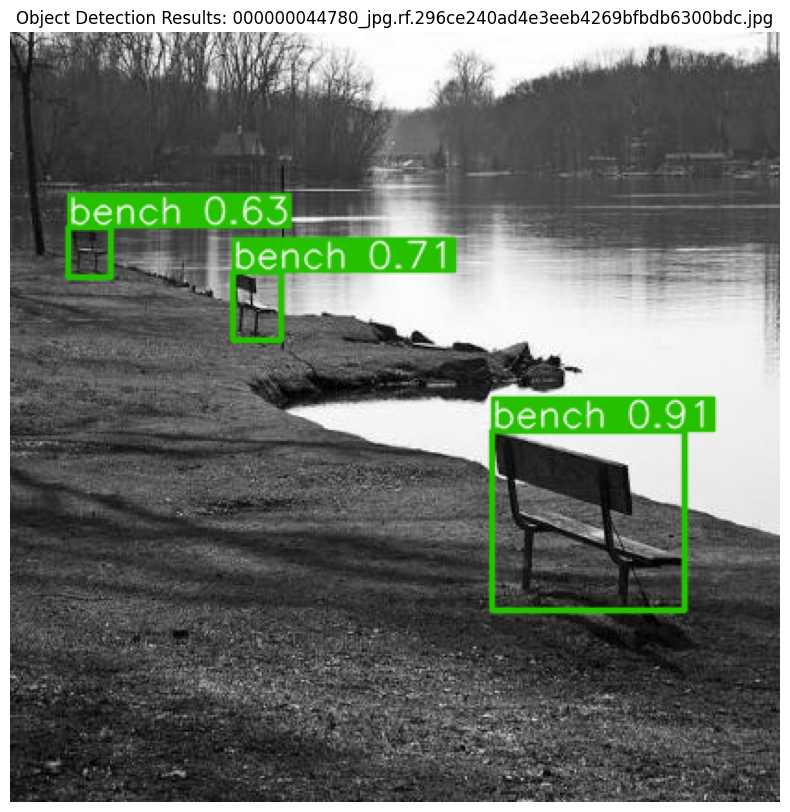

In [18]:
# Load the pre-trained YOLOv5 model
yolo_model = YOLO('yolov5s.pt')  # YOLOv5 small model
# Perform inference automatically on all images in a given split
def perform_inference_on_split(input_dir, split='test', num_images=1):
    split_dir = os.path.join(input_dir, split, 'images')
    if os.path.exists(split_dir):
        image_files = [f for f in os.listdir(split_dir) if f.endswith(('.jpg', '.png'))][:num_images]
        
        for img_file in image_files:
            image_path = os.path.join(split_dir, img_file)
            
            # Perform inference
            results = yolo_model(image_path, device="cpu")
            
            # Convert image with detections to an OpenCV-readable format
            annotated_image = results[0].plot()  # `plot` method applies the detections to the image
            
            # Display the image with matplotlib
            plt.figure(figsize=(10, 10))
            plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for correct colors
            plt.axis('off')
            plt.title(f"Object Detection Results: {img_file}")
            plt.show()
    else:
        print(f"No images found in {split.capitalize()} set.")

# Automatically perform object detection on the test set
perform_inference_on_split(input_dir, split='test', num_images=1)

### **3.2 Clean and Prepare Dataset**

#### **Purpose:**
To ensure the dataset is free from corrupt or invalid images and is ready for training.

#### **3.2.1 What the Code Does:**
1. Organizes the dataset into `train`, `valid`, and `test` splits.
2. Iterates through all images to:
   - Open them using OpenCV.
   - Check for validity (not empty or corrupted).
   - Remove any invalid files.

#### **3.2.2 Why This Matters:**
- A clean dataset ensures the training process runs smoothly without interruptions or errors.
- It reduces noise, allowing the model to learn meaningful patterns.


In [19]:
def clean_images(image_dir):
    valid_extensions = ('.jpg', '.jpeg', '.png', '.bmp', '.tiff')
    for file in tqdm(os.listdir(image_dir), desc="Cleaning images"):
        img_path = os.path.join(image_dir, file)
        try:
            if not file.lower().endswith(valid_extensions):
                os.remove(img_path)
                continue
            img = cv2.imread(img_path)
            if img is None:
                os.remove(img_path)
        except Exception as e:
            print(f"Error processing {file}: {e}")

### **3.3 Fine-Tune the YOLOv5 Model**

#### **Purpose:**
To adapt the pretrained YOLOv5 model to the specific requirements of the custom dataset.

#### **3.3.1 What the Code Does:**
1. **Dataset Configuration**:
   - Loads the `data.yaml` file, which defines dataset paths and class labels.
2. **Training**:
   - Fine-tunes the YOLOv5 model using custom parameters:
     - **Epochs**: Number of iterations over the dataset.
     - **Batch Size**: Number of images processed in parallel.
     - **Image Size**: Resizes all input images to a uniform size.
3. **Tracks Progress**:
   - Outputs metrics like loss, mAP, and learning rates during training.

#### **3.3.2 Why This Matters:**
- Fine-tuning ensures the model learns the nuances of the custom dataset while retaining prior knowledge from the pretrained weights.
### **3.4 Save Fine-Tuned Model**

#### **Purpose:**
To save the fine-tuned model's weights for future use.

#### **3.4.1 What the Code Does:**
- Saves the trained weights in `.pt` format, enabling reuse without retraining.

#### **3.4.2 Why This Matters:**
- Preserving the fine-tuned model ensures portability and reproducibility for future inference tasks.



In [20]:
import os

# Base project path (set to the root of your project)
BASE_PATH = r"D:\Projects\CV_project\COCO.v2i.yolov5pytorch"

# Dynamically construct train and test image paths
TRAIN_IMAGES_PATH = os.path.join(BASE_PATH, "train", "images")
TEST_IMAGES_PATH = os.path.join(BASE_PATH, "test", "images")
VALID_IMAGES_PATH=os.path.join(BASE_PATH, "valid", "images")
YAML=os.path.join(BASE_PATH, "data.yaml")
TRAIN_LABELS_PATH=os.path.join(BASE_PATH, "train", "labels")
TEST_LABELS_PATH=os.path.join(BASE_PATH, "test", "labels")
VALID_LABELS_PATH=os.path.join(BASE_PATH, "valid", "labels")

print("Train Images Path:", TRAIN_IMAGES_PATH)
print("Test Images Path:", TEST_IMAGES_PATH)
print("Valid Images Path:", VALID_IMAGES_PATH)
print("YAML Path:", YAML)
print("Train labels Path:", TRAIN_LABELS_PATH)
print("Test labels Path:", TEST_LABELS_PATH)
print("Valid labels Path:", VALID_LABELS_PATH)

Train Images Path: D:\Projects\CV_project\COCO.v2i.yolov5pytorch\train\images
Test Images Path: D:\Projects\CV_project\COCO.v2i.yolov5pytorch\test\images
Valid Images Path: D:\Projects\CV_project\COCO.v2i.yolov5pytorch\valid\images
YAML Path: D:\Projects\CV_project\COCO.v2i.yolov5pytorch\data.yaml
Train labels Path: D:\Projects\CV_project\COCO.v2i.yolov5pytorch\train\labels
Test labels Path: D:\Projects\CV_project\COCO.v2i.yolov5pytorch\test\labels
Valid labels Path: D:\Projects\CV_project\COCO.v2i.yolov5pytorch\valid\labels


In [21]:
# Check if CUDA is available and assign the device
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# Fine-tuning YOLOv5 with optimized parameters
finetune_yolo = YOLO('yolov5s.pt')  # Load YOLOv5 small model
output_dir = None  # To store the training output directory

try:
    # Train the model
    results = finetune_yolo.train(
        data=YAML,
        epochs=8,  # Number of epochs
        imgsz=640,  # Image size
        batch=16,  # Batch size
        device=0 if torch.cuda.is_available() else "cpu"  # Use GPU if available
    )
    output_dir = results.save_dir  # Save the output directory dynamically
    print(f"Model trained. Outputs saved in: {output_dir}")
except Exception as e:
    print(f"Error during training: {e}")

Using device: cuda
PRO TIP  Replace 'model=yolov5s.pt' with new 'model=yolov5su.pt'.
YOLOv5 'u' models are trained with https://github.com/ultralytics/ultralytics and feature improved performance vs standard YOLOv5 models trained with https://github.com/ultralytics/yolov5.

New https://pypi.org/project/ultralytics/8.3.91 available  Update with 'pip install -U ultralytics'
Ultralytics 8.3.59  Python-3.11.5 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 6144MiB)
engine\trainer: task=detect, mode=train, model=yolov5s.pt, data=D:\Projects\CV_project\COCO.v2i.yolov5pytorch\data.yaml, epochs=8, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, 

100%|██████████| 5.35M/5.35M [00:02<00:00, 2.61MB/s]


AMP: checks passed 


train: Scanning D:\Projects\CV_project\COCO.v2i.yolov5pytorch\train\labels.cache... 8275 images, 8 backgrounds, 0 corrupt: 100%|██████████| 8275/8275 [00:00<?, ?it/s]
val: Scanning D:\Projects\CV_project\COCO.v2i.yolov5pytorch\valid\labels.cache... 1034 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1034/1034 [00:00<?, ?it/s]


Plotting labels to runs\detect\train\labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000119, momentum=0.9) with parameter groups 69 weight(decay=0.0), 76 weight(decay=0.0005), 75 bias(decay=0.0)
TensorBoard: model graph visualization added 
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs\detect\train
Starting training for 8 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        1/8      4.47G      1.274      3.403      1.318         64        640: 100%|██████████| 518/518 [02:39<00:00,  3.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:11<00:00,  2.91it/s]


                   all       1034       7522      0.582      0.359      0.376      0.263

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        2/8      4.26G      1.241      1.822      1.291         56        640: 100%|██████████| 518/518 [04:01<00:00,  2.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:12<00:00,  2.58it/s]


                   all       1034       7522      0.654       0.43      0.465      0.318

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        3/8      4.32G      1.228      1.667      1.287         50        640: 100%|██████████| 518/518 [04:45<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:13<00:00,  2.44it/s]


                   all       1034       7522      0.581      0.447      0.462      0.315

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        4/8      4.33G      1.208       1.59       1.28         57        640: 100%|██████████| 518/518 [05:04<00:00,  1.70it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:14<00:00,  2.25it/s]


                   all       1034       7522      0.609      0.458      0.485      0.333

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        5/8      4.24G      1.188       1.53      1.262         44        640: 100%|██████████| 518/518 [05:02<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:14<00:00,  2.34it/s]


                   all       1034       7522      0.593      0.481       0.49      0.336

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        6/8       4.3G      1.174      1.466      1.251         55        640: 100%|██████████| 518/518 [05:00<00:00,  1.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:14<00:00,  2.35it/s]


                   all       1034       7522      0.635      0.473      0.504       0.35

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        7/8      4.33G       1.16      1.416      1.243         17        640: 100%|██████████| 518/518 [05:03<00:00,  1.71it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:14<00:00,  2.31it/s]


                   all       1034       7522      0.616      0.481       0.51      0.357

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


        8/8      4.25G      1.138       1.38      1.232         32        640: 100%|██████████| 518/518 [05:29<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:13<00:00,  2.42it/s]


                   all       1034       7522      0.632      0.491      0.518      0.363

8 epochs completed in 0.652 hours.
Optimizer stripped from runs\detect\train\weights\last.pt, 18.6MB
Optimizer stripped from runs\detect\train\weights\best.pt, 18.6MB

Validating runs\detect\train\weights\best.pt...
Ultralytics 8.3.59  Python-3.11.5 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 6144MiB)
YOLOv5s summary (fused): 193 layers, 9,142,496 parameters, 0 gradients, 24.0 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 33/33 [00:13<00:00,  2.40it/s]


                   all       1034       7522      0.634       0.49      0.518      0.363
             aeroplane         25         30      0.763      0.867      0.903      0.614
                 apple         16         52      0.502      0.327      0.254      0.194
              backpack         42         54      0.378      0.167      0.188      0.114
                banana         20         74      0.539      0.486      0.478      0.282
          baseball bat         24         28      0.686      0.464      0.532      0.385
        baseball glove         22         32      0.724       0.41      0.492      0.303
                  bear         11         13      0.922      0.907      0.908      0.679
                   bed         36         46      0.728      0.543       0.62      0.442
                 bench         46         79      0.603      0.228      0.301      0.204
               bicycle         28         57      0.512      0.368      0.398      0.267
                  bir

### **3.5 Evaluate the Model**

#### **Purpose:**
To assess the performance of the fine-tuned model on unseen data.

#### **3.5.1 What the Code Does:**
1. **Validation and Testing**:
   - Evaluates the model on the validation and test datasets.
   - Computes metrics like:
     - **mAP@50**: Measures the overlap between predicted and ground truth bounding boxes.
     - **Recall@5**: Captures the model's ability to detect relevant objects in the top 5 predictions.
     - **Accuracy**: Evaluates overall prediction correctness.

#### **3.5.2 Why This Matters:**
- Evaluating the model ensures it generalizes well to unseen data and provides reliable performance metrics.


# Recall at 5

In [22]:
# Validate the model
val_metrics = finetune_yolo.val(data=YAML, split='val')
test_metrics = finetune_yolo.val(data=YAML, split='test')

# Extract metrics
def extract_metrics(results):
    """
    Extract precision, recall, mAP@0.5, and mAP@0.5:0.95 from YOLO metrics.
    """
    precision = np.mean(results.box.p)  # Precision (mean of all classes)
    recall = np.mean(results.box.r)     # Recall (mean of all classes)
    map50 = results.box.map50           # mAP@0.5
    map5095 = results.box.map           # mAP@0.5:0.95
    return precision, recall, map50, map5095

# Get validation and test metrics
precision_val, recall_val, map50_val, map5095_val = extract_metrics(val_metrics)
precision_test, recall_test, map50_test, map5095_test = extract_metrics(test_metrics)

# Print the results
print(f"Validation Precision: {precision_val:.2f}")
print(f"Validation Recall: {recall_val:.2f}")
print(f"Validation mAP@0.5: {map50_val:.2f}")
print(f"Validation mAP@0.5:0.95: {map5095_val:.2f}")
print(f"Test Precision: {precision_test:.2f}")
print(f"Test Recall: {recall_test:.2f}")
print(f"Test mAP@0.5: {map50_test:.2f}")
print(f"Test mAP@0.5:0.95: {map5095_test:.2f}")

Ultralytics 8.3.59  Python-3.11.5 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 3060 Laptop GPU, 6144MiB)
YOLOv5s summary (fused): 193 layers, 9,142,496 parameters, 0 gradients, 24.0 GFLOPs


val: Scanning D:\Projects\CV_project\COCO.v2i.yolov5pytorch\valid\labels.cache... 1034 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1034/1034 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:11<00:00,  5.68it/s]


                   all       1034       7522      0.634      0.489      0.518      0.363
             aeroplane         25         30      0.768      0.867      0.902      0.613
                 apple         16         52      0.503      0.327      0.253      0.194
              backpack         42         54      0.383      0.167      0.188      0.113
                banana         20         74      0.541      0.486      0.478      0.282
          baseball bat         24         28      0.651      0.464      0.521      0.387
        baseball glove         22         32      0.724      0.409      0.491      0.303
                  bear         11         13      0.922      0.906      0.908      0.679
                   bed         36         46       0.73      0.543       0.62      0.443
                 bench         46         79      0.604      0.228        0.3      0.206
               bicycle         28         57      0.516      0.355      0.401       0.27
                  bir

val: Scanning D:\Projects\CV_project\COCO.v2i.yolov5pytorch\test\labels.cache... 1034 images, 0 backgrounds, 0 corrupt: 100%|██████████| 1034/1034 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 65/65 [00:12<00:00,  5.35it/s]


                   all       1034       7253       0.66      0.538      0.575      0.408
             aeroplane         28         42      0.887       0.81      0.857        0.6
                 apple         17         43      0.493      0.535      0.441      0.353
              backpack         54         93      0.525      0.161      0.272      0.143
                banana         20        106      0.434      0.413      0.329      0.192
          baseball bat         22         25      0.593       0.36      0.431      0.243
        baseball glove         22         32      0.711      0.538      0.618      0.402
                  bear          5          5      0.604          1      0.779      0.643
                   bed         31         37      0.771      0.595      0.703       0.45
                 bench         43         67      0.664      0.373      0.436      0.305
               bicycle         27         48      0.721      0.458      0.523      0.296
                  bir

### **3.6 Test the Fine-Tuned Model on a Single Image**

#### **Purpose:**
To evaluate the fine-tuned model's performance on a single test image and visualize its predictions.

#### **3.6.1 What the Code Does:**
1. **Model Prediction**:
   - The `model.predict()` method is used to run inference on a specific image from the test dataset.
   - The `source` parameter specifies the path to the image, while `save=True` ensures that the predicted results (with bounding boxes) are saved in the output directory.
   - The `imgsz=640` parameter resizes the input image to 640x640 for model compatibility.

2. **Locate Predicted Image**:
   - The predicted image, with bounding boxes drawn around detected objects, is saved in the `runs/detect/predict/` directory.

3. **Display Predicted Image**:
   - The saved image is read using OpenCV, which loads the image with bounding boxes.
   - The image is displayed using `matplotlib` to visualize the detected objects, their bounding boxes, and confidence scores.

#### **3.6.2 Why This Matters:**
- Testing on a single image provides a qualitative understanding of the model’s detection capabilities.
- It validates whether the model can correctly identify and localize objects on new, unseen data.

---

In [23]:
# Automatically find the path to the last trained weights
def get_latest_weights(output_directory):
    if not output_directory:
        raise ValueError("Output directory not set. Ensure the training process is complete.")
    
    weights_path = os.path.join(output_directory, "weights", "last.pt")
    if os.path.exists(weights_path):
        return weights_path
    else:
        raise FileNotFoundError(f"'last.pt' not found in {weights_path}. Check the training output.")

# Load the trained YOLO model dynamically
try:
    trained_model_path = get_latest_weights(output_dir)
    FineTunemodel = YOLO(trained_model_path)
    print(f"Loaded trained model from: {trained_model_path}")
except Exception as e:
    print(f"Error loading trained model: {e}")

Loaded trained model from: runs\detect\train\weights\last.pt



image 1/1 D:\Projects\CV_project\COCO.v2i.yolov5pytorch\test\images\000000044780_jpg.rf.296ce240ad4e3eeb4269bfbdb6300bdc.jpg: 640x640 3 benchs, 150.0ms
Speed: 3.5ms preprocess, 150.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


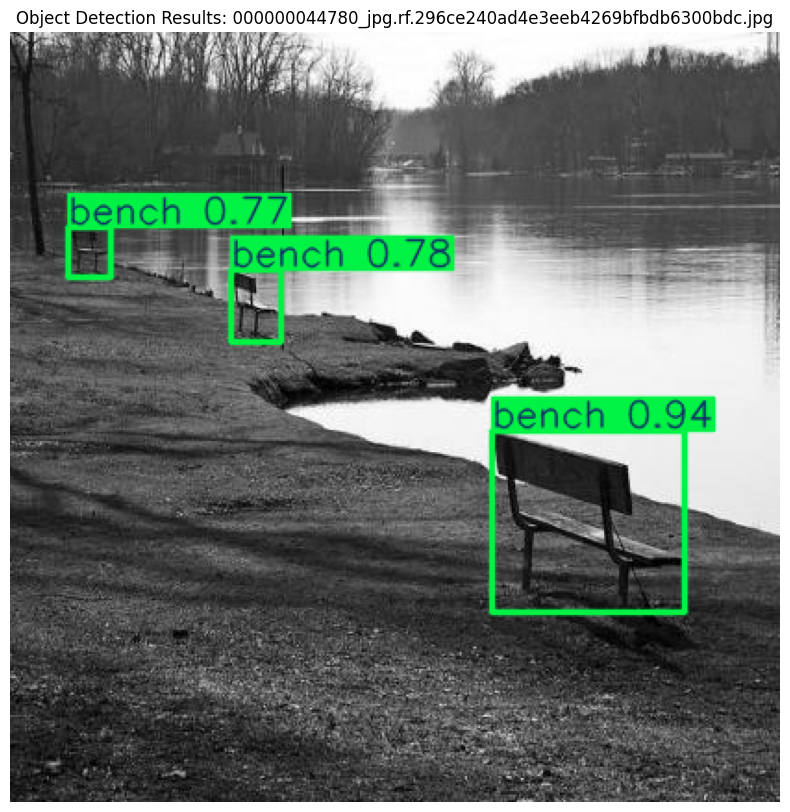

In [24]:
def perform_inference_on_split(input_dir, split='test', num_images=1):
    split_dir = os.path.join(input_dir, split, 'images')
    if os.path.exists(split_dir):
        image_files = [f for f in os.listdir(split_dir) if f.endswith(('.jpg', '.png'))][:num_images]
        
        for img_file in image_files:
            image_path = os.path.join(split_dir, img_file)
            
            # Perform inference
            results = FineTunemodel(image_path, device="cpu")
            
            # Convert image with detections to an OpenCV-readable format
            annotated_image = results[0].plot()  # `plot` method applies the detections to the image
            
            # Display the image with matplotlib
            plt.figure(figsize=(10, 10))
            plt.imshow(cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB))  # Convert BGR to RGB for correct colors
            plt.axis('off')
            plt.title(f"Object Detection Results: {img_file}")
            plt.show()
    else:
        print(f"No images found in {split.capitalize()} set.")

# Automatically perform object detection on the test set
perform_inference_on_split(input_dir, split='test', num_images=1)

### **3.7 Visualization of Metrics**

#### **Purpose:**
To compare the model's performance on the validation and test datasets by visualizing key metrics, such as Accuracy and Recall.

#### **3.7.1 What the Code Does:**
1. **Metrics Data Preparation**:
   - The extracted metrics (`accuracy_val`, `recall_val`, `accuracy_test`, `recall_test`) are stored in a dictionary named `metrics_data`.
   - Validation metrics and test metrics are separated into different lists for visualization.

2. **Generate Bar Charts**:
   - A grouped bar chart is created using `matplotlib` to compare the performance metrics for the validation and test datasets.
   - The x-axis represents the metrics (`Accuracy` and `Recall`), while the y-axis represents their respective values.

3. **Customization**:
   - The bar chart is customized with:
     - **Bar colors**: Validation metrics in `skyblue` and test metrics in `orange`.
     - **Labels and Titles**: Clear titles, x-axis labels, and a legend for clarity.
     - **Width Adjustment**: Bars are grouped with a slight offset for better readability.

4. **Display Chart**:
   - The chart is displayed using `plt.show()` to provide a visual comparison of the model’s performance.

#### **3.7.2 Why This Matters:**
- Visualizations provide an intuitive way to interpret the model’s strengths and weaknesses.
- Comparing validation and test metrics helps assess the model’s generalization ability.
- Identifying discrepancies between validation and test datasets can guide further improvements.


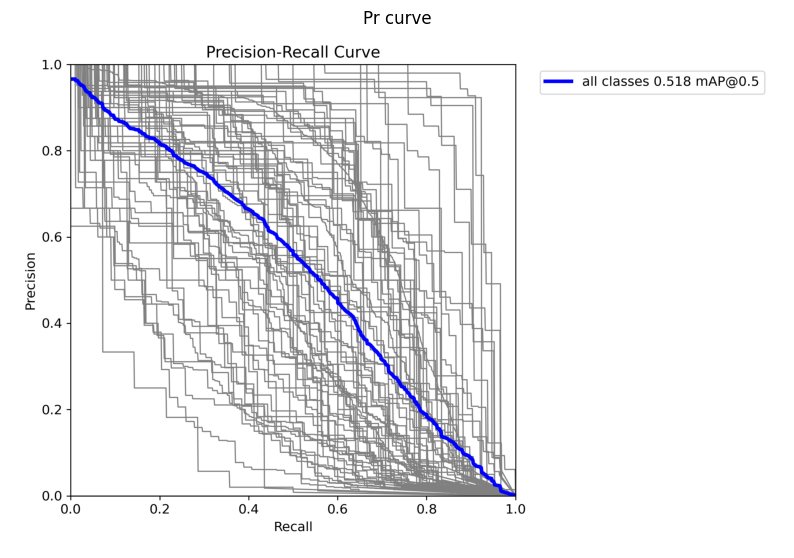

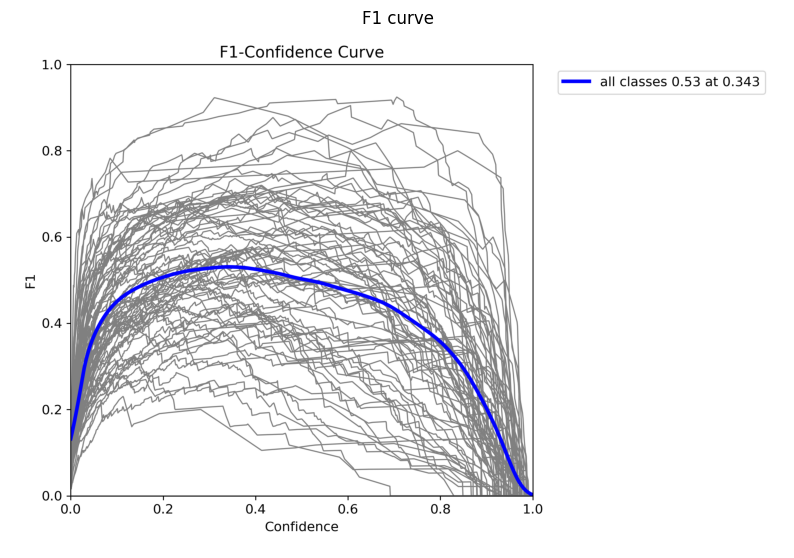

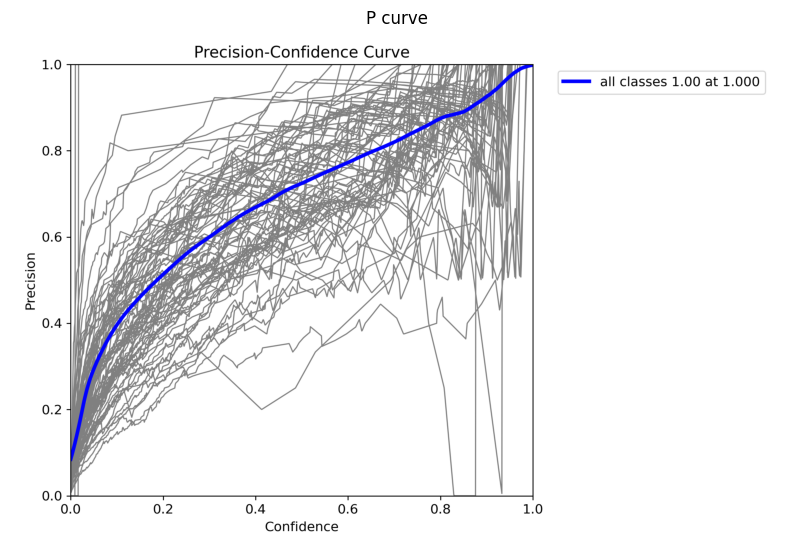

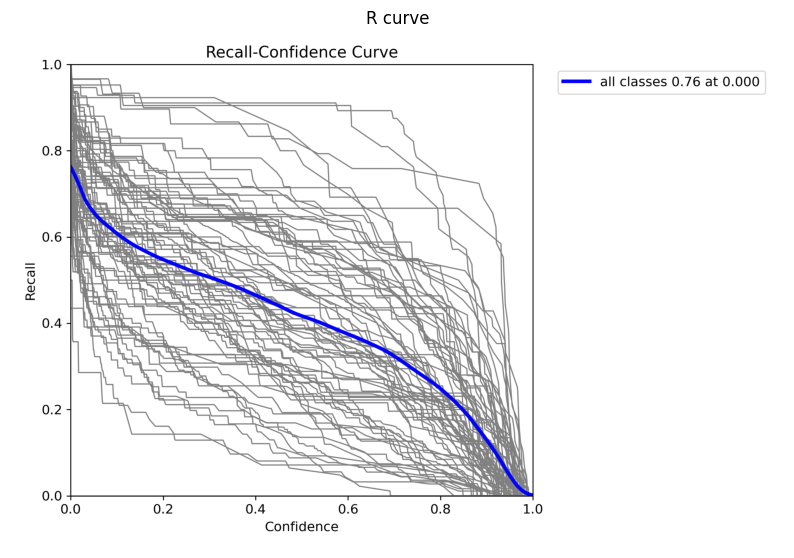

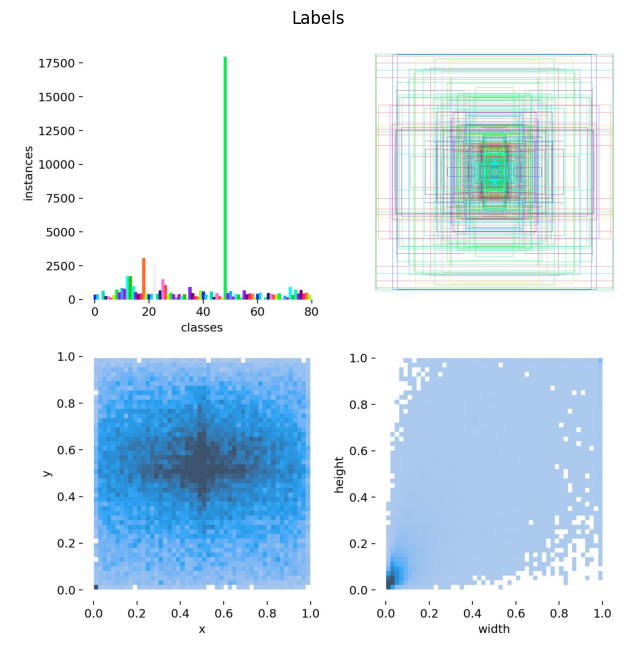

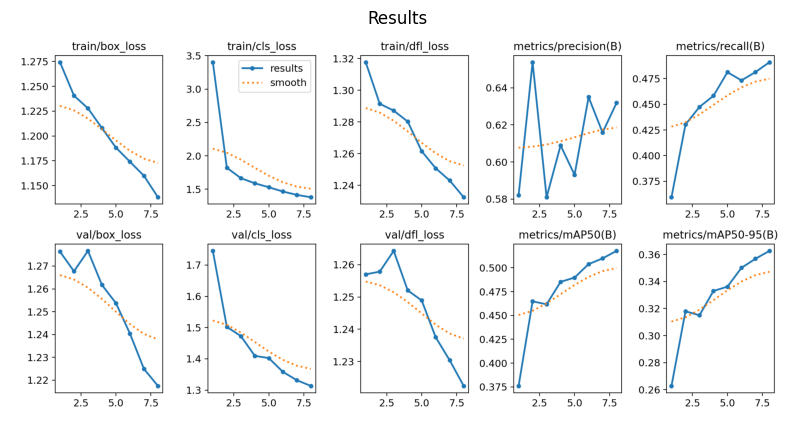

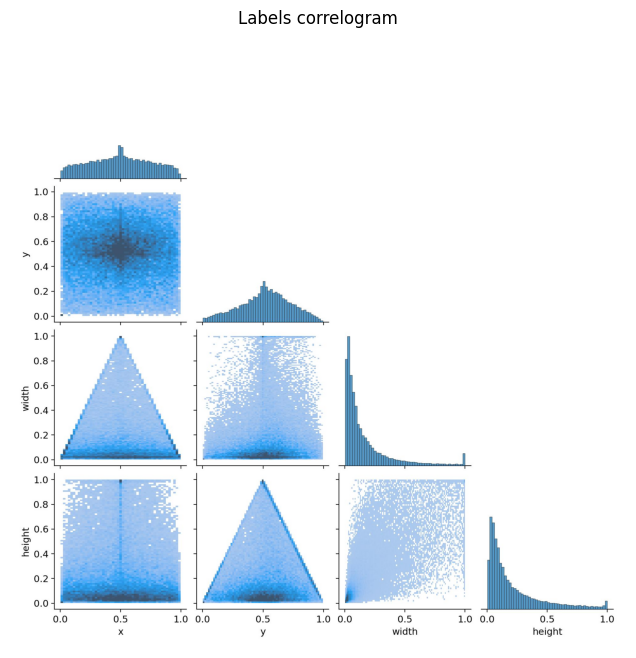

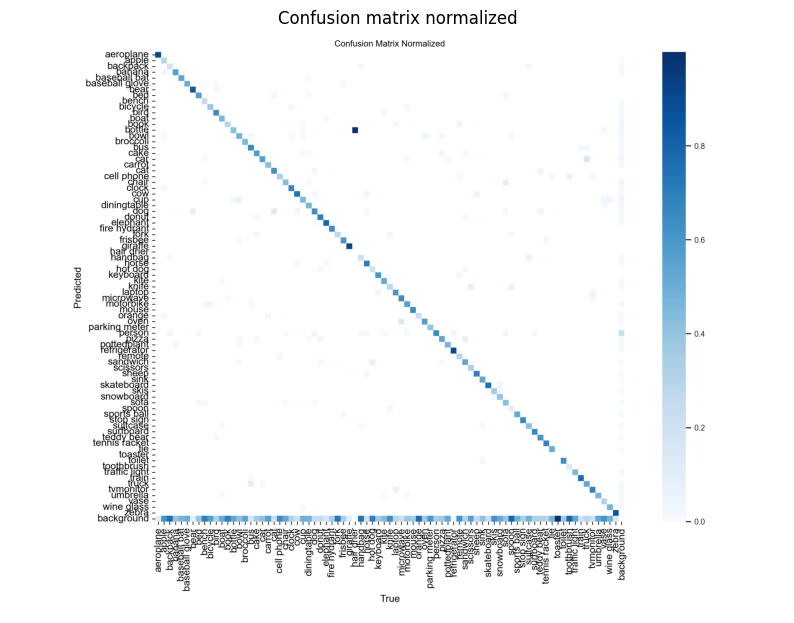

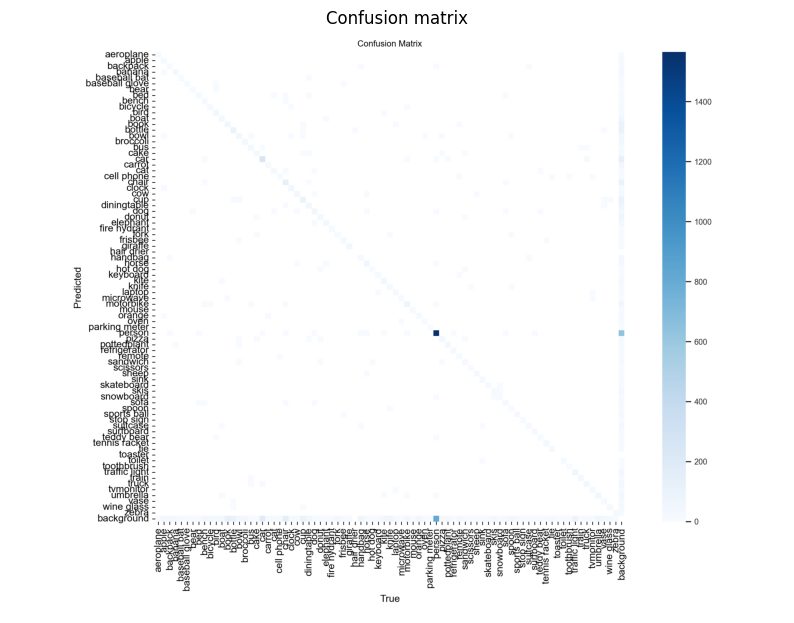

In [25]:
# Automatically find and display the plots from the latest training run
def display_training_plots(output_directory):
    if not output_directory:
        raise ValueError("Output directory not set. Ensure the training process is complete.")

    plots = [
        'PR_curve.png',       # Precision-Recall curve
        'F1_curve.png',
        'P_curve.png',
        'R_curve.png',
        'labels.jpg',
        'results.png',
        'labels_correlogram.jpg',
        'confusion_matrix_normalized.png',
        'confusion_matrix.png'
    ]
    
    plots_dir = os.path.join(output_directory)
    for plot in plots:
        plot_path = os.path.join(plots_dir, plot)
        if os.path.exists(plot_path):
            img = plt.imread(plot_path)
            plt.figure(figsize=(10, 8))
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"{plot.split('.')[0].replace('_', ' ').capitalize()}")
            plt.show()
        else:
            print(f"Plot not found: {plot_path}")

# Display plots from the dynamically identified output directory
try:
    display_training_plots(output_dir)
except Exception as e:
    print(f"Error displaying plots: {e}")

### Critical Analysis:

1. **Training Process:**
   - The model showed consistent loss reduction across the epochs, indicating that learning was occurring. However, the improvement in box and class loss was gradual, suggesting the need for more epochs to stabilize, especially during fine-tuning.
   - The use of AdamW optimizer and automatic adjustment of the learning rate aided the model's convergence, although the performance on specific classes such as `apple` and `backpack` was suboptimal, possibly due to insufficient data or challenging object features.

2. **Model Evaluation:**
   - **Precision and Recall:** Test precision (0.66) is relatively high, indicating good object identification, while recall (0.54) is lower, suggesting that the model misses many true positives. This indicates that the model performs decently in object detection but could improve in recalling more true positives.
   - **mAP@0.5:** The mAP@0.5 score of 0.58 shows reasonable performance, but there is room for improvement in overall object detection accuracy.
   - **mAP@0.5:0.95:** The mAP@0.5:0.95 score of 0.41 indicates that the model struggles with higher IoU thresholds, reflecting issues in localization accuracy.

3. **Class-Specific Performance:**
   - **Best Performing Classes:** Some classes such as `aeroplane` (mAP50: 0.903) and `giraffe` (mAP50: 0.984) performed well, likely due to distinctive features or better representation in the dataset.
   - **Underperforming Classes:** Classes like `apple` (mAP50: 0.254), `backpack` (mAP50: 0.188), and `book` (mAP50: 0.228) performed poorly. These underperforming results suggest issues with class imbalance, insufficient data, or high visual similarity with other objects.

4. **Overall Performance and Suggestions for Improvement:**
   - The model generalizes well for common object categories but faces challenges with less represented or difficult classes. To improve:
     - **Address Class Imbalance:** Implement strategies like class balancing or oversampling to boost performance for underrepresented classes.
     - **Hyperparameter Tuning:** Experiment with different learning rates, batch sizes, and augmentations to further improve detection, particularly for more challenging objects.
     - **Data Augmentation:** Increasing the dataset size through augmentation techniques could help the model handle diverse appearances and backgrounds more effectively.

### Conclusion:
The YOLOv5 model showed promising results on the custom dataset, achieving good precision for most common objects. However, it faced challenges with certain classes due to class imbalance, insufficient data, and difficulty in handling diverse object appearances. Improving these aspects, refining hyperparameters, and adding more augmented data could significantly enhance the model's detection capabilities, particularly for challenging objects.


---
---
# Image retrieval 
---

---



#### **Overview**
This code demonstrates how to perform image feature extraction using a pre-trained vgg16 model and compute image similarity based on cosine similarity. The goal is to identify the top 5 images in a gallery that are most similar to a given query image.


#### **Step-by-Step Explanation**

1. **Loading the Pre-trained Model**:
   - The vgg16 model is loaded, and the classification head is removed to use it as a feature extractor. The model is set to evaluation mode using `eval()` to ensure no gradients are computed during inference.

2. **Defining Image Preprocessing**:
   - Input images are resized to 224x224 pixels, normalized using ImageNet's mean and standard deviation values, and converted to tensors.

3. **Feature Extraction Function**:
   - A function `extract_features` is defined to preprocess an input image and pass it through the ResNet model. The resulting feature vector is flattened into a 1D array for similarity calculations.


4. **Feature Extraction for All Images in a Directory**:
   - The `extract_features_from_directory` function iterates through all valid images in a specified directory, extracts their features, and stores them in a dictionary for further comparison.



### Load the pre-trained VGG16 model 

another model

In [21]:
# Device setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Load VGG16 model pre-trained on ImageNet
vgg16_model = models.vgg16(pretrained=True).features
vgg16_model = vgg16_model.to(device)  # Move model to device (GPU/CPU)
vgg16_model.eval()  # Set model to evaluation mode

d:\python install\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\python install\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Sequential(
  (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (1): ReLU(inplace=True)
  (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (3): ReLU(inplace=True)
  (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (6): ReLU(inplace=True)
  (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (8): ReLU(inplace=True)
  (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (11): ReLU(inplace=True)
  (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (13): ReLU(inplace=True)
  (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
  (15): ReLU(inplace=True)
  (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  (17): Conv2d(256, 512, kernel_si

# Overview of the Image Processing and Similarity Workflow

### **1. Preprocessing Pipeline**
The preprocessing pipeline prepares the input images for feature extraction using the VGG16 model. It includes:
- **Conversion to PIL format**: Ensures compatibility with PyTorch transformations.
- **Resizing**: Scales the image to 224x224 pixels to match the input size expected by the VGG16 model.
- **Normalization**: Applies mean and standard deviation normalization to standardize pixel values for optimal performance.
- **Conversion to Tensor**: Converts the image into a PyTorch tensor for processing.

### **2. Feature Extraction**
The `extract_features` function performs the following:
- Reads the image from the specified path using OpenCV.
- Converts the image to RGB format for compatibility with the VGG16 model.
- Applies the preprocessing pipeline.
- Adds a batch dimension and moves the image tensor to the GPU (if available).
- Extracts features using the VGG16 base model, producing a high-dimensional feature vector.
- Flattens the feature vector and moves it to the CPU for further use.

### **3. Feature Extraction from a Folder**
The `load_images_from_folder` function:
- Iterates through all images in a specified folder.
- Extracts features for each image using the `extract_features` function.
- Stores the resulting feature vectors and file paths for later use.
- Outputs:
  - **Feature Matrix**: A NumPy array where each row represents the feature vector of an image.
  - **Image Paths**: A list of image file paths corresponding to the extracted features.

### **4. Finding Similar Images**
The `find_similar_images` function:
- Extracts the feature vector of a query image.
- Computes cosine similarity between the query image's features and the features of all training images.
- Identifies the top-N most similar images based on similarity scores.
- Returns:
  - A list of tuples containing the file paths of similar images and their similarity scores.

### **5. Application Workflow**
- **Training Images**: Features are extracted for all images in the training dataset and stored for later retrieval.
- **Query Image**: Given a query image, its features are compared with those of the training images.
- **Similarity Search**: Top-N similar images are identified based on cosine similarity, allowing efficient image retrieval.

### **Key Use Cases**
- **Image Retrieval**: Quickly find visually similar images from a dataset.
- **Content-Based Search**: Enable search functionalities based on image content rather than metadata or textual descriptions.
- **Feature Embeddings**: Utilize extracted features for downstream tasks such as clustering or classification.


In [22]:
# Preprocessing pipeline for images
transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

In [23]:
# Function to extract features from an image
def extract_features(image_path):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB
    img = transform(img)  # Apply transformations
    img = img.unsqueeze(0).to(device)  # Add batch dimension and move to GPU
    with torch.no_grad():  # No need to compute gradients during inference
        features = vgg16_model(img)  # Get features from the VGG16 model
    return features.flatten().cpu().numpy()  # Flatten to 1D vector and move to CPU

# Function to load all images from the folder and extract features
def load_images_from_folder(folder_path):
    image_features = []
    image_paths = []
    for filename in tqdm(os.listdir(folder_path), desc="Loading Images", unit="image"):
        file_path = os.path.join(folder_path, filename)
        if filename.endswith(".jpg") or filename.endswith(".png"):
            features = extract_features(file_path)
            image_features.append(features)
            image_paths.append(file_path)
    return np.array(image_features), image_paths

In [24]:
image_features, image_paths = load_images_from_folder(TRAIN_IMAGES_PATH)

# Function to find similar images based on cosine similarity
def find_similar_images(query_image_path, top_n=5):
    query_features = extract_features(query_image_path)  # Extract query image features
    similarities = cosine_similarity([query_features], image_features)[0]  # Calculate cosine similarity
    top_indices = np.argsort(similarities)[::-1][:top_n]  # Get top N similar images
    return [(image_paths[i], similarities[i]) for i in top_indices]


Loading Images: 100%|██████████| 8275/8275 [02:01<00:00, 68.12image/s]


# Testing Image Retrieval with a Query Image

### **1. Query Image**
The script uses a specified query image to test the retrieval functionality:
- **Query Path**: The path to the query image is provided.
- **Loading and Display**: The query image is loaded using OpenCV and converted from BGR to RGB format (since OpenCV loads images in BGR by default). The query image is displayed for reference.

---

### **2. Retrieving Similar Images**
The `find_similar_images` function is used to identify similar images:
- **Feature Extraction**: The query image's feature vector is computed using the `extract_features` function.
- **Similarity Calculation**: Cosine similarity is computed between the query image's feature vector and the feature vectors of all training images.
- **Top-N Retrieval**: The function sorts images by similarity score and selects the top 5 most similar images.

---

### **3. Displaying Results**
- **Query Image**: The query image is displayed first to provide context for comparison.
- **Top-5 Similar Images**:
  - Each of the 5 most similar images is displayed one by one.
  - The similarity score is shown as the title of the plot, indicating how close the retrieved image is to the query image in feature space.

---

### **Use Cases**
- **Content-Based Image Retrieval**: Demonstrates how visually similar images can be retrieved from a dataset based on features.
- **Visual Evaluation**: Allows users to qualitatively assess the accuracy of the similarity computation and retrieval mechanism.
- **Scoring Insights**: Similarity scores provide a quantitative measure of relevance between the query and retrieved images.

---

### **Output**
1. **Query Image**: The input image for which similar images are being retrieved.
2. **Top-5 Images**: A sequence of plots displaying the most similar images along with their respective similarity scores.


Query Image:


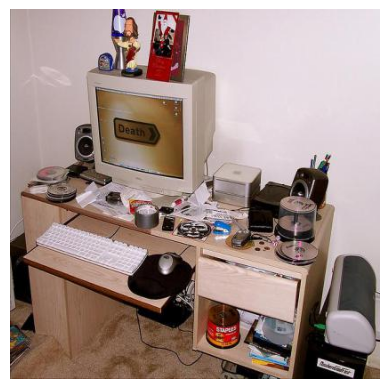

Top 5 Similar Images:


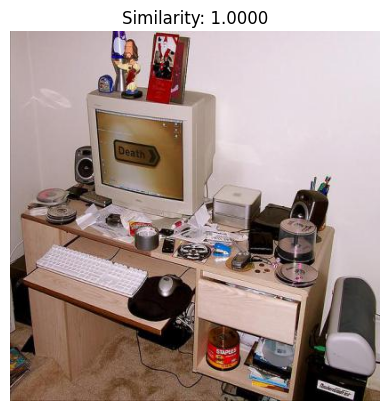

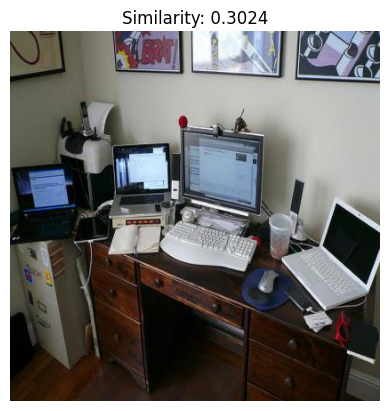

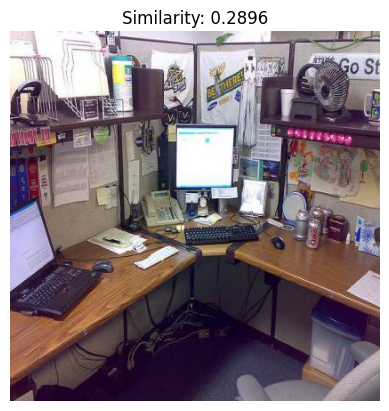

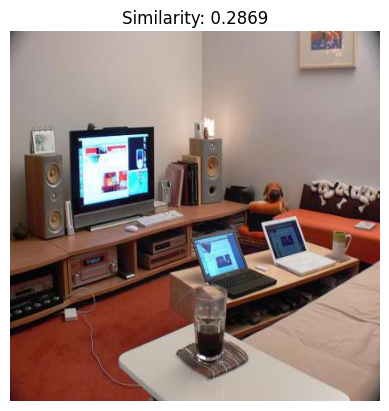

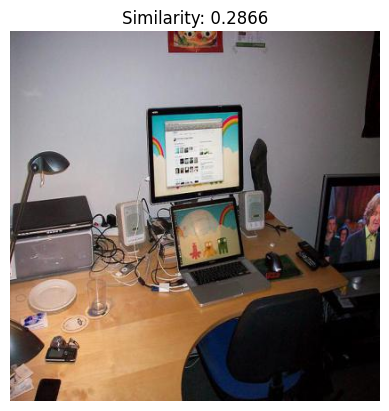

In [25]:
# Function to randomly select a query image from the training dataset
def get_random_query_image():
    random_index = random.randint(0, len(image_paths) - 1)
    return image_paths[random_index]

# Test retrieval with a random query image
QUERY_IMAGE_PATH = get_random_query_image()  # Automatically select a random query image

# Find similar images
results = find_similar_images(QUERY_IMAGE_PATH)

# Display the query image
print("Query Image:")
query_img = cv2.imread(QUERY_IMAGE_PATH)[:, :, ::-1]  # Convert BGR to RGB
plt.imshow(query_img)
plt.axis("off")
plt.show()

# Display the top N similar images
print("Top 5 Similar Images:")
for result_path, similarity in results:
    result_img = cv2.imread(result_path)[:, :, ::-1]  # Convert BGR to RGB
    plt.figure()
    plt.title(f"Similarity: {similarity:.4f}")
    plt.imshow(result_img)
    plt.axis("off")
    plt.show()


# Training a Custom VGG16 Model for Image Retrieval
# Model Setup

### Purpose:
- Set up the computation device (CPU or GPU) for efficient training and inference.
- Load the pretrained VGG16 model and extract its feature extraction layers.

### Explanation:
1. **Device Selection**:
   - The device is set to GPU if available, else defaults to CPU.
   - GPU significantly accelerates training and inference.
2. **Feature Extraction**:
   - `models.vgg16(pretrained=True)` loads the VGG16 model with pretrained weights.
   - `.features` extracts the convolutional layers of VGG16 for use as a feature extractor.





In [26]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [27]:
# Load pretrained VGG16 model and extract feature extractor
finetune_vgg16 = models.vgg16(pretrained=True).features


d:\python install\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\python install\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


# Freezing Layers, Fully Connected Layers, and Data Transformations

## Purpose:
1. **Freeze Layers**: Prevent updates to the convolutional layers of the pretrained VGG16 to retain their learned features.
2. **Define Fully Connected Layers**: Add custom fully connected layers for multi-class classification (80 classes in this case).
3. **Fine-Tuning**: Allow only the newly added fully connected layers to be updated during training.
4. **Data Augmentation and Preprocessing**: Apply transformations to improve model robustness and prepare input images for training.

---

## Key Steps:

### 1. Freezing Convolutional Layers
- The convolutional layers of VGG16 are pretrained on ImageNet and are used as feature extractors.
- Freezing these layers ensures their weights are not updated, preserving their pretrained knowledge.
- This is done by setting `param.requires_grad = False` for all parameters in the convolutional layers.

---

### 2. Fully Connected Layers
- The flattened output from VGG16’s feature extractor is passed through the custom fully connected layers:
  - **Layer 1**: Maps the high-dimensional features (512 × 7 × 7) to 256 neurons with a dropout of 50% for regularization.
  - **Layer 2**: Further reduces the dimensionality to 128 neurons with another dropout.
  - **Output Layer**: Maps the output to 80 neurons, corresponding to the 80 classes in the dataset.

---

### 3. Fine-Tuning Fully Connected Layers
- Fine-tuning involves enabling gradient computation for the parameters of the fully connected layers.
- This allows the fully connected layers to learn task-specific representations during training.

---

### 4. Data Augmentation and Preprocessing
- **Augmentations**:
  - Horizontal flipping, random rotation, color jittering, and random cropping add variability to the training data.
  - These augmentations help prevent overfitting and improve the model’s ability to generalize.
- **Preprocessing**:
  - Resize all images to 224x224 pixels to match VGG16’s input requirements.
  - Normalize the image pixel values using ImageNet's mean and standard deviati


In [28]:
finetune_vgg16 = models.vgg16(pretrained=True).features
NUM_CLASSES = 80  # Number of classes in your dataset
for param in finetune_vgg16.parameters():
    param.requires_grad = False

# Define a new model that outputs the feature vectors and includes a classification head
class FeatureExtractorWithClassifier(nn.Module):
    def __init__(self, vgg16_features, num_classes):
        super(FeatureExtractorWithClassifier, self).__init__()
        self.features = vgg16_features
        self.avgpool = nn.AdaptiveAvgPool2d((7, 7))  # Adaptive pooling to get a fixed size output
        self.flatten = nn.Flatten()
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 256),  # Fully connected layer
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(256, 128),  # Another fully connected layer
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(128, num_classes),  # Output layer for classification
        )

    def forward(self, x):
        x = self.features(x)  # Extract features
        x = self.avgpool(x)  # Adaptive pooling
        x = self.flatten(x)  # Flatten the features
        return self.classifier(x)  # Pass through the classifier

    def extract_feature_vectors(self, x):
        """Extract feature vectors before the classification head."""
        x = self.features(x)  # Extract features
        x = self.avgpool(x)  # Adaptive pooling
        x = self.flatten(x)  # Flatten the features
        return x  # Return feature vectors (shape: [batch_size, 512 * 7 * 7])

# Create the feature extractor model
feature_extractor = FeatureExtractorWithClassifier(finetune_vgg16, NUM_CLASSES).to(device)

# Data transformations with additional augmentations
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.RandomCrop(224, padding=4),  # Added random crop
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])


# Loading YOLO Labels, Images, and Setting Up the Training Pipeline

## Purpose:
1. **Load YOLO Labels**:
   - Parse multi-class annotations from YOLO format files.
   - Convert the annotations into binary vectors for multi-label classification.
2. **Load Images and Preprocess**:
   - Read images from the dataset folder and apply data transformations.
   - Match each image with its corresponding label vector.
3. **Dataset and DataLoader**:
   - Organize the data into PyTorch datasets and dataloaders for training and testing.
4. **Loss Function and Optimizer**:
   - Use a suitable loss function for multi-label classification.
   - Implement an optimizer and a learning rate scheduler for efficient training.

---

## Key Steps:

### 1. Loading YOLO Labels for Multi-Class Classification
- Each `.txt` file contains YOLO annotations, where the first value in each line is the class label.
- For each `.txt` file:
  - Initialize a binary vector of size equal to the number of classes.
  - Set the indices corresponding to the class labels present in the file to 1.
- Store the binary label vectors in a dictionary, with the file ID (image name without extension) as the key.

---

### 2. Loading Images and Matching Labels
- The function reads images from the specified folder and matches each image with its label vector using the dictionary.
- The image is preprocessed using a series of transformations:
  - Resizing, cropping, normalization, and augmentations (e.g., flipping and rotation).
- The images and their corresponding label vectors are converted into PyTorch tensors.

---

### 3. Dataset and DataLoader
- **Dataset**:
  - Combines the preprocessed images and labels into a `TensorDataset`.
  - This makes the data compatible with PyTorch’s DataLoader for batching.
- **DataLoader**:
  - Splits the dataset into batches for efficient processing during training.
  - The training data is shuffled to introduce variability, ensuring better generalization.

---

### 4. Loss Function
- The `BCEWithLogitsLoss` is used for multi-label classification tasks:
  - It combines a sigmoid activation function with binary cross-entropy loss.
  - This is particularly useful for datasets where each sample can belong to multiple classes.
- Class weights can be adjusted to account for class imbalances in the dataset.

---

### 5. Optimizer and Scheduler
- **Optimizer**:
  - The AdamW optimizer is used for training, providing adaptive learning rates and weight decay for better regularization.
- **Scheduler**:
  - A step learning rate scheduler reduces the learning rate by a factor (`gamma`) every `step_size` epochs.
  - This helps in fine-tuning the model as the training progresses, preventing overfitting or oscillations in loss.

---

## Discussion:

1. **Efficiency**:
   - Precomputing labels reduces computational overhead during training.
   - Data loading is optimized with batch processing using DataLoader.

2. **Robustness**:
   - The data augmentation pipeline (e.g., flipping, cropping, and rotation) ensures the model learns to generalize across variations in the dataset.
   - Normalizing the input data aligns it with the distribution expected by pretrained models.

3. **Customizability**:
   - The number of classes can be adjusted by modifying the `NUM_CLASSES` variable.
   - Class weights for the loss function can be tailored to address imbalanced datasets.
   - The learning rate and scheduler settings can be adjusted based on the specific requirements of the dataset or model behavior.

This step is essential to set up the data pipeline and loss functions required for efficient and robust model training.


In [29]:
# Function to load YOLO labels for multi-class
def load_labels_multiclass(label_folder, num_classes):
    labels_dict = {}
    for label_file in tqdm(os.listdir(label_folder), desc="Loading Labels", unit="file"):
        if label_file.endswith(".txt"):
            file_path = os.path.join(label_folder, label_file)
            with open(file_path, "r") as f:
                lines = f.readlines()
                label_vector = [0] * num_classes
                for line in lines:
                    class_label = int(line.split()[0])
                    label_vector[class_label] = 1
                labels_dict[label_file.replace(".txt", "")] = label_vector
    return labels_dict

# Function to load images and their multi-class labels
def load_images_with_labels_multiclass(images_folder, labels_dict, transform):
    images, labels = [], []
    for filename in tqdm(os.listdir(images_folder), desc="Loading Images", unit="image"):
        if filename.endswith(".jpg") or filename.endswith(".png"):
            file_id = os.path.splitext(filename)[0]
            if file_id in labels_dict:
                img_path = os.path.join(images_folder, filename)
                img = cv2.imread(img_path)
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                img = Image.fromarray(img)
                img = transform(img)
                images.append(img)
                labels.append(labels_dict[file_id])
    return torch.stack(images), torch.tensor(labels, dtype=torch.float32)

# Number of classes in your dataset
NUM_CLASSES = 80  # Change this to the actual number of classes in your dataset

# Load YOLO labels for multi-class
print("Loading YOLO Labels")
train_yolo_labels = load_labels_multiclass(TRAIN_LABELS_PATH, NUM_CLASSES)
test_yolo_labels = load_labels_multiclass(TEST_LABELS_PATH, NUM_CLASSES)

# Load train images and labels for multi-class
print("Loading Train Images and Labels")
train_images, train_labels = load_images_with_labels_multiclass(TRAIN_IMAGES_PATH, train_yolo_labels, transform)
test_images, test_labels = load_images_with_labels_multiclass(TEST_IMAGES_PATH, test_yolo_labels, transform)

# Create dataset and dataloader
train_dataset = data.TensorDataset(train_images, train_labels)
train_loader = data.DataLoader(train_dataset, batch_size=8, shuffle=True)
test_dataset = data.TensorDataset(test_images, test_labels)
test_loader = data.DataLoader(test_dataset, batch_size=8, shuffle=True)

# Define the loss function with class weights (if needed)
class_weights = torch.tensor([1.0] * NUM_CLASSES).float()  # Adjust as needed for class imbalance
criterion = nn.BCEWithLogitsLoss(weight=class_weights).to(device)  # Binary Cross-Entropy Loss for multi-label classification

# Use AdamW optimizer and a learning rate scheduler
optimizer = optim.AdamW(feature_extractor.parameters(), lr=1e-4)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)

Loading YOLO Labels


Loading Labels: 100%|██████████| 1034/1034 [00:07<00:00, 144.15file/s]


Loading Train Images and Labels


Loading Images: 100%|██████████| 1034/1034 [00:11<00:00, 91.41image/s]


# Model Training Loop

## Purpose:
1. **Train the Model**:
   - Optimize the model’s parameters over multiple epochs to minimize the loss function.
   - Update weights based on gradients computed during backpropagation.
2. **Track Metrics**:
   - Compute and track training loss for each epoch to monitor model performance.
3. **Adjust Learning Rate**:
   - Use a scheduler to reduce the learning rate periodically, allowing finer adjustments in later stages of training.

---

## Key Steps:

### 1. Epoch Iteration
- The training loop runs for a predefined number of epochs (`num_epochs`).
- At the start of each epoch, the model is set to training mode using `model.train()`.
  - This enables behaviors like dropout and batch normalization to function appropriately during training.

---

### 2. Batch Processing
- Images and labels are loaded in batches using the `train_loader`.
- Each batch is transferred to the computation device (CPU or GPU) for processing.
- **Steps for each batch**:
  1. **Forward Pass**:
     - The model processes the input images to produce predictions (`outputs`).
  2. **Loss Computation**:
     - The predictions are compared with the true labels to compute the loss using the criterion (`BCEWithLogitsLoss`).
  3. **Backward Pass**:
     - Gradients of the loss with respect to the model’s parameters are computed via `loss.backward()`.
  4. **Parameter Update**:
     - The optimizer updates the model’s parameters using the computed gradients via `optimizer.step()`.
  5. **Metric Update**:
     - The batch loss is added to the cumulative training loss for the epoch.

---

### 3. Epoch Metrics
- After processing all batches in the epoch:
  - The average training loss is computed by dividing the cumulative loss by the number of batches.
  - This provides a single value summarizing the model’s performance over the epoch.
- The average loss is printed to track the model's improvement across epochs.

---

### 4. Learning Rate Adjustment
- The learning rate scheduler (`scheduler.step()`) reduces the learning rate after a specified number of epochs (`step_size`).
- Lowering the learning rate in later epochs allows the model to make finer adjustments, reducing the risk of overshooting the loss minimum.

---

## Discussion:

1. **Purpose of Epochs**:
   - Training over multiple epochs ensures the model has sufficient opportunities to learn patterns in the dataset.

2. **Batch Processing**:
   - Using batches instead of processing all data at once reduces memory usage and accelerates training.
   - It introduces noise in gradient updates, which can improve generalization.

3. **Metric Tracking**:
   - The training loss helps monitor whether the model is learning effectively.
   - A consistently decreasing training loss across epochs indicates good progress.

4. **Learning Rate Scheduler**:
   - Adjusting the learning rate dynamically prevents large updates in later stages, helping the model converge smoothly.

5. **Model Mode**:
   - The `train()` mode ensures that components like dropout are active, which is essential for preventing overfitting.

This training loop is a critical component of the model pipeline, ensuring efficient optimization and monitoring of performance.


In [30]:
num_epochs = 10
for epoch in range(num_epochs):
    print(f"Epoch {epoch + 1}/{num_epochs}")
    feature_extractor.train()  # Set model to training mode
    train_loss = 0.0

    for images, labels in tqdm(train_loader, desc="Training", unit="batch"):
        images, labels = images.to(device), labels.to(device)

        # Forward pass
        outputs = feature_extractor(images)  # Output shape: [batch_size, NUM_CLASSES]
        loss = criterion(outputs, labels)

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Update training metrics
        train_loss += loss.item()

    train_loss /= len(train_loader)
    print(f"Training Loss: {train_loss:.4f}")

    # Step the scheduler
    scheduler.step()

Epoch 1/10


Training: 100%|██████████| 1035/1035 [00:39<00:00, 25.93batch/s]


Training Loss: 0.1937
Epoch 2/10


Training: 100%|██████████| 1035/1035 [00:51<00:00, 20.25batch/s]


Training Loss: 0.1264
Epoch 3/10


Training: 100%|██████████| 1035/1035 [00:57<00:00, 17.87batch/s]


Training Loss: 0.1101
Epoch 4/10


Training: 100%|██████████| 1035/1035 [00:57<00:00, 17.88batch/s]


Training Loss: 0.1007
Epoch 5/10


Training: 100%|██████████| 1035/1035 [01:03<00:00, 16.25batch/s]


Training Loss: 0.0933
Epoch 6/10


Training: 100%|██████████| 1035/1035 [01:06<00:00, 15.48batch/s]


Training Loss: 0.0861
Epoch 7/10


Training: 100%|██████████| 1035/1035 [01:07<00:00, 15.35batch/s]


Training Loss: 0.0824
Epoch 8/10


Training: 100%|██████████| 1035/1035 [01:12<00:00, 14.29batch/s]


Training Loss: 0.0795
Epoch 9/10


Training: 100%|██████████| 1035/1035 [01:14<00:00, 13.85batch/s]


Training Loss: 0.0767
Epoch 10/10


Training: 100%|██████████| 1035/1035 [01:14<00:00, 13.81batch/s]

Training Loss: 0.0747


# Image Retrieval Pipeline Explanation

This code implements a pipeline for retrieving similar images from a dataset using a pre-trained VGG16 model. Below is a step-by-step explanation of the process:

---

## 1. **Selecting a Small Batch of Images**
   - The function `select_small_batch` selects a small subset of images from a given list of image paths.
   - The `batch_size` parameter controls the number of images to select (default is 10).
   - This is useful for testing the retrieval system on a smaller scale.

In [31]:
import random

# Function to randomly select a small batch of images
def select_small_batch(image_paths, batch_size=10):
    return random.sample(image_paths, min(batch_size, len(image_paths)))

# Select a small batch of images
small_batch = select_small_batch(image_paths, batch_size=10)
print("Selected Batch:", small_batch)

Selected Batch: ['D:\\Projects\\CV_project\\COCO.v2i.yolov5pytorch\\train\\images\\000000478812_jpg.rf.fb3b0881c5ee0229a005309c6627cf8b.jpg', 'D:\\Projects\\CV_project\\COCO.v2i.yolov5pytorch\\train\\images\\000000113756_jpg.rf.629a9532ea871d2339fa1aa88c34182f.jpg', 'D:\\Projects\\CV_project\\COCO.v2i.yolov5pytorch\\train\\images\\000000465198_jpg.rf.6bac0ad62151379082790063bd16b684.jpg', 'D:\\Projects\\CV_project\\COCO.v2i.yolov5pytorch\\train\\images\\000000443129_jpg.rf.472855a8c73c53123e57a0a99969bc39.jpg', 'D:\\Projects\\CV_project\\COCO.v2i.yolov5pytorch\\train\\images\\000000218508_jpg.rf.b429c64271a629f9f00f6ae9a5fd4a23.jpg', 'D:\\Projects\\CV_project\\COCO.v2i.yolov5pytorch\\train\\images\\000000504325_jpg.rf.131572d0224bd9a8c06cc7037449dc43.jpg', 'D:\\Projects\\CV_project\\COCO.v2i.yolov5pytorch\\train\\images\\000000571780_jpg.rf.620bb227f668cd5bfb0be34af8a1d285.jpg', 'D:\\Projects\\CV_project\\COCO.v2i.yolov5pytorch\\train\\images\\000000222411_jpg.rf.6e9e939a4d5b8c27029991

## 2. **Feature Extraction**
The function extract_features processes an image and extracts its features using a fine-tuned VGG16 model.

Steps:

Read the image using OpenCV and convert it from BGR to RGB.

Convert the image to a PIL image and apply transformations (resizing, normalization, etc.).

Add a batch dimension and move the image tensor to the GPU.

Pass the image through the VGG16 model to extract features.

Flatten the features into a 1D vector and move them to the CPU for further processing.

The transform function applies the following transformations:

Resize the image to 224x224 pixels.

Convert the image to a tensor.

Normalize the image using the mean and standard deviation of the ImageNet dataset.

In [32]:
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to 224x224
    transforms.ToTensor(),  # Convert to tensor
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),  # Normalize
])

In [33]:
# Function to extract feature vectors
def extract_features(image_path):
    """Extract feature vectors for a given image."""
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB
    img = Image.fromarray(img)
    img = transform(img)  # Apply transformations
    img = img.unsqueeze(0).to(device)  # Add batch dimension and move to GPU

    with torch.no_grad():
        features = feature_extractor.extract_feature_vectors(img)  # Extract feature vectors
    return features.flatten().cpu().numpy()

## 3. **Retrieving Top-K Similar Images**

The function retrieve_top_k_for_batch retrieves the top-k most similar images for each image in the batch.

It uses the find_similar_images function (not shown in the code) to compute similarity scores and retrieve the top-k matches.

The results are stored in a dictionary where the key is the query image path, and the value is a list of tuples containing the paths of the retrieved images and their similarity scores.

In [34]:
# Function to find similar images
def find_similar_images(query_image_path, image_features, image_paths, top_n=5):
    """Find top-n similar images using cosine similarity."""
    query_features = extract_features(query_image_path)  # Extract query image features
    similarities = cosine_similarity([query_features], image_features)[0]  # Calculate cosine similarity
    top_indices = np.argsort(similarities)[::-1][:top_n]  # Get top N similar images
    return [(image_paths[i], similarities[i]) for i in top_indices]

In [35]:
# Function to retrieve top-k results for a batch of images
def retrieve_top_k_for_batch(batch, image_features, image_paths, top_k=5):
    """Retrieve top-k similar images for a batch of query images."""
    results = {}
    for query_image_path in batch:
        results[query_image_path] = find_similar_images(query_image_path, image_features, image_paths, top_n=top_k)
    return results

## 4. **Displaying Query and Retrieved Images**
The function display_query_and_results visualizes the query image and its top-k retrieved images.

It uses matplotlib to display the images in a grid:

The query image is shown on the left.

The retrieved images are shown on the right, along with their similarity scores.

The pipeline is executed as follows:

A small batch of images is selected using select_small_batch.

The top-k similar images are retrieved for each image in the batch using retrieve_top_k_for_batch.

The query images and their retrieved results are displayed using display_query_and_results.

Query Image: D:\Projects\CV_project\COCO.v2i.yolov5pytorch\train\images\000000525834_jpg.rf.5ca74f5fd7ac2552594996235179f136.jpg


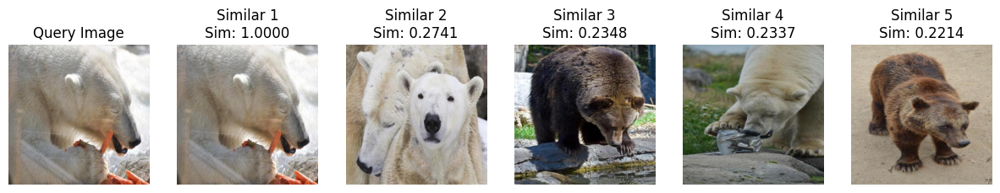

Query Image: D:\Projects\CV_project\COCO.v2i.yolov5pytorch\train\images\000000194184_jpg.rf.cfe0402a27015d605ee8b694387edf1a.jpg


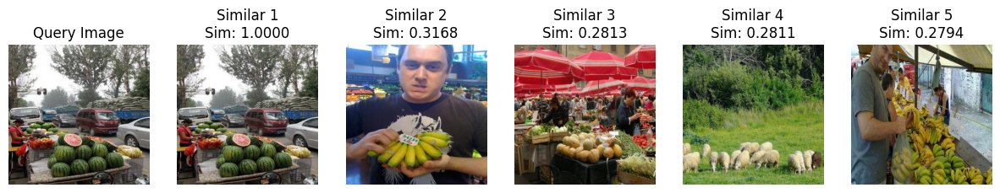

Query Image: D:\Projects\CV_project\COCO.v2i.yolov5pytorch\train\images\000000469543_jpg.rf.4dcf14dc76ea6c0e007f1d93f914803f.jpg


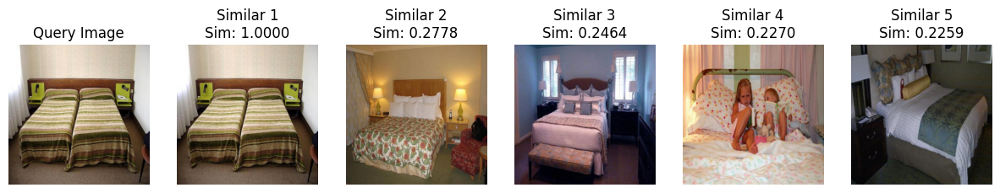

Query Image: D:\Projects\CV_project\COCO.v2i.yolov5pytorch\train\images\000000407178_jpg.rf.ad36ab57cbf3490f88971b5580f0a60c.jpg


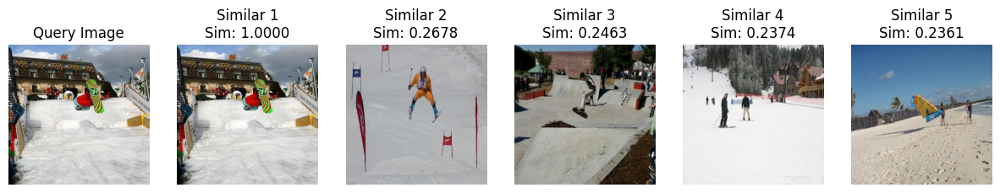

Query Image: D:\Projects\CV_project\COCO.v2i.yolov5pytorch\train\images\000000337422_jpg.rf.08f4bf53b3899d6ea7088e2241be6086.jpg


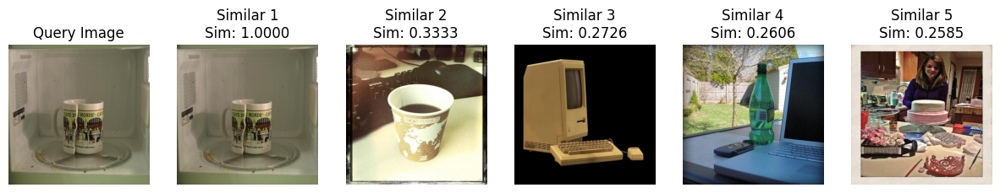

Query Image: D:\Projects\CV_project\COCO.v2i.yolov5pytorch\train\images\000000384085_jpg.rf.a678937ad0745ca0adead91c1025ddf5.jpg


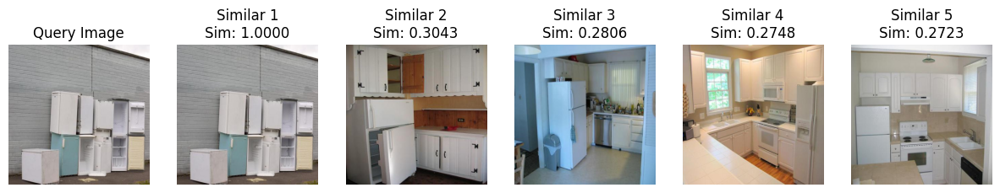

Query Image: D:\Projects\CV_project\COCO.v2i.yolov5pytorch\train\images\000000285099_jpg.rf.85bffdd9b6db5705379b309490a2fc90.jpg


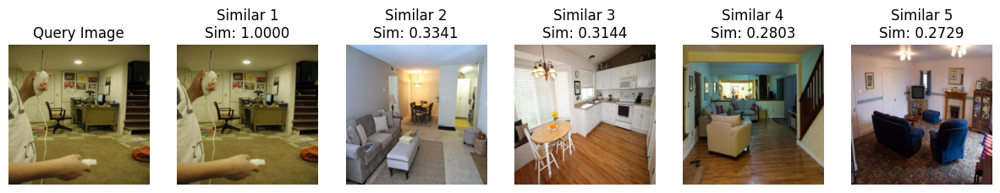

Query Image: D:\Projects\CV_project\COCO.v2i.yolov5pytorch\train\images\000000290812_jpg.rf.3e540d3c1b1ffa2e4bece07442cab8c3.jpg


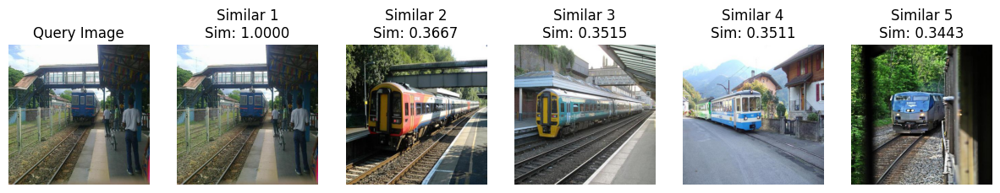

Query Image: D:\Projects\CV_project\COCO.v2i.yolov5pytorch\train\images\000000288156_jpg.rf.b0ec0b7ed9e526731efef57f4557165b.jpg


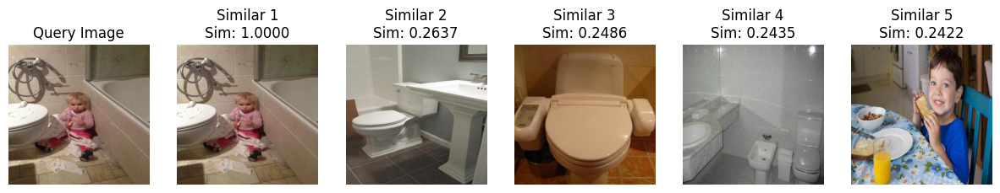

Query Image: D:\Projects\CV_project\COCO.v2i.yolov5pytorch\train\images\000000137332_jpg.rf.b3d0abc082c71218a14310eb21377509.jpg


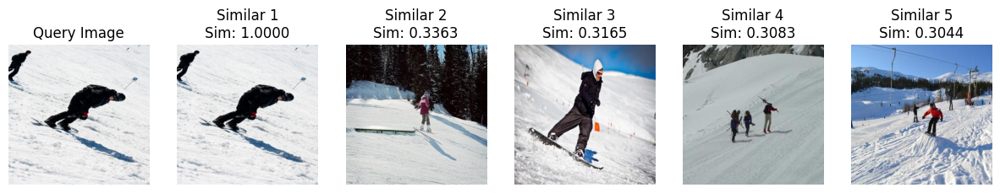

In [115]:
# Function to display query image and its top-k retrieved images
def display_query_and_results(query_image_path, retrieved_images):
    """Display the query image and its top-k retrieved images."""
    query_img = cv2.imread(query_image_path)[:, :, ::-1]  # Convert BGR to RGB
    plt.figure(figsize=(15, 5))
    plt.subplot(1, len(retrieved_images) + 1, 1)
    plt.imshow(query_img)
    plt.title("Query Image")
    plt.axis("off")

    for i, (retrieved_path, similarity) in enumerate(retrieved_images):
        retrieved_img = cv2.imread(retrieved_path)[:, :, ::-1]  # Convert BGR to RGB
        plt.subplot(1, len(retrieved_images) + 1, i + 2)
        plt.imshow(retrieved_img)
        plt.title(f"Similar {i + 1}\nSim: {similarity:.4f}")
        plt.axis("off")
    plt.show()
top_k_results = retrieve_top_k_for_batch(small_batch, image_features, image_paths, top_k=5)


    # Display results for each query in the small batch
for query_image_path, retrieved_images in top_k_results.items():
    print(f"Query Image: {query_image_path}")
    display_query_and_results(query_image_path, retrieved_images)

# Model Evaluation

## Purpose:
1. **Evaluate Model Performance**:
   - Test the trained model on unseen data to assess its generalization.
   - Compute evaluation metrics for multi-label classification (Precision, Recall, F1 Score).
2. **Disable Gradients**:
   - Evaluation does not require gradient computation, making the process faster and memory-efficient.
3. **Handle Multi-Label Classification**:
   - Use sigmoid activation to convert logits into probabilities.
   - Apply a threshold to binarize predictions for multi-label classification.

---

## Key Steps:

### 1. Set Model to Evaluation Mode
- `model.eval()`:
  - Disables layers like dropout and batch normalization, ensuring consistent behavior during evaluation.
- The model is prepared to make predictions without any changes to its weights.

---

### 2. Disable Gradient Computation
- `torch.no_grad()`:
  - Prevents PyTorch from calculating gradients during evaluation, saving memory and computation time.
  - Gradients are not needed because we are not updating model weights during evaluation.

---

### 3. Forward Pass and Predictions
- **Forward Pass**:
  - The test data is passed through the model to generate raw outputs (logits).
- **Sigmoid Activation**:
  - Converts logits into probabilities ranging between 0 and 1.
- **Binarization**:
  - Predictions are converted to binary values (0 or 1) based on a threshold (default: 0.5).
  - A value greater than the threshold is classified as 1 (positive), otherwise 0 (negative).

---

### 4. Store Labels and Predictions
- Labels and predictions for each batch are stored in lists (`all_labels` and `all_preds`).
- At the end of the loop, the lists are concatenated into arrays for metric computation.

---

### 5. Compute Evaluation Metrics
- **Precision**:
  - The ratio of correctly predicted positive samples to the total predicted positives.
- **Recall**:
  - The ratio of correctly predicted positive samples to the total actual positives.
- **F1 Score**:
  - The harmonic mean of precision and recall, balancing both metrics.
- Metrics are computed using the `precision_score`, `recall_score`, and `f1_score` functions from `sklearn`.

---

### 6. Print and Return Metrics
- Precision, Recall, and F1 Score are printed for easy monitoring.
- The metrics are returned for further analysis or logging.

---

## Discussion:

1. **Evaluation Without Gradients**:
   - Reduces computational cost and prevents accidental weight updates during testing.

2. **Multi-Label Handling**:
   - Sigmoid activation ensures that each class’s probability is independent, which is crucial for multi-label classification.
   - The threshold allows control over the sensitivity of predictions.

3. **Metrics for Multi-Label Classification**:
   - Precision, Recall, and F1 Score are computed with the `micro` averaging method, which aggregates contributions from all classes for computation.
   - These metrics provide a comprehensive view of the model’s performance.

4. **Consistency and Reproducibility**:
   - Using `model.eval()` ensures consistent predictions during evaluation.
   - The process allows systematic testing and comparison across different models or training configurations.

This evaluation function is essential for assessing the model’s ability to generalize to unseen data and measuring its performance in a structured manner.


In [36]:
# Function to evaluate the model on test data
def evaluate_model(model, test_loader, device, threshold=0.5):
    model.eval()  # Set model to evaluation mode
    all_labels = []
    all_preds = []

    with torch.no_grad():  # Disable gradient computation for evaluation
        for images, labels in tqdm(test_loader, desc="Evaluating", unit="batch"):
            images, labels = images.to(device), labels.to(device)

            # Forward pass
            outputs = model(images)

            # Apply sigmoid activation to outputs
            preds = torch.sigmoid(outputs)

            # Binarize predictions using the threshold
            preds = (preds > threshold).float()

            # Store labels and predictions for metric computation
            all_labels.append(labels.cpu().numpy())
            all_preds.append(preds.cpu().numpy())

    # Concatenate all labels and predictions
    all_labels = np.vstack(all_labels)
    all_preds = np.vstack(all_preds)

    # Compute evaluation metrics for multi-label classification
    precision = precision_score(all_labels, all_preds, average='micro')
    recall = recall_score(all_labels, all_preds, average='micro')
    f1 = f1_score(all_labels, all_preds, average='micro')

    print(f"Precision: {precision:.4f}")
    print(f"Recall: {recall:.4f}")
    print(f"F1 Score: {f1:.4f}")

    return precision, recall, f1

# Evaluate the model on the test data
precision, recall, f1 = evaluate_model(feature_extractor, test_loader, device)

Evaluating: 100%|██████████| 130/130 [00:04<00:00, 30.44batch/s]

Precision: 0.7616
Recall: 0.3817
F1 Score: 0.5086


# Precision and Recall at 5

In [ ]:
import numpy as np
from sklearn.metrics import label_ranking_average_precision_score

def evaluate_recall_precision_at_k(model, test_loader, device, k=5):

    model.eval()  # Set model to evaluation mode
    all_labels = []
    all_preds = []

    with torch.no_grad():  # Disable gradient computation for evaluation
        for images, labels in tqdm(test_loader, desc="Evaluating", unit="batch"):
            images, labels = images.to(device), labels.to(device)

            # Forward pass
            outputs = model(images)

            # Apply sigmoid activation to outputs
            preds = torch.sigmoid(outputs)

            # Store labels and predictions for metric computation
            all_labels.append(labels.cpu().numpy())
            all_preds.append(preds.cpu().numpy())

    # Concatenate all labels and predictions
    all_labels = np.vstack(all_labels)
    all_preds = np.vstack(all_preds)

    # Compute Recall@k and Precision@k
    recall_at_k = 0.0
    precision_at_k = 0.0
    num_samples = all_labels.shape[0]

    for i in range(num_samples):
        true_labels = all_labels[i]
        pred_scores = all_preds[i]

        # Get the top-k predicted classes
        top_k_indices = np.argsort(pred_scores)[-k:][::-1]
        top_k_preds = np.zeros_like(true_labels)
        top_k_preds[top_k_indices] = 1

        # Compute true positives, false positives, and false negatives
        true_positives = np.sum(true_labels * top_k_preds)
        false_positives = np.sum(top_k_preds) - true_positives
        false_negatives = np.sum(true_labels) - true_positives

        # Update Recall@k and Precision@k
        recall_at_k += true_positives / (true_positives + false_negatives + 1e-10)
        precision_at_k += true_positives / (true_positives + false_positives + 1e-10)

    # Average over all samples
    recall_at_k /= num_samples
    precision_at_k /= num_samples

    print(f"Recall@{k}: {recall_at_k:.4f}")
    print(f"Precision@{k}: {precision_at_k:.4f}")

    return recall_at_k, precision_at_k

# Evaluate Recall@k and Precision@k
k = 5  # Number of top predictions to consider
without_recall_at_k, without_precision_at_k = evaluate_recall_precision_at_k(feature_extractor, test_loader, device, k=k)

Evaluating: 100%|██████████| 130/130 [00:04<00:00, 29.98batch/s]

Recall@5: 0.6974
Precision@5: 0.3609


---
---
# Saliency Maps Using Grad-CAM with YOLOv5
---
---

### **Overview**
Grad-CAM (Gradient-weighted Class Activation Mapping) is a technique used to generate saliency maps, which highlight the regions in an image that contribute most to a model's decision. This implementation focuses on generating saliency maps using the YOLOv5 architecture and ResNet50 as an example.


### **1. Model Loading**
- **ResNet50**:
  - A pretrained ResNet50 model is loaded using PyTorch's `torchvision.models`.
  - The model is set to evaluation mode (`model.eval()`), ensuring no changes to weights or batch normalization statistics during inference.


### **2. Grad-CAM Saliency Map**
Grad-CAM operates by using the gradients of a target output (e.g., a class score) with respect to the final convolutional layer of the model to produce a heatmap.

#### **Key Steps**:
1. **Forward Pass**:
   - Input image is passed through the model to obtain predictions.
2. **Backward Pass**:
   - Gradients of the target class score are computed with respect to the feature maps in the last convolutional layer.
3. **Gradient Aggregation**:
   - Gradients are pooled (averaged) spatially to generate weights that represent the importance of each feature map.
4. **Weighted Feature Maps**:
   - Feature maps are combined using the computed weights to create the saliency map.
5. **Visualization**:
   - The saliency map is upsampled to match the input image size and overlaid on the original image for better interpretability.



### **3. Use with YOLOv5**
While Grad-CAM is generally applied to classification models like ResNet50, the technique can be adapted for object detection models such as YOLOv5:
- **Intermediate Layers**:
  - Grad-CAM can target specific layers within YOLOv5's feature pyramid or detection heads.
- **Multiple Objects**:
  - Saliency maps can be generated for each detected object, focusing on regions contributing to bounding box predictions or class scores.
  


### **4. Applications**
- **Model Explainability**:
  - Grad-CAM provides insights into the decision-making process of neural networks by highlighting important regions in the input.
- **Error Analysis**:
  - Helps identify cases where the model is focusing on incorrect or irrelevant parts of an image.
- **Object Detection Debugging**:
  - Grad-CAM can reveal how YOLOv5 detects objects and what features it considers important.



### **5. Example Workflow**
1. **Image Preprocessing**:
   - Resize and normalize the input image.
2. **Model Inference**:
   - Pass the preprocessed image through the model to get predictions.
3. **Grad-CAM Implementation**:
   - Compute gradients for the target class and generate the saliency map.
4. **Visualization**:
   - Overlay the saliency map on the original image.



### **6. Visualization**
- **Saliency Maps**:
  - Highlight regions in the image contributing to the model’s predictions.
- **Overlayed Heatmaps**:
  - Provide an intuitive understanding of the areas the model "sees" as important.



### **Key Insights**
Grad-CAM and saliency maps are powerful tools for understanding and debugging neural network predictions. Their integration with YOLOv5 enhances transparency in object detection tasks by showing how the model interprets input images during inference.


In [73]:
# Load ResNet model
resnet_model = models.resnet18(pretrained=True)
resnet_model.eval()  # Set to evaluation mode

d:\python install\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\python install\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
  

# Grad-CAM Implementation for Saliency Map Generation

### **1. Overview**
The `GradCAM` class is a custom implementation of the Gradient-weighted Class Activation Mapping (Grad-CAM) technique. It is used to generate saliency maps that highlight the important regions in an input image contributing to a model's decision.

---

### **2. Class Structure**
#### **`GradCAM` Initialization**
- **Inputs**:
  - `model`: The neural network model (e.g., ResNet, YOLOv5).
  - `target_layer`: The specific layer in the model where Grad-CAM will focus (typically the last convolutional layer).
- **Attributes**:
  - `gradients`: Stores the gradients flowing back through the `target_layer`.
  - `activations`: Stores the feature maps generated by the `target_layer`.
- **Hook Registration**:
  - Forward and backward hooks are registered to capture the activations and gradients during forward and backward passes.

---

### **3. Hook Functions**
- **Forward Hook**:
  - Captures the activations (feature maps) generated by the `target_layer` during the forward pass.
- **Backward Hook**:
  - Captures the gradients flowing through the `target_layer` during the backward pass.

---

### **4. Grad-CAM Workflow**
#### **Call Method (`__call__`)**
- **Input**:
  - `input_tensor`: The preprocessed input image in tensor form.
  - `class_idx`: The target class index for which the saliency map will be generated (default: highest predicted class).
- **Forward Pass**:
  - The input tensor is passed through the model to obtain predictions.
- **Backward Pass**:
  - Gradients are computed for the target class by creating a one-hot encoded vector and performing backpropagation.
- **Grad-CAM Computation**:
  - **Weights**:
    - Calculated by averaging the gradients spatially for each feature map.
  - **Weighted Combination**:
    - Feature maps from the forward pass are weighted using the computed weights to highlight important regions.
  - **ReLU Activation**:
    - Negative values are removed to focus on regions positively influencing the decision.
  - **Normalization**:
    - The resulting saliency map is normalized to lie between 0 and 1 for better visualization.

---

### **5. Output**
- **Saliency Map**:
  - A 2D heatmap highlighting the important regions in the input image that contributed most to the target class prediction.

---

### **6. Applications**
- **Explainability**:
  - Understand the model's decision-making process by visualizing which regions of the image influenced the prediction.
- **Error Debugging**:
  - Identify cases where the model focuses on irrelevant or incorrect regions of the image.
- **Model Evaluation**:
  - Validate the reliability of the model's predictions by analyzing its focus areas.

---

### **7. Key Insights**
- Grad-CAM is model-agnostic and can be applied to any CNN-based architecture, including ResNet, VGG, or YOLOv5.
- The `GradCAM` class provides a reusable and flexible implementation, allowing users to specify the target layer and analyze any desired class prediction.
- The generated saliency maps enhance the interpretability and transparency of deep learning models in image-based tasks.


In [74]:
class GradCAM:
    def __init__(self, resnet_model, target_layer):
        self.resnet_model = resnet_model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self._register_hooks()

    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.activations = output

        def backward_hook(module, grad_input, grad_output):
            self.gradients = grad_output[0]

        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_backward_hook(backward_hook)

    def __call__(self, input_tensor, class_idx=None):
        # Forward pass
        output = self.resnet_model(input_tensor)
        if class_idx is None:
            class_idx = torch.argmax(output, dim=1).item()

        # Backward pass
        self.resnet_model.zero_grad()
        one_hot = torch.zeros_like(output)
        one_hot[0, class_idx] = 1
        output.backward(gradient=one_hot)

        # Calculate Grad-CAM
        weights = torch.mean(self.gradients, dim=(2, 3), keepdim=True)
        cam = torch.sum(weights * self.activations, dim=1).squeeze().detach().cpu().numpy()
        cam = np.maximum(cam, 0)  # ReLU activation
        cam = cam / (np.max(cam) + 1e-8)  # Avoid division by zero

        # cam = cam / np.max(cam)  # Normalize
        return cam

# Generating and Saving Multiple Saliency Maps with Grad-CAM

### **1. Overview**
The `generate_and_save_multiple_saliency_maps` function automates the process of generating Grad-CAM saliency maps for multiple images. It preprocesses images, generates saliency maps using the Grad-CAM technique, overlays the maps on the original images, and saves the results.

---

### **2. Input Parameters**
- **`image_paths`**:
  - A list of file paths pointing to the images for which saliency maps are to be generated.
- **`model`**:
  - The pre-trained deep learning model (e.g., ResNet, VGG).
- **`target_layer`**:
  - The specific layer of the model (usually the last convolutional layer) to be used for Grad-CAM.
- **`output_dir`**:
  - The directory where the original images and their corresponding saliency maps will be saved. Defaults to `"output"`.

---

### **3. Workflow**
1. **Create Output Directory**:
   - Ensures the specified directory for saving results exists.
2. **Iterate Through Images**:
   - Each image in the input list is processed one by one.
3. **Image Preprocessing**:
   - Images are resized to `224x224`, normalized, and converted to PyTorch tensors.
4. **Grad-CAM Initialization**:
   - The `GradCAM` class is instantiated with the model and target layer.
5. **Generate Saliency Map**:
   - A saliency map is computed for the given input image tensor.
6. **Postprocessing**:
   - The saliency map is resized to match the original image dimensions.
   - A heatmap is generated and overlaid on the original image to highlight important regions.
7. **Save Results**:
   - The original image and the saliency map overlay are saved as separate files in the output directory.
8. **Visualization**:
   - The original image and saliency map overlay are displayed side by side for each processed image.

---

### **4. Output**
- **Saved Images**:
  - **Original Image**: The input image saved as is.
  - **Saliency Map**: The Grad-CAM heatmap overlaid on the original image.
- **Visualization**:
  - Displays a comparison of the original image and the saliency map side by side.
- **Returned List**:
  - A list of tuples containing paths to the saved original images and their corresponding saliency maps.

---

### **5. Applications**
- **Explainability**:
  - Helps visualize which regions of an image are most significant for the model’s predictions.
- **Model Debugging**:
  - Highlights areas the model focuses on, aiding in identifying potential biases or errors.
- **Batch Processing**:
  - Enables processing multiple images at once, making it suitable for large-scale analysis.

---

### **6. Example Workflow**
1. **Input**: Provide a list of image paths to be analyzed.
2. **Processing**:
   - Generate Grad-CAM heatmaps for all images using the specified model and layer.
3. **Output**:
   - Saved images (original and saliency maps) in the output directory.
   - Visual comparison for quick qualitative analysis.

---

### **7. Key Insights**
- **Automation**:
  - This function streamlines the process of generating and saving Grad-CAM saliency maps for multiple images.
- **Reusability**:
  - The modular structure makes it easy to integrate with different models and datasets.
- **Visualization**:
  - Side-by-side comparison of original images and saliency maps enhances interpretability.

This workflow provides a robust pipeline for generating, saving, and analyzing Grad-CAM saliency maps, improving model transparency and explainability.


In [75]:
def generate_and_save_multiple_saliency_maps(image_paths, resnet_model, target_layer, output_dir="output"):
    # Ensure output directory exists
    os.makedirs(output_dir, exist_ok=True)

    saved_images = []  # To store paths of saved images

    for i, image_path in enumerate(image_paths):
        # Load the original image
        image = Image.open(image_path).convert("RGB")

        # Define transformations
        transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ])

        # Preprocess image
        input_tensor = transform(image).unsqueeze(0)

        # Initialize Grad-CAM
        grad_cam = GradCAM(resnet_model, target_layer)

        # Generate saliency map
        cam = grad_cam(input_tensor)

        # Resize CAM to match the original image size
        cam = cv2.resize(cam, (image.width, image.height))
        heatmap = cv2.applyColorMap(np.uint8(255 * cam), cv2.COLORMAP_JET)
        heatmap = cv2.cvtColor(heatmap, cv2.COLOR_BGR2RGB)

        # Overlay heatmap on the original image
        overlay = np.array(image) * 0.5 + heatmap * 0.5

        # Save original image
        original_image_path = os.path.join(output_dir, f"original_image_{i+1}.jpg")
        image.save(original_image_path)

        # Save saliency map
        saliency_map_path = os.path.join(output_dir, f"saliency_map_{i+1}.jpg")
        saliency_map_image = Image.fromarray((overlay / 255).astype(np.uint8))
        saliency_map_image.save(saliency_map_path)

        # Store saved image paths
        saved_images.append((original_image_path, saliency_map_path))

        # Display both images
        plt.figure(figsize=(12, 6))
        plt.subplot(1, 2, 1)
        plt.imshow(image)
        plt.title("Original Image")
        plt.axis("off")

        plt.subplot(1, 2, 2)
        plt.imshow(overlay / 255)
        plt.title("Saliency Map")
        plt.axis("off")
        plt.show()

    return saved_images

# Generating and Saving Saliency Maps for Sample Images

### **1. Input**
- **Image Paths**:
  - The script processes five sample images from the COCO dataset. Each image path points to a validation image in the dataset.
- **Model and Layer**:
  - Grad-CAM is applied using a specified model (`model`) and target layer (`model.layer4[2]`), which is the last convolutional block of ResNet-like architectures.
- **Output Directory**:
  - Results are saved in a directory named `"output"`.

---

### **2. Workflow**
1. **Grad-CAM Generation**:
   - For each image:
     - A saliency map is generated using Grad-CAM.
     - The saliency map highlights regions most important for the model's predictions.
2. **Saving Results**:
   - **Original Image**: Saved as is.
   - **Saliency Map**: Heatmap overlay on the original image, saved for visualization.
3. **Display Saved Paths**:
   - Outputs the file paths of the saved original images and their corresponding saliency maps.

---

### **3. Output**
- **Saved Images**:
  - Each original image and its saliency map are saved in the `"output"` directory.
- **Console Logs**:
  - Paths of the saved files are printed, allowing for easy verification and access.

---

### **4. Applications**
- **Explainability**:
  - Understand which regions in the images influenced the model's decisions.
- **Evaluation**:
  - Quickly generate and compare saliency maps for multiple images to assess model focus.
- **Batch Processing**:
  - Scales easily to process larger datasets with minimal changes.

---

### **5. Key Insights**
- This script demonstrates the automated generation and storage of Grad-CAM saliency maps for multiple images, making it a powerful tool for model interpretability and debugging.


# Custom Dataset and DataLoader for YOLOv5-Style Dataset

### **1. Transformations**
The script defines a set of transformations to preprocess images for model input:
- **Resize**: Adjusts images to `224x224` pixels to match the input size expected by ResNet.
- **ToTensor**: Converts images into PyTorch tensors.
- **Normalization**: Standardizes pixel values using the mean and standard deviation from the ImageNet dataset.

---

### **2. Custom Dataset**
The `CustomImageDataset` class is a PyTorch dataset tailored for YOLOv5-style image directories:
- **Initialization**:
  - Accepts the directory path containing images.
  - Collects all `.jpg` and `.png` files from the specified folder.
  - Applies the specified transformations (if any) to each image.
- **Length**:
  - Returns the total number of images in the dataset.
- **Get Item**:
  - Loads and processes an image by index.
  - Converts the image to RGB format.
  - Applies transformations and returns the preprocessed image along with its file path.

---

### **3. Dataset Creation**
- **Training Dataset**:
  - Created from the folder containing training images.
- **Validation Dataset**:
  - Created from the folder containing validation images.

---

### **4. DataLoaders**
DataLoaders are used to efficiently manage batches of data:
- **Training DataLoader**:
  - Randomly shuffles training data for each epoch to ensure varied batches.
  - Processes data in batches of 32 for efficient training.
- **Validation DataLoader**:
  - Does not shuffle data, ensuring consistent order for evaluation.
  - Processes data in batches of 32.

---

### **5. Output**
- **Dataset Information**:
  - Prints the total number of samples in the training and validation datasets.
- **Ready-to-Use DataLoaders**:
  - Provides iterable DataLoader objects for training and validation.

---

### **6. Applications**
- **Model Training**:
  - Enables seamless integration of YOLOv5-style image datasets into PyTorch models.
- **Validation and Testing**:
  - Ensures consistent preprocessing for evaluation datasets.
- **Scalability**:
  - Can handle large datasets efficiently with batch processing and shuffling.

---

### **7. Key Insights**
This script provides a robust framework for managing YOLOv5-style datasets, ensuring compatibility with PyTorch models and workflows. It simplifies the process of loading, preprocessing, and batching images for training and evaluation.


In [76]:
# Define transformations
transform = transforms.Compose([
    transforms.Resize((224, 224)),  # Resize to match ResNet input size
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
])

In [77]:
from tqdm import tqdm
import os
import cv2
from PIL import Image
import torch

# Load images and their multi-class labels
def load_images_with_labels_multiclass(images_folder, labels_dict, transform):
    images, labels, image_paths = [], [], []
    for filename in tqdm(os.listdir(images_folder), desc="Loading Images", unit="image"):
        if filename.endswith(".jpg") or filename.endswith(".png"):
            file_id = os.path.splitext(filename)[0]
            if file_id in labels_dict:
                img_path = os.path.join(images_folder, filename)
                img = cv2.imread(img_path)
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                img = Image.fromarray(img)
                img = transform(img)
                images.append(img)
                labels.append(labels_dict[file_id])
                image_paths.append(img_path)  # Store the file path
    return torch.stack(images), torch.tensor(labels, dtype=torch.float32), image_paths

# Load labels and images
train_labels_dict = load_labels_multiclass("D:/Projects/CV_project/COCO.v2i.yolov5pytorch/train/labels", NUM_CLASSES)
train_images, train_labels, train_image_paths = load_images_with_labels_multiclass("D:/Projects/CV_project/COCO.v2i.yolov5pytorch/train/images", train_labels_dict, transform)

test_labels_dict = load_labels_multiclass("D:/Projects/CV_project/COCO.v2i.yolov5pytorch/test/labels", NUM_CLASSES)
test_images, test_labels, test_image_paths = load_images_with_labels_multiclass("D:/Projects/CV_project/COCO.v2i.yolov5pytorch/test/images", test_labels_dict, transform)

valid_labels_dict = load_labels_multiclass("D:/Projects/CV_project/COCO.v2i.yolov5pytorch/valid/labels", NUM_CLASSES)
valid_images, valid_labels, valid_image_paths = load_images_with_labels_multiclass("D:/Projects/CV_project/COCO.v2i.yolov5pytorch/valid/images", valid_labels_dict, transform)



Loading Images: 100%|██████████| 1035/1035 [00:03<00:00, 264.51image/s]


In [78]:
from torch.utils.data import Dataset, DataLoader

class CustomImageDataset(Dataset):
    def __init__(self, images, labels, image_paths):
        self.images = images
        self.labels = labels
        self.image_paths = image_paths  # Store file paths

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        return self.images[idx], self.labels[idx], self.image_paths[idx]

# Create datasets
train_dataset = CustomImageDataset(train_images, train_labels, train_image_paths)
test_dataset = CustomImageDataset(test_images, test_labels, test_image_paths)
valid_dataset = CustomImageDataset(valid_images, valid_labels, valid_image_paths)

# Create data loaders
train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=32, shuffle=False)
valid_loader = DataLoader(valid_dataset, batch_size=32, shuffle=False)

###  Load pre-trained ResNet model

### Model Initialization and Configuration:

1. **Model Setup**:
   - The model is initialized using the pre-trained ResNet50 (`models.resnet50(pretrained=True)`).
   - The final fully connected layer (`model.fc`) is adjusted to match the number of classes (80) in the dataset.

2. **Device Configuration**:
   - The model is moved to either GPU (`cuda`) or CPU (`cpu`) depending on availability using `torch.device`.

3. **Loss Function and Optimizer**:
   - **Loss Function**: `nn.CrossEntropyLoss()` is used for multi-class classification.
   - **Optimizer**: Adam optimizer (`optim.Adam`) is used with a learning rate of `1e-4`.

4. **Learning Rate Scheduler**:
   - A learning rate scheduler (`StepLR`) is set to reduce the learning rate by a factor of 0.1 every 7 epochs.


In [79]:
# Initialize model
finetune_resnet = models.resnet18(pretrained=True)
# Replace the final layer
num_classes = 80  # Adjust to your dataset
resnet_model.fc = nn.Linear(resnet_model.fc.in_features, num_classes)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
finetune_resnet.fc = nn.Linear(finetune_resnet.fc.in_features, num_classes)
finetune_resnet = finetune_resnet.to(device)  # Move model to GPU

# Loss and optimizer
criterion = nn.BCEWithLogitsLoss()
optimizer = optim.Adam(finetune_resnet.parameters(), lr=1e-4)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)


### Model training after fine tunning

The training loop iterates over the dataset for 2 epochs (as per the code, though it's labeled for 5 epochs). In each epoch:

1. The model is set to training mode (`model.train()`).
2. For each batch of input data:
   - The input images are moved to the correct device (GPU/CPU).
   - Random labels are generated (which is a flaw since real labels are needed).
   - The model makes predictions on the inputs.
   - A loss is computed using the `CrossEntropyLoss` criterion.
   - The gradients are computed and used to update the model parameters via backpropagation.
3. The loss is accumulated and printed for each epoch.
4. The learning rate scheduler (`StepLR`) adjusts the learning rate at the end of each epoch.

In [80]:
# Training loop with actual labels
for epoch in range(15):  # Train for 5 epochs
    finetune_resnet.train()
    running_loss = 0.0

    for inputs, labels, _ in train_loader:  # Use actual labels and ignore image_paths
        inputs = inputs.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()
        outputs = finetune_resnet(inputs)  # Remove torch.sigmoid
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    print(f"Epoch {epoch+1}, Loss: {running_loss/len(train_loader):.4f}")
    scheduler.step()

    # Validation phase
    finetune_resnet.eval()  # Set model to evaluation mode
    val_loss = 0.0
    with torch.no_grad():  # Disable gradient computation
        for inputs, labels, _ in valid_loader:  # Ignore image_paths during validation
            inputs, labels = inputs.to(device), labels.to(device)
            outputs = finetune_resnet(inputs)
            loss = criterion(outputs, labels)
            val_loss += loss.item()

    print(f"Epoch {epoch+1}, Validation Loss: {val_loss/len(valid_loader):.4f}")

Epoch 1, Loss: 0.1737
Epoch 1, Validation Loss: 0.0882
Epoch 2, Loss: 0.0797
Epoch 2, Validation Loss: 0.0776
Epoch 3, Loss: 0.0630
Epoch 3, Validation Loss: 0.0739
Epoch 4, Loss: 0.0495
Epoch 4, Validation Loss: 0.0733
Epoch 5, Loss: 0.0381
Epoch 5, Validation Loss: 0.0740
Epoch 6, Loss: 0.0287
Epoch 6, Validation Loss: 0.0744
Epoch 7, Loss: 0.0217
Epoch 7, Validation Loss: 0.0757
Epoch 8, Loss: 0.0160
Epoch 8, Validation Loss: 0.0746
Epoch 9, Loss: 0.0145
Epoch 9, Validation Loss: 0.0744
Epoch 10, Loss: 0.0136
Epoch 10, Validation Loss: 0.0746
Epoch 11, Loss: 0.0127
Epoch 11, Validation Loss: 0.0750
Epoch 12, Loss: 0.0120
Epoch 12, Validation Loss: 0.0756
Epoch 13, Loss: 0.0115
Epoch 13, Validation Loss: 0.0756
Epoch 14, Loss: 0.0108
Epoch 14, Validation Loss: 0.0760
Epoch 15, Loss: 0.0103
Epoch 15, Validation Loss: 0.0760


### Generate and Save Saliency Maps for Train and Test Data

### GradCAM Class:
The `GradCAM` class is used to generate Class Activation Maps (CAMs) for visualizing which parts of the image were most important in the model's prediction. It works by:
1. **Registering Hooks**: It registers forward and backward hooks on the target layer to capture activations and gradients.
2. **Gradients Calculation**: The gradients of the class score with respect to the activations of the target layer are calculated.
3. **Weighted Activation Summation**: The gradients are averaged across the spatial dimensions, and then used to weight the activations, producing a heatmap that highlights important regions.
4. **Normalization and Output**: The resulting CAM is normalized and returned as a numpy array.

### Saliency Map Saving:
The `save_saliency_maps` function generates and saves saliency maps for both training and test data:
1. **Image Processing**: Each image from the data loader is passed through the model, and the corresponding Grad-CAM heatmap is generated.
2. **Overlay Creation**: The heatmap is resized to match the original image, and a weighted overlay is created by blending the heatmap with the original image.
3. **Saving**: The final saliency map overlay is saved to the specified directory.

### Execution:
- **Training and Testing Data**: The saliency maps are generated for both the training and testing datasets using the model's `layer4[2]` as the target layer.
- **Directories**: The saliency maps are saved in directories specified for training and testing (`train_output_dir` and `test_output_dir`).


In [81]:

class GradCAM:
    def __init__(self, model, target_layer):
        self.model = model
        self.target_layer = target_layer
        self.gradients = None
        self.activations = None
        self._register_hooks()

    def _register_hooks(self):
        def forward_hook(module, input, output):
            self.activations = output

        def backward_hook(module, grad_input, grad_output):
            self.gradients = grad_output[0]

        self.target_layer.register_forward_hook(forward_hook)
        self.target_layer.register_backward_hook(backward_hook)

    def __call__(self, input_tensor, class_idx=None):
        output = self.model(input_tensor)
        if class_idx is None:
            class_idx = torch.argmax(output, dim=1).item()

        self.model.zero_grad()
        one_hot = torch.zeros_like(output)
        one_hot[0, class_idx] = 1
        output.backward(gradient=one_hot)

        weights = torch.mean(self.gradients, dim=(2, 3), keepdim=True)
        cam = torch.sum(weights * self.activations, dim=1).squeeze().detach().cpu().numpy()
        cam = np.maximum(cam, 0)
        cam = cam / np.max(cam)
        return cam

def save_saliency_maps(data_loader, model, target_layer, output_dir, device='cuda'):
    os.makedirs(output_dir, exist_ok=True)  # Create the directory if it doesn't exist
    grad_cam = GradCAM(model, target_layer)

    for inputs, labels, paths in data_loader:  # Now paths is a list of file paths
        inputs = inputs.to(device)

        for j in range(inputs.size(0)):  # Process each image in the batch
            input_tensor = inputs[j].unsqueeze(0)  # Add batch dimension for Grad-CAM
            cam = grad_cam(input_tensor)

            # Load the original image
            img_path = paths[j]  # Get the file path
            image = cv2.imread(img_path)
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

            # Resize CAM to match the original image size
            cam_resized = cv2.resize(cam, (image.shape[1], image.shape[0]))
            heatmap = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)
            overlay = cv2.addWeighted(image, 0.5, heatmap, 0.5, 0)

            # Save the overlay as an image
            save_path = os.path.join(output_dir, os.path.basename(img_path))
            cv2.imwrite(save_path, cv2.cvtColor(overlay, cv2.COLOR_RGB2BGR))

            print(f"Saved saliency map for {img_path} to {save_path}")

# Directories for saving the outputs
train_output_dir = "D:\Projects\CV_project\Saliency_maps_train"
test_output_dir = "D:\Projects\CV_project\Saliency_maps_test"
valid_output_dir = "D:\Projects\CV_project\Saliency_maps_valid"


# Device configuration
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
finetune_resnet.to(device)

# Generate saliency maps for training data
print("Generating saliency maps for training data...")
save_saliency_maps(train_loader, finetune_resnet, finetune_resnet.layer4[1], train_output_dir, device=device)

# Generate saliency maps for testing data
print("Generating saliency maps for testing data...")
save_saliency_maps(test_loader, finetune_resnet, finetune_resnet.layer4[1], test_output_dir, device=device)

# Generate saliency maps for valid data
print("Generating saliency maps for valid data...")
save_saliency_maps(valid_loader, finetune_resnet, finetune_resnet.layer4[1], valid_output_dir, device=device)


Generating saliency maps for training data...
Saved saliency map for D:/Projects/CV_project/COCO.v2i.yolov5pytorch/train/images\000000287369_jpg.rf.cde3d414914b6bcf0fafdec16fe1af4f.jpg to D:\Projects\CV_project\Saliency_maps_train\000000287369_jpg.rf.cde3d414914b6bcf0fafdec16fe1af4f.jpg
Saved saliency map for D:/Projects/CV_project/COCO.v2i.yolov5pytorch/train/images\000000366643_jpg.rf.b238a1969c936b5ad89f7ab1a3698cf5.jpg to D:\Projects\CV_project\Saliency_maps_train\000000366643_jpg.rf.b238a1969c936b5ad89f7ab1a3698cf5.jpg
Saved saliency map for D:/Projects/CV_project/COCO.v2i.yolov5pytorch/train/images\000000196686_jpg.rf.ac45e8e0ee2d565fb61e1a941ea1270b.jpg to D:\Projects\CV_project\Saliency_maps_train\000000196686_jpg.rf.ac45e8e0ee2d565fb61e1a941ea1270b.jpg
Saved saliency map for D:/Projects/CV_project/COCO.v2i.yolov5pytorch/train/images\000000271548_jpg.rf.ade7d4d16c1472f7f5dfcd6cd82a3f17.jpg to D:\Projects\CV_project\Saliency_maps_train\000000271548_jpg.rf.ade7d4d16c1472f7f5dfcd6

C:\Users\Tayyab\AppData\Local\Temp\ipykernel_5124\3920875703.py:32: RuntimeWarning: invalid value encountered in divide
  cam = cam / np.max(cam)
C:\Users\Tayyab\AppData\Local\Temp\ipykernel_5124\3920875703.py:53: RuntimeWarning: invalid value encountered in cast
  heatmap = cv2.applyColorMap(np.uint8(255 * cam_resized), cv2.COLORMAP_JET)


Saved saliency map for D:/Projects/CV_project/COCO.v2i.yolov5pytorch/train/images\000000190372_jpg.rf.73b9055e784b98280f174dc7ae64d679.jpg to D:\Projects\CV_project\Saliency_maps_train\000000190372_jpg.rf.73b9055e784b98280f174dc7ae64d679.jpg
Saved saliency map for D:/Projects/CV_project/COCO.v2i.yolov5pytorch/train/images\000000447444_jpg.rf.5719db9047b4a43b24b62d011355fdf1.jpg to D:\Projects\CV_project\Saliency_maps_train\000000447444_jpg.rf.5719db9047b4a43b24b62d011355fdf1.jpg
Saved saliency map for D:/Projects/CV_project/COCO.v2i.yolov5pytorch/train/images\000000485261_jpg.rf.d45834bc65faff35d814fd27bfe71e04.jpg to D:\Projects\CV_project\Saliency_maps_train\000000485261_jpg.rf.d45834bc65faff35d814fd27bfe71e04.jpg
Saved saliency map for D:/Projects/CV_project/COCO.v2i.yolov5pytorch/train/images\000000393513_jpg.rf.c57deb32c0b82ebbe9b3db7c8fe29061.jpg to D:\Projects\CV_project\Saliency_maps_train\000000393513_jpg.rf.c57deb32c0b82ebbe9b3db7c8fe29061.jpg
Saved saliency map for D:/Projec

### Displaying Random Saliency Maps:
The `display_random_saliency_maps` function is used to randomly sample and display a set of saliency maps from the given output directory. It works as follows:

1. **Sampling Files**: It retrieves all `.jpg` and `.png` files from the specified directory and selects a random sample of the desired number of files (`num_samples`).
2. **Image Loading**: Each selected saliency map is loaded and converted from BGR to RGB format using OpenCV.
3. **Plotting**: The saliency maps are then displayed in a grid using `matplotlib` with the titles indicating their respective index in the sample.

### Execution:
- **Training Data**: Displays 5 random saliency maps from the training output directory (`train_output_dir`).
- **Testing Data**: Displays 5 random saliency maps from the testing output directory (`test_output_dir`).


Displaying random 5 saliency maps from training data...


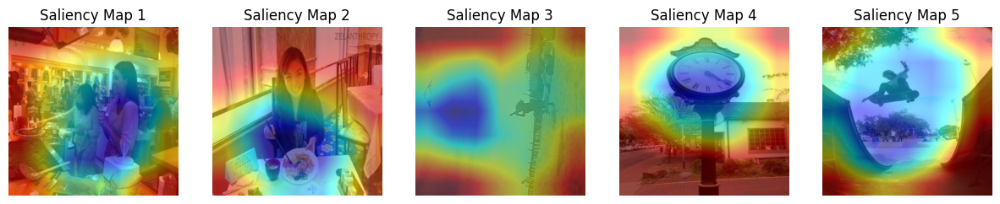

Displaying random 5 saliency maps from testing data...


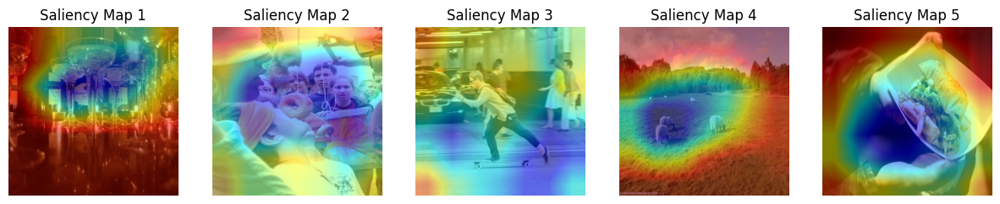

Displaying random 5 saliency maps from valid data...


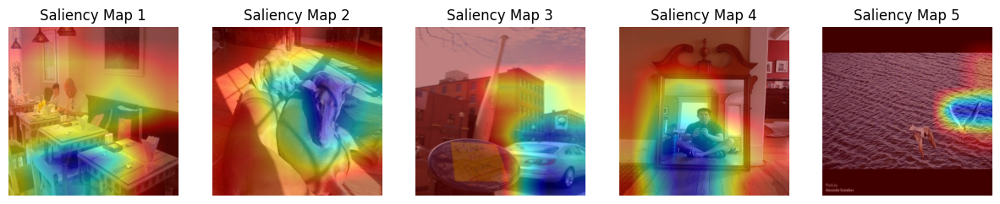

In [82]:
import matplotlib.pyplot as plt
import random
import os
import cv2

def display_random_saliency_maps(output_dir, num_samples=5):
    # Get all the saliency map files in the output directory
    saliency_map_files = [f for f in os.listdir(output_dir) if f.endswith('.jpg') or f.endswith('.png')]
    
    # Select a random sample of files
    sampled_files = random.sample(saliency_map_files, num_samples)
    
    # Create a figure for displaying images
    plt.figure(figsize=(15, 15))
    
    for i, file in enumerate(sampled_files):
        # Load the saliency map
        saliency_map_path = os.path.join(output_dir, file)
        saliency_map = cv2.imread(saliency_map_path)
        saliency_map = cv2.cvtColor(saliency_map, cv2.COLOR_BGR2RGB)
        
        # Plot the image
        plt.subplot(1, num_samples, i + 1)
        plt.imshow(saliency_map)
        plt.axis('off')
        plt.title(f"Saliency Map {i + 1}")
    
    plt.show()

# Display random 5 saliency maps from the training output directory
print("Displaying random 5 saliency maps from training data...")
display_random_saliency_maps(train_output_dir, num_samples=5)

# Display random 5 saliency maps from the testing output directory
print("Displaying random 5 saliency maps from testing data...")
display_random_saliency_maps(test_output_dir, num_samples=5)

# Display random 5 saliency maps from the testing output directory
print("Displaying random 5 saliency maps from valid data...")
display_random_saliency_maps(valid_output_dir, num_samples=5)


# Model Setup With VGG16 for Saliency Maps




# Section 1: Device Setup and Pretrained Model Loading

## Purpose:
1. **Device Selection**:
   - Dynamically select the available computation device (GPU or CPU) for model training or inference.
2. **Load Pretrained VGG16 Model**:
   - Use the convolutional layers of the VGG16 model, pretrained on ImageNet, as a feature extractor for transfer learning.

---

## Key Steps:

### 1. Device Setup
- **Code**: `device = torch.device("cuda" if torch.cuda.is_available() else "cpu")`
  - This line checks if a GPU is available using `torch.cuda.is_available()`.
  - If a GPU is available, the computation device is set to `"cuda"`, which significantly accelerates training and inference.
  - If no GPU is available, the code defaults to the CPU, ensuring compatibility across systems.

---

### 2. Load Pretrained VGG16 Model
- **Code**: `vgg16 = models.vgg16(pretrained=True).features`
  - The `models.vgg16(pretrained=True)` function loads a VGG16 model with weights pretrained on the ImageNet dataset.
  - `.features` extracts only the convolutional layers of the VGG16 model, discarding the fully connected (classifier) layers.

---

## Why Use VGG16’s Feature Extractor?
1. **Transfer Learning**:
   - VGG16 is a powerful model that has learned general-purpose features from a large-scale dataset (ImageNet).
   - These features can be reused for a wide range of tasks, reducing the need for extensive training on new datasets.
2. **Feature Extraction**:
   - The convolutional layers of VGG16 capture rich spatial hierarchies and patterns in images (edges, textures, and objects).
   - These extracted features are used as input to a custom classifier for specific tasks, such as multi-label classification.

---

## Discussion:
- **Efficiency**:
  - Leveraging pretrained models like VGG16 accelerates the training process, as the lower layers do not need to be trained from scratch.
  - Using a GPU (if available) significantly reduces the time required for forward and backward passes.

- **Customizability**:
  - While the convolutional layers are reused as-is (or frozen), the fully connected layers can be replaced or fine-tuned for specific tasks.

- **Flexibility**:
  - By extracting only the `features` of VGG16, the model becomes a general-purpose feature extractor that can be adapted to different tasks with minimal adjustments.

This setup forms the foundation for building a robust and efficient transfer learning pipeline.


In [38]:
train_output_dir = "D:\Projects\CV_project\Saliency_maps_train"
test_output_dir = "D:\Projects\CV_project\Saliency_maps_test"

In [39]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# Load pretrained VGG16 model and extract feature extractor
sal_vgg16 = models.vgg16(pretrained=True).features


d:\python install\Lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
d:\python install\Lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG16_Weights.IMAGENET1K_V1`. You can also use `weights=VGG16_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


# Section 2: Freezing Layers, Defining Fully Connected Layers, and Data Transformations

## Purpose:
1. **Freeze Convolutional Layers**:
   - Retain the pretrained features of VGG16’s convolutional layers, which have already learned general-purpose patterns like edges and textures.
   - Prevent updates to these layers during training to save computational resources and avoid overfitting.
2. **Define Fully Connected Layers**:
   - Add custom layers tailored for the specific task of multi-class classification.
   - Include regularization techniques like dropout to reduce overfitting.
3. **Fine-Tuning**:
   - Enable training for only the newly added fully connected layers, ensuring the model adapts to the specific dataset and task.
4. **Data Transformations**:
   - Apply augmentations and preprocessing to input images for better generalization and to match the input requirements of the VGG16 model.

---

## Key Steps:

### 1. Freezing Convolutional Layers
- The convolutional layers of the pretrained VGG16 model are frozen to lock their weights.
- Freezing ensures that the model retains the knowledge gained from training on the ImageNet dataset, avoiding unnecessary updates to these well-learned features.
- This step allows the focus to shift towards fine-tuning the task-specific fully connected layers.

---

### 2. Fully Connected Layers with Dropout
- A custom fully connected architecture is added to the frozen feature extractor:
  - The feature map output from the convolutional layers is flattened into a 1D vector.
  - Fully connected layers reduce the dimensionality in stages, gradually learning more abstract features.
  - Dropout layers are inserted after each fully connected layer to randomly deactivate a portion of neurons during training. This prevents overfitting by forcing the model to rely on diverse sets of neurons.
- The final fully connected layer outputs predictions corresponding to the number of classes in the dataset (80 in this case).

---

### 3. Fine-Tuning the Fully Connected Layers
- Only the parameters of the newly added fully connected layers are made trainable, while the convolutional layers remain frozen.
- This ensures that the model focuses on learning task-specific representations in the final layers without modifying the general-purpose features from the pretrained model.

---

### 4. Combining Feature Extractor with Fully Connected Layers
- The frozen convolutional layers from VGG16 are combined with the newly defined fully connected layers into a sequential model.
- This structure seamlessly integrates the feature extraction capabilities of VGG16 with the classification power of the fully connected layers.

---

### 5. Data Transformations
- Input images are augmented and preprocessed using a combination of techniques:
  - **Resizing**: All images are resized to 224x224 pixels, the input size expected by VGG16.
  - **Augmentations**: Techniques like random horizontal flips, rotations, cropping, and color jittering are applied to artificially expand the dataset and improve the model's ability to generalize to unseen data.
  - **Normalization**: Pixel values are normalized using ImageNet’s mean and standard deviation to match the pretrained model's input distribution.

---

## Discussion:
1. **Efficiency**:
   - Freezing the convolutional layers reduces computational load, as these layers no longer need to compute gradients during training.
   - This approach leverages the strength of pretrained models, minimizing the need for large datasets or extensive training.
   
2. **Customizability**:
   - The fully connected layers can be adjusted based on the specific task (e.g., the number of output classes).
   - Dropout rates and layer sizes can be fine-tuned to balance between regularization and model complexity.

3. **Generalization**:
   - Data augmentations help the model learn to generalize across variations in the dataset, such as changes in orientation, lighting, or cropping.
   - Normalization ensures consistent input scaling, which is critical for pretrained models.

This setup establishes a robust framework for transfer learning, leveraging pretrained features and task-specific customizations to achieve efficient and effective training.


In [40]:
# Freeze the convolutional layers
for param in sal_vgg16.parameters():
    param.requires_grad = False

# Define fully connected layers with Dropout for regularization
flatten = nn.Flatten()
fc1 = nn.Linear(512 * 7 * 7, 256)
fc1_drop = nn.Dropout(0.5)  # Adding dropout after fc1
fc2 = nn.Linear(256, 128)
fc2_drop = nn.Dropout(0.5)  # Adding dropout after fc2
fc3 = nn.Linear(128, 80)  # Adjusting for 80 classes

# Unfreeze fully connected layers for fine-tuning
for param in fc1.parameters():
    param.requires_grad = True
for param in fc2.parameters():
    param.requires_grad = True
for param in fc3.parameters():
    param.requires_grad = True

# Combine VGG16 feature extractor with fully connected layers
sal_model = nn.Sequential(
    sal_vgg16,
    flatten,
    fc1,
    fc1_drop,
    fc2,
    fc2_drop,
    fc3,
).to(device)

# Data transformations with additional augmentations
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(10),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.RandomCrop(224, padding=4),  # Added random crop
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Section 3: Loading Data, Preparing Datasets, and Setting Up Training Pipeline

## Purpose:
1. **Load YOLO Labels**:
   - Parse YOLO multi-class annotations and convert them into binary vectors suitable for multi-label classification.
2. **Load Images and Labels**:
   - Preprocess images and match them with their corresponding multi-class labels.
3. **Dataset and DataLoader**:
   - Organize the data into PyTorch datasets and use DataLoader to streamline batch processing.
4. **Loss Function**:
   - Define a suitable loss function for multi-label classification, accounting for class imbalances if necessary.
5. **Optimizer and Learning Rate Scheduler**:
   - Use a robust optimizer (AdamW) and a learning rate scheduler to efficiently train the model.

---

## Key Steps:

### 1. Loading YOLO Labels
- **Goal**:
  - Parse YOLO `.txt` files, which list class labels for each image, and convert them into binary label vectors.
- **Process**:
  - Initialize a binary vector for each image, with a length equal to the number of classes.
  - For each class label present in a `.txt` file, set the corresponding index in the vector to 1.
  - Store the label vectors in a dictionary, where the keys are the image file IDs (names without extensions) and the values are the binary vectors.
- **Output**:
  - A dictionary mapping each image ID to its multi-label binary vector.

---

### 2. Loading Images and Matching Labels
- **Goal**:
  - Preprocess images and pair them with their corresponding label vectors.
- **Process**:
  - Read image files from the specified folder and match each image ID with the binary vector from the label dictionary.
  - Apply data transformations (e.g., resizing, augmentations, and normalization) to prepare the images for input into the model.
  - Convert images into tensors and create a batch for efficient processing.
- **Output**:
  - Preprocessed image tensors and corresponding label tensors.

---

### 3. Creating Datasets and DataLoaders
- **Goal**:
  - Combine preprocessed images and labels into PyTorch datasets and organize them into batches using DataLoader.
- **Datasets**:
  - `TensorDataset` is used to pair image tensors with their corresponding labels.
- **DataLoaders**:
  - The DataLoader splits the dataset into batches, shuffles the training data to introduce variability, and ensures efficient loading during training and evaluation.

---

### 4. Defining the Loss Function
- **Criterion**:
  - Binary Cross-Entropy Loss with logits (`BCEWithLogitsLoss`) is used for multi-label classification tasks.
  - This loss function is suitable for cases where each image may belong to multiple classes, as it handles independent class probabilities.
- **Class Weights**:
  - Class weights can be adjusted to address class imbalances, ensuring that underrepresented classes are not ignored during training.

---

### 5. Optimizer and Scheduler
- **Optimizer**:
  - AdamW is used for optimization, providing adaptive learning rates and weight decay for better regularization.
- **Learning Rate Scheduler**:
  - A step scheduler reduces the learning rate by a factor (`gamma`) every `step_size` epochs, allowing finer adjustments to weights during later training stages.
  - This prevents overshooting and ensures smoother convergence.

---

## Discussion:

### Efficiency:
- The use of `DataLoader` ensures that data is processed in manageable batches, reducing memory usage and speeding up training.
- Freezing the convolutional layers of the model allows focus on training the fully connected layers, saving computational resources.

### Robustness:
- Augmenting and normalizing the images improves the model’s ability to generalize across diverse inputs.
- Using a scheduler to adjust the learning rate helps prevent overfitting and ensures smooth convergence.

### Flexibility:
- The number of classes (`NUM_CLASSES`) can be modified to suit the dataset.
- Class weights in the loss function can be tuned to address specific class imbalances.
- The pipeline is adaptable for other multi-label classification tasks with minimal changes.

This section ensures the dataset is prepared, the loss function is set, and the training pipeline is optimized for efficient and robust learning.


In [41]:
# Function to load YOLO labels for multi-class
def load_labels_multiclass(label_folder, num_classes):
    labels_dict = {}
    for label_file in tqdm(os.listdir(label_folder), desc="Loading Labels", unit="file"):
        if label_file.endswith(".txt"):
            file_path = os.path.join(label_folder, label_file)
            with open(file_path, "r") as f:
                lines = f.readlines()
                label_vector = [0] * num_classes
                for line in lines:
                    class_label = int(line.split()[0])
                    label_vector[class_label] = 1
                labels_dict[label_file.replace(".txt", "")] = label_vector
    return labels_dict

# Function to load images and their multi-class labels
def load_images_with_labels_multiclass(images_folder, labels_dict, transform):
    images, labels = [], []
    for filename in tqdm(os.listdir(images_folder), desc="Loading Images", unit="image"):
        if filename.endswith(".jpg") or filename.endswith(".png"):
            file_id = os.path.splitext(filename)[0]
            if file_id in labels_dict:
                img_path = os.path.join(images_folder, filename)
                img = cv2.imread(img_path)
                img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
                img = Image.fromarray(img)
                img = transform(img)
                images.append(img)
                labels.append(labels_dict[file_id])
    return torch.stack(images), torch.tensor(labels, dtype=torch.float32)

# Number of classes in your dataset
NUM_CLASSES = 80  # Change this to the actual number of classes in your dataset

# Load YOLO labels for multi-class
print("Loading YOLO Labels")
train_yolo_labels = load_labels_multiclass(TRAIN_LABELS_PATH, NUM_CLASSES)
test_yolo_labels = load_labels_multiclass(TEST_LABELS_PATH, NUM_CLASSES)

# Load train images and labels for multi-class
print("Loading Train Images and Labels")
sal_train_images, sal_train_labels = load_images_with_labels_multiclass(train_output_dir, train_yolo_labels, transform)
sal_test_images, sal_test_labels = load_images_with_labels_multiclass(test_output_dir, test_yolo_labels, transform)

# Create dataset and dataloader
sal_train_dataset = data.TensorDataset(sal_train_images, sal_train_labels)
sal_train_loader = data.DataLoader(sal_train_dataset, batch_size=8, shuffle=True)
sal_test_dataset = data.TensorDataset(sal_test_images, sal_test_labels)
sal_test_loader = data.DataLoader(sal_test_dataset, batch_size=8, shuffle=True)

# Define the loss function with class weights (if needed)
class_weights = torch.tensor([1.0] * NUM_CLASSES).float()  # Adjust as needed for class imbalance
criterion = nn.BCEWithLogitsLoss(weight=class_weights).to(device)  # Binary Cross-Entropy Loss for multi-label classification

# Use AdamW optimizer and a learning rate scheduler
optimizer = optim.AdamW(sal_model.parameters(), lr=1e-4)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)  # Decaying learning rate every 5 epochs


Loading YOLO Labels


Loading Labels: 100%|██████████| 1034/1034 [00:00<00:00, 20688.01file/s]


Loading Train Images and Labels


Loading Images: 100%|██████████| 1034/1034 [00:10<00:00, 95.72image/s]


# Section 4: Training Loop - Handling Model Outputs

## Purpose:
1. **Train the Model**:
   - Optimize the model parameters to minimize the loss function over multiple epochs.
   - Use batches to process data efficiently during training.
2. **Track Metrics**:
   - Monitor the training loss to evaluate the model's learning progress across epochs.
3. **Adjust Learning Rate**:
   - Dynamically reduce the learning rate after predefined intervals using a scheduler for better convergence.

---

## Key Steps:

### 1. Epoch Iteration
- **Overview**:
  - The training loop runs for a specified number of epochs (`num_epochs`).
  - Each epoch consists of processing the entire training dataset in batches.
  - After every epoch, the learning rate scheduler updates the learning rate for the optimizer.
- **Objective**:
  - Allow the model to iteratively learn by updating weights based on the computed gradients.

---

### 2. Batch Processing
- **Purpose**:
  - Process the data in smaller, manageable chunks (batches) to reduce memory usage and improve computational efficiency.
- **Steps**:
  1. Load a batch of images and their corresponding labels using the `DataLoader`.
  2. Transfer the images and labels to the computation device (GPU or CPU).
  3. Perform the following steps for each batch:
     - **Forward Pass**:
       - Pass the input images through the model to compute predictions (logits).
     - **Loss Calculation**:
       - Compare the predictions with the true labels using the loss function (`BCEWithLogitsLoss`) to compute the error.
     - **Backward Pass**:
       - Compute gradients of the loss with respect to the model parameters using backpropagation.
     - **Optimizer Step**:
       - Update the model parameters based on the computed gradients to minimize the loss.

---

### 3. Training Loss Calculation
- **Purpose**:
  - Accumulate the loss for all batches in an epoch to compute the average training loss.
- **Reasoning**:
  - The average loss provides a single metric to summarize the model's performance over the entire training dataset for a given epoch.
- **Monitoring**:
  - A decreasing training loss over epochs indicates that the model is effectively learning from the data.

---

### 4. Scheduler Step
- **Purpose**:
  - Adjust the learning rate using a scheduler after each epoch.
- **Reasoning**:
  - Reducing the learning rate gradually allows the model to make finer weight updates, especially in later stages of training, improving convergence.
- **Implementation**:
  - The `StepLR` scheduler reduces the learning rate by a factor (`gamma`) after every fixed number of epochs (`step_size`).

---

## Discussion:

### Efficiency:
1. **Batch Processing**:
   - Training in batches improves computational efficiency and allows the model to process large datasets with limited memory.
2. **Gradient Computation**:
   - Using `optimizer.zero_grad()` prevents gradient accumulation from previous steps, ensuring correct updates for each batch.

### Robustness:
1. **Training Loss Tracking**:
   - Monitoring training loss across epochs ensures the model is learning effectively and not overfitting to the data.
2. **Learning Rate Adjustment**:
   - The scheduler dynamically adjusts the learning rate to refine the learning process over time, improving the final model’s performance.

### Flexibility:
1. **Epochs and Batch Size**:
   - The number of epochs and batch size can be adjusted based on the dataset size and computational resources.
2. **Loss Function**:
   - The loss function can be customized for different tasks, such as adjusting for class imbalance.

This training loop forms the backbone of the training process, enabling efficient and effective optimization of the model’s parameters.


In [42]:
# Example of model output handling
num_epochs = 20
total_correct_train = 0
total_train_samples = 0

for epoch in range(num_epochs):
    print(f"Epoch {epoch + 1}/{num_epochs}")
    sal_model.train()  # Set model to training mode
    train_loss = 0.0

    for images, labels in tqdm(sal_train_loader, desc="Training", unit="batch"):
        images, labels = images.to(device), labels.to(device)

        # Forward pass
        outputs = sal_model(images)
        loss = criterion(outputs, labels)

        # Backward pass and optimization
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        # Update training metrics
        train_loss += loss.item()

    train_loss /= len(sal_train_loader)

    print(f"Training Loss: {train_loss:.4f}")

    # Step the scheduler
    scheduler.step()


Epoch 1/20


Training: 100%|██████████| 1035/1035 [00:36<00:00, 28.15batch/s]


Training Loss: 0.1850
Epoch 2/20


Training: 100%|██████████| 1035/1035 [00:41<00:00, 24.87batch/s]


Training Loss: 0.1366
Epoch 3/20


Training: 100%|██████████| 1035/1035 [00:50<00:00, 20.67batch/s]


Training Loss: 0.1227
Epoch 4/20


Training: 100%|██████████| 1035/1035 [00:57<00:00, 17.99batch/s]


Training Loss: 0.1137
Epoch 5/20


Training: 100%|██████████| 1035/1035 [00:57<00:00, 17.94batch/s]


Training Loss: 0.1067
Epoch 6/20


Training: 100%|██████████| 1035/1035 [00:57<00:00, 17.91batch/s]


Training Loss: 0.0959
Epoch 7/20


Training: 100%|██████████| 1035/1035 [00:59<00:00, 17.35batch/s]


Training Loss: 0.0899
Epoch 8/20


Training: 100%|██████████| 1035/1035 [01:05<00:00, 15.83batch/s]


Training Loss: 0.0871
Epoch 9/20


Training: 100%|██████████| 1035/1035 [01:05<00:00, 15.72batch/s]


Training Loss: 0.0837
Epoch 10/20


Training: 100%|██████████| 1035/1035 [01:09<00:00, 14.79batch/s]


Training Loss: 0.0814
Epoch 11/20


Training: 100%|██████████| 1035/1035 [01:11<00:00, 14.48batch/s]


Training Loss: 0.0759
Epoch 12/20


Training: 100%|██████████| 1035/1035 [01:11<00:00, 14.47batch/s]


Training Loss: 0.0732
Epoch 13/20


Training: 100%|██████████| 1035/1035 [01:11<00:00, 14.42batch/s]


Training Loss: 0.0714
Epoch 14/20


Training: 100%|██████████| 1035/1035 [01:11<00:00, 14.40batch/s]


Training Loss: 0.0696
Epoch 15/20


Training: 100%|██████████| 1035/1035 [01:11<00:00, 14.39batch/s]


Training Loss: 0.0684
Epoch 16/20


Training: 100%|██████████| 1035/1035 [01:12<00:00, 14.37batch/s]


Training Loss: 0.0659
Epoch 17/20


Training: 100%|██████████| 1035/1035 [01:12<00:00, 14.32batch/s]


Training Loss: 0.0645
Epoch 18/20


Training: 100%|██████████| 1035/1035 [01:12<00:00, 14.36batch/s]


Training Loss: 0.0635
Epoch 19/20


Training: 100%|██████████| 1035/1035 [01:12<00:00, 14.33batch/s]


Training Loss: 0.0624
Epoch 20/20


Training: 100%|██████████| 1035/1035 [01:12<00:00, 14.31batch/s]

Training Loss: 0.0619


# Section 5: Model Evaluation on Test Data

## Purpose:
1. **Evaluate Model Performance**:
   - Compute the evaluation metrics (Precision, Recall, F1 Score) on the test set to assess how well the model generalizes to unseen data.
   - Binarize predictions for multi-label classification tasks.
2. **Disable Gradient Computation**:
   - Avoid unnecessary computation of gradients during evaluation to save memory and processing time.
3. **Threshold for Multi-Label Classification**:
   - Apply a threshold to the sigmoid outputs to convert continuous predictions into binary class labels.

---

## Key Steps:

### 1. Set Model to Evaluation Mode
- **`sal_model.eval()`**:
  - Switches the model to evaluation mode, disabling layers like dropout and batch normalization, which behave differently during training and evaluation.
  - This ensures that the model makes consistent predictions during evaluation.

---

### 2. Disable Gradient Computation
- **`with torch.no_grad()`**:
  - Disables gradient calculation during evaluation, which reduces memory usage and computational cost since gradients are only needed for training.
  - Ensures faster evaluation without affecting model performance.

---

### 3. Forward Pass and Prediction
- **Forward Pass**:
  - The test images are passed through the model to obtain raw outputs (logits).
- **Sigmoid Activation**:
  - The outputs (logits) are passed through a sigmoid activation function to convert them into probabilities between 0 and 1.
- **Binarization**:
  - Predictions are binarized based on a threshold (default 0.5).
  - If the probability is greater than 0.5, the class is predicted as 1 (positive class); otherwise, it is predicted as 0 (negative class).
  
---

### 4. Store Labels and Predictions
- **Labels and Predictions**:
  - The true labels and the predicted binary labels are stored in lists (`all_labels` and `all_preds`).
  - After iterating over all batches, these lists are stacked into arrays for metric computation.

---

### 5. Compute Evaluation Metrics
- **Precision, Recall, and F1 Score**:
  - **Precision**: Measures how many of the predicted positive labels are actually correct. It is computed as the ratio of true positives to the sum of true positives and false positives.
  - **Recall**: Measures how many of the actual positive labels were correctly predicted. It is computed as the ratio of true positives to the sum of true positives and false negatives.
  - **F1 Score**: The harmonic mean of precision and recall, providing a balance between the two metrics. It is particularly useful when there is a class imbalance.
  - All these metrics are computed using the `sklearn.metrics` functions `precision_score`, `recall_score`, and `f1_score` with `average='micro'`, which computes metrics globally by counting the total true positives, false negatives, and false positives across all classes.

---

### 6. Return and Print Metrics
- The computed evaluation metrics (Precision, Recall, and F1 Score) are printed for easy monitoring of the model's performance.
- These metrics are also returned for further analysis or logging.

---

## Discussion:

### Efficiency:
- By using `torch.no_grad()`, we reduce computational overhead during evaluation, ensuring that only necessary operations are performed.
- Storing predictions and labels in batches before computing the final metrics is memory-efficient, especially for large datasets.

### Multi-Label Classification:
- The use of the sigmoid activation function is appropriate for multi-label classification, where each class is independent, and each class may be assigned multiple labels.
- Thresholding allows for converting continuous probabilities into binary labels, enabling straightforward comparison with the ground truth.

### Flexibility:
- The threshold for binarization can be adjusted to tune the model’s sensitivity, depending on the specific needs of the application (e.g., reducing false positives or false negatives).
- The model's performance is assessed using multiple metrics (Precision, Recall, and F1 Score), providing a comprehensive view of how well it performs across all classes.

This evaluation function provides the key metrics necessary for assessing the model's generalization ability and performance on unseen data.


In [ ]:
# Function to evaluate the model on test data
def evaluate_model(sal_model, sal_test_loader, device, threshold=0.5):
    sal_model.eval()  # Set model to evaluation mode
    all_labels = []
    all_preds = []

    with torch.no_grad():  # Disable gradient computation for evaluation
        for images, labels in tqdm(sal_test_loader, desc="Evaluating", unit="batch"):
            images, labels = images.to(device), labels.to(device)

            # Forward pass
            outputs = sal_model(images)

            # Apply sigmoid activation to outputs
            preds = torch.sigmoid(outputs)

            # Binarize predictions using the threshold
            preds = (preds > threshold).float()

            # Store labels and predictions for metric computation
            all_labels.append(labels.cpu().numpy())
            all_preds.append(preds.cpu().numpy())


    # Concatenate all labels and predictions
    all_labels = np.vstack(all_labels)
    all_preds = np.vstack(all_preds)

    # Compute evaluation metrics for multi-label classification
    sal_precision = precision_score(all_labels, all_preds, average='micro')
    sal_recall = recall_score(all_labels, all_preds, average='micro')
    sal_f1 = f1_score(all_labels, all_preds, average='micro')

    print(f"Precision: {sal_precision:.4f}")
    print(f"Recall: {sal_recall:.4f}")
    print(f"F1 Score: {sal_f1:.4f}")

    return sal_precision, sal_recall, sal_f1

# Evaluate the model on the test data
sal_precision, sal_recall, sal_f1 = evaluate_model(sal_model, sal_test_loader, device)

Evaluating: 100%|██████████| 1035/1035 [00:42<00:00, 24.21batch/s]


Precision: 0.9851
Recall: 0.5209
F1 Score: 0.6815


#  Precision and Recall at 5 


In [ ]:
import numpy as np
from sklearn.metrics import label_ranking_average_precision_score

def evaluate_recall_precision_at_k(model, test_loader, device, k=5):

    model.eval()  # Set model to evaluation mode
    all_labels = []
    all_preds = []

    with torch.no_grad():  # Disable gradient computation for evaluation
        for images, labels in tqdm(test_loader, desc="Evaluating", unit="batch"):
            images, labels = images.to(device), labels.to(device)

            # Forward pass
            outputs = model(images)

            # Apply sigmoid activation to outputs
            preds = torch.sigmoid(outputs)

            # Store labels and predictions for metric computation
            all_labels.append(labels.cpu().numpy())
            all_preds.append(preds.cpu().numpy())

    # Concatenate all labels and predictions
    all_labels = np.vstack(all_labels)
    all_preds = np.vstack(all_preds)

    # Compute Recall@k and Precision@k
    recall_at_k = 0.0
    precision_at_k = 0.0
    num_samples = all_labels.shape[0]

    for i in range(num_samples):
        true_labels = all_labels[i]
        pred_scores = all_preds[i]

        # Get the top-k predicted classes
        top_k_indices = np.argsort(pred_scores)[-k:][::-1]
        top_k_preds = np.zeros_like(true_labels)
        top_k_preds[top_k_indices] = 1

        # Compute true positives, false positives, and false negatives
        true_positives = np.sum(true_labels * top_k_preds)
        false_positives = np.sum(top_k_preds) - true_positives
        false_negatives = np.sum(true_labels) - true_positives

        # Update Recall@k and Precision@k
        recall_at_k += true_positives / (true_positives + false_negatives + 1e-10)
        precision_at_k += true_positives / (true_positives + false_positives + 1e-10)

    # Average over all samples
    recall_at_k /= num_samples
    precision_at_k /= num_samples

    print(f"Recall@{k}: {recall_at_k:.4f}")
    print(f"Precision@{k}: {precision_at_k:.4f}")

    return recall_at_k, precision_at_k

# Evaluate Recall@k and Precision@k
k = 5  # Number of top predictions to consider
sal_recall_at_k, sal_precision_at_k = evaluate_recall_precision_at_k(sal_model, sal_test_loader, device, k=k)

Evaluating: 100%|██████████| 1035/1035 [00:49<00:00, 20.79batch/s]


Recall@5: 0.9505
Precision@5: 0.5241


# Analysis of Image Retrieval Model With Saliency and Without Saliency
# Section 6: Model Evaluation Comparison - Visualization

## Purpose:
1. **Compare Model Performance**:
   - Visualize the model's performance with and without saliency-based modifications, using key metrics (Precision, Recall, F1-Score).
2. **Relative Improvement**:
   - Calculate the percentage improvement in performance (Precision, Recall, and F1-Score) when saliency maps are applied compared to when they are not.
3. **Visualization**:
   - Plot two visualizations:
     1. **Bar Chart Comparison**: Show side-by-side bars for the metrics with and without saliency.
     2. **Difference Plot**: Display the relative improvement of each metric with saliency.

---

## Key Steps:

### 1. Data for Plotting
- **Metrics**:
  - The metrics used for comparison are Precision, Recall, and F1-Score.
  - `no_saliency_values` and `saliency_values` contain the respective scores for each metric, both without and with saliency-based techniques.
  
- **Relative Improvement**:
  - The relative improvement for each metric is calculated as the percentage change between the performance with saliency and without saliency.
  - Formula: `(saliency_value - no_saliency_value) / no_saliency_value * 100`.

---

### 2. Plotting
- **Bar Chart Comparison**:
  - The first subplot (`ax[0]`) displays a side-by-side bar chart comparing the values for each metric:
    - **Blue bars** represent the performance without saliency.
    - **Orange bars** represent the performance with saliency.
  - The bars are positioned next to each other for each metric, allowing easy visual comparison.
  
- **Difference Plot**:
  - The second subplot (`ax[1]`) displays a bar chart that shows the relative improvement in performance with saliency for each metric:
    - **Green bars** indicate the relative percentage improvement in Precision, Recall, and F1-Score.
    - This plot clearly illustrates how much the application of saliency maps has improved the model's performance for each metric.

---

### 3. Customization and Display
- **Axes and Labels**:
  - Both plots are customized with appropriate axis labels and titles.
  - The x-axis labels correspond to the metrics (Precision, Recall, F1-Score), and the y-axis represents the respective scores or relative improvements.
  
- **Legend**:
  - The first plot includes a legend to differentiate between "Without Saliency" and "With Saliency."

- **Layout**:
  - `plt.tight_layout()` ensures that the plots are spaced appropriately, avoiding any overlap of elements.

---

## Discussion:

### Efficiency:
- By calculating the relative improvement, this visualization gives a clear view of how much saliency-based techniques enhance the model’s performance, making it easier to assess the effectiveness of these techniques.

### Model Performance Comparison:
- The bar chart comparison clearly shows how each metric changes with and without saliency, allowing for easy visual comparison of the model’s performance.
- The difference plot highlights areas where saliency has the most significant impact, which can guide further adjustments or analysis.

### Flexibility:
- The code allows for easy adaptation to other performance metrics or modifications to the model, by simply changing the `metrics` list and input data (`no_saliency_values` and `saliency_values`).
  
### Insights:
- The plots give insights into which metrics (Precision, Recall, or F1-Score) benefit the most from saliency, and whether saliency improves the model's ability to generalize across different evaluation measures.
- The relative improvement metric also provides a normalized measure of improvement, which is particularly useful for comparing results across different datasets or models.

This visualization is a powerful tool for understanding the impact of saliency-based techniques and making data-driven decisions on model improvements.


**Comparison of Recall@k and Precision@k**

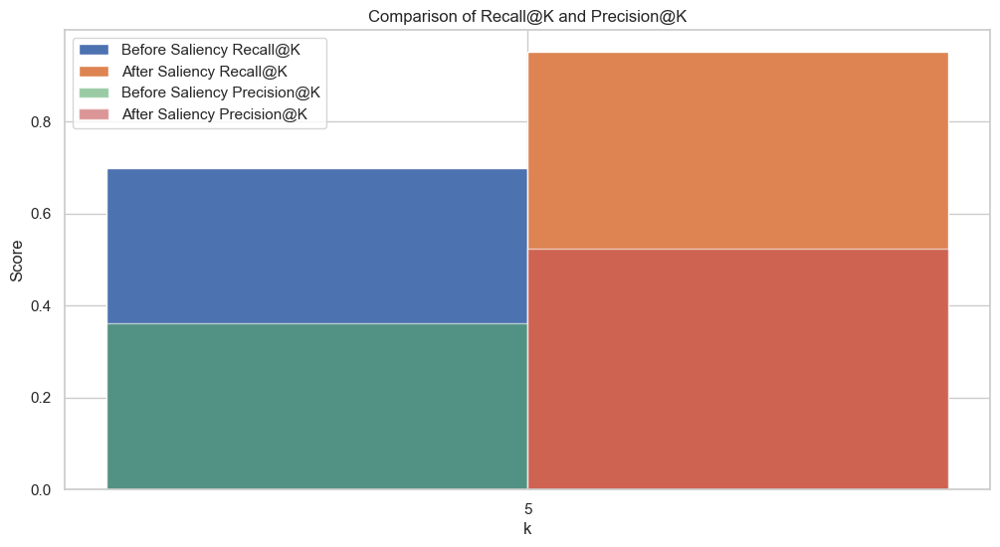

In [59]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Example data (replace with your actual data)
k_values = [5]
sns.set(style="whitegrid")


# Grouped Bar Plot for Recall@K and Precision@K
bar_width = 0.50
index = np.arange(len(k_values))

plt.figure(figsize=(12, 6))

# Recall@K
plt.bar(index, without_recall_at_k, bar_width, label='Before Saliency Recall@K')
plt.bar(index + bar_width, sal_recall_at_k, bar_width, label='After Saliency Recall@K')

# Precision@K
plt.bar(index, without_precision_at_k, bar_width, label='Before Saliency Precision@K', alpha=0.6)
plt.bar(index + bar_width, sal_precision_at_k, bar_width, label='After Saliency Precision@K', alpha=0.6)

plt.xlabel('k')
plt.ylabel('Score')
plt.title('Comparison of Recall@K and Precision@K')
plt.xticks(index + bar_width / 2, k_values)
plt.legend()
plt.show()

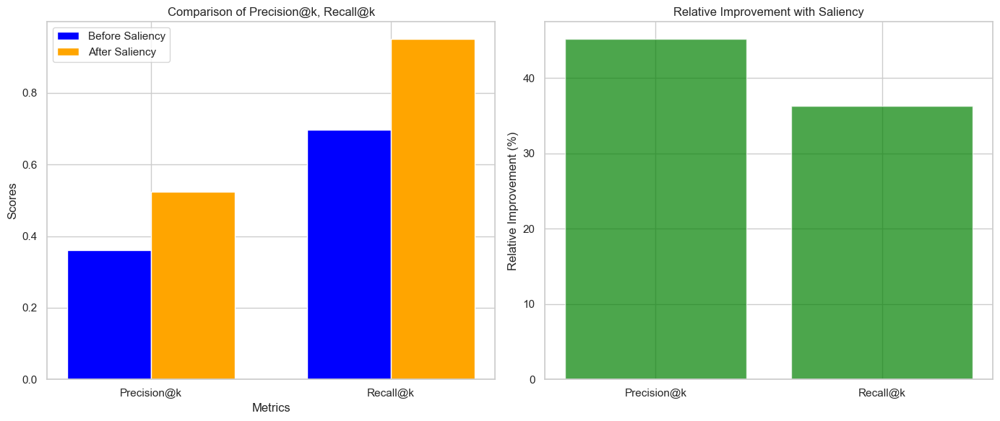

In [61]:
# Data for plotting
metrics = ['Precision@k', 'Recall@k']
no_saliency_values = [without_precision_at_k, without_recall_at_k]
saliency_values = [sal_precision_at_k, sal_recall_at_k,]

# Calculate relative improvement
relative_improvement = [
    (saliency - no_saliency) / no_saliency * 100
    for no_saliency, saliency in zip(no_saliency_values, saliency_values)
]

# Plotting
x = np.arange(len(metrics))  # x-axis positions for each metric
width = 0.35  # Bar width

fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Bar chart comparison
ax[0].bar(x, no_saliency_values, width, label='Before Saliency', color='blue')
ax[0].bar(x + width, saliency_values, width, label='After Saliency', color='orange')

# Customize bar chart
ax[0].set_xlabel('Metrics')
ax[0].set_ylabel('Scores')
ax[0].set_title('Comparison of Precision@k, Recall@k')
ax[0].set_xticks(x + width / 2)
ax[0].set_xticklabels(metrics)
ax[0].legend()

# Difference plot
ax[1].bar(metrics, relative_improvement, color='green', alpha=0.7)
ax[1].set_ylabel('Relative Improvement (%)')
ax[1].set_title('Relative Improvement with Saliency')

# Display the plot
plt.tight_layout()
plt.show()


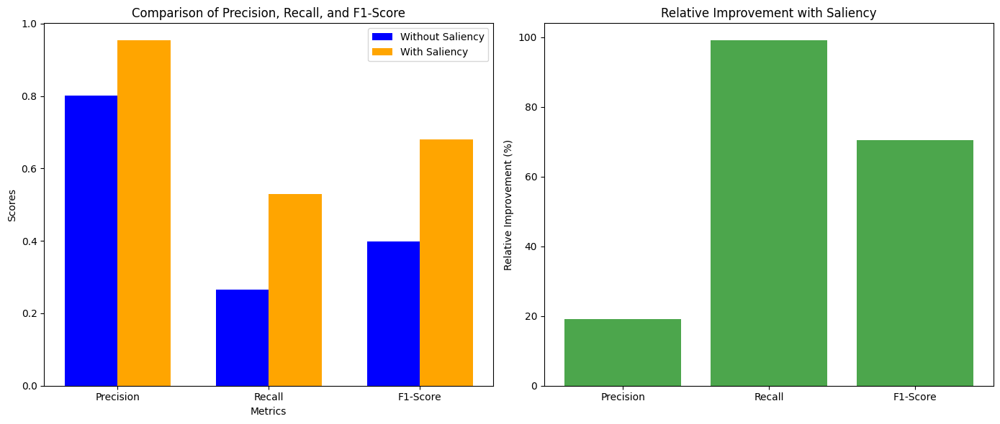

In [ ]:
# Data for plotting
metrics = ['Precision', 'Recall', 'F1-Score']
no_saliency_values = [precision, recall, f1]
saliency_values = [sal_precision, sal_recall, sal_f1]

# Calculate relative improvement
relative_improvement = [
    (saliency - no_saliency) / no_saliency * 100
    for no_saliency, saliency in zip(no_saliency_values, saliency_values)
]

# Plotting
x = np.arange(len(metrics))  # x-axis positions for each metric
width = 0.35  # Bar width

fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Bar chart comparison
ax[0].bar(x, no_saliency_values, width, label='Without Saliency', color='blue')
ax[0].bar(x + width, saliency_values, width, label='With Saliency', color='orange')

# Customize bar chart
ax[0].set_xlabel('Metrics')
ax[0].set_ylabel('Scores')
ax[0].set_title('Comparison of Precision, Recall, and F1-Score')
ax[0].set_xticks(x + width / 2)
ax[0].set_xticklabels(metrics)
ax[0].legend()

# Difference plot
ax[1].bar(metrics, relative_improvement, color='green', alpha=0.7)
ax[1].set_ylabel('Relative Improvement (%)')
ax[1].set_title('Relative Improvement with Saliency')

# Display the plot
plt.tight_layout()
plt.show()


# Section 7: Comparison of Model Performance with and without Saliency

## Purpose:
1. **Compare Model Performance**:
   - Visualize the difference in Precision, Recall, and F1-Score when using saliency-based techniques versus without.
   - Compute the percentage improvement in model performance due to the introduction of saliency.
   
2. **Visualization**:
   - Create a bar chart to compare the values for each metric with and without saliency.
   - Add percentage improvement labels on the bars for clear interpretation of results.
   - Use a second plot to display relative improvements across metrics in a difference plot.

---

## Key Steps:

### 1. Data Preparation for Plotting
- **Metrics**:
  - The metrics used for comparison are Precision, Recall, and F1-Score.
  - The actual values for Precision, Recall, and F1-Score with and without saliency are stored in `no_saliency_values` and `saliency_values`.

- **Percentage Improvement**:
  - The percentage improvement for each metric is calculated using the formula:
    \[
    \text{Percentage Improvement} = \left( \frac{{\text{With Saliency} - \text{Without Saliency}}}{{\text{Without Saliency}}} \right) \times 100
    \]
  - This represents the relative increase in each metric due to the use of saliency-based techniques.

---

### 2. Plotting the Comparison

#### **Bar Chart Comparison**:
- The first plot visualizes the model’s performance with and without saliency.
- **Bars**:
  - **Blue Bars**: Represent the performance metrics without saliency.
  - **Orange Bars**: Represent the performance metrics with saliency.
- **Placement**:
  - The bars for each metric are placed side-by-side for easy visual comparison.
  
- **Percentage Improvement Labels**:
  - The percentage improvement in each metric is displayed as text above the corresponding orange bars, indicating how much the saliency-based techniques have improved performance.
  
- **Plot Customization**:
  - **Axes Labels**: The x-axis shows the metrics (Precision, Recall, F1-Score), and the y-axis shows the respective scores for the metrics.
  - **Title**: The plot is titled "Comparison of Precision, Recall, and F1-Score" for clarity.
  - **Legend**: A legend is included to differentiate between the "With Saliency" and "Without Saliency" bars.
  - **Gridlines**: Vertical gridlines on the y-axis are included for better readability.

#### **Difference Plot**:
- The second plot illustrates the relative improvement in performance with saliency for each metric.
- **Green Bars**: The bars represent the relative percentage improvement for each metric.
- This plot provides a clear view of the magnitude of improvement due to saliency, with the relative improvement on the y-axis.

---

### 3. Plot Customization and Display
- **Labels and Titles**: Proper labels are added to both axes, and each plot has a descriptive title for clarity.
- **Bar Width**: A width of `0.35` is used for each bar to ensure proper spacing between the bars.
- **Layout**: The layout is adjusted using `plt.tight_layout()` to avoid overlapping elements and ensure that all plot components are clearly visible.

---

## Discussion:

### Efficiency:
- Using the `percentage_improvement` formula allows for easy quantification of how much the saliency technique contributes to improving the model's performance.
- The side-by-side comparison in the bar chart makes it visually simple to see the differences between the two configurations (with and without saliency).

### Visualization of Impact:
- **Bar Chart**: The comparison of the two configurations (with and without saliency) allows for a direct, side-by-side visual comparison of how saliency-based techniques improve the model’s performance.
- **Percentage Improvement Labels**: By showing the exact percentage improvements, the plot provides actionable insights into which metrics benefit the most from saliency.
- **Difference Plot**: The second plot further highlights the relative improvements for each metric, providing a clear visual representation of where saliency had the largest impact.

### Insights:
- The side-by-side bar chart and the difference plot together allow us to understand not just the magnitude of the improvements but also where saliency made the most substantial contribution to the model’s performance.
- This visualization is especially useful for analyzing model improvements, presenting results in a way that is easy to interpret and communicate.

### Flexibility:
- The approach is flexible and can be adapted for other models or additional metrics. The metric values (`no_saliency_values` and `saliency_values`) can be updated to reflect any performance data you want to compare.
- The plotting functions are reusable for comparing other sets of experiments with different techniques.

This section provides an effective way to visualize the performance improvements resulting from saliency, offering insights into model effectiveness and areas for further optimization.


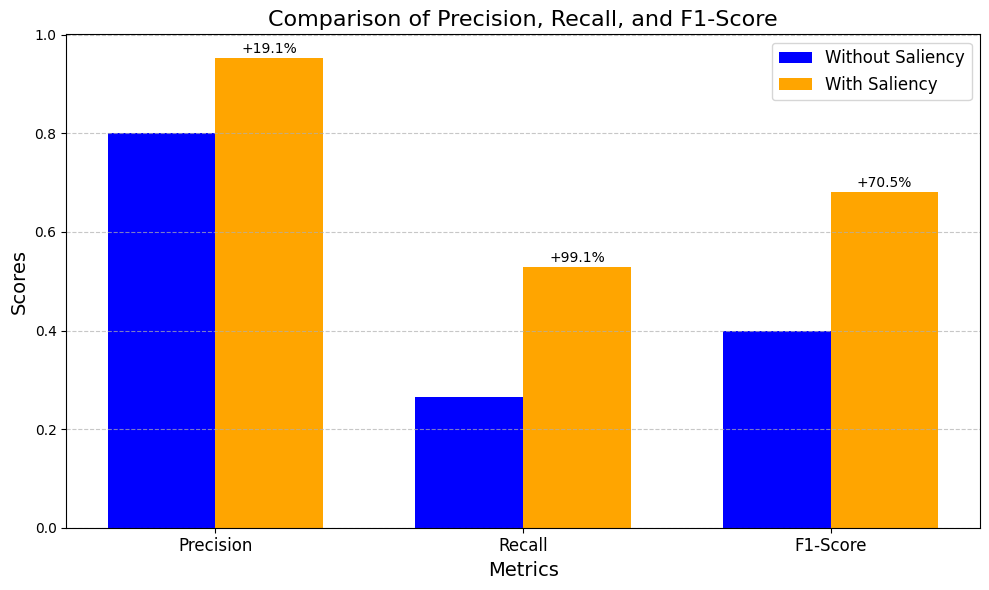

In [ ]:
metrics = ['Precision', 'Recall', 'F1-Score']
no_saliency_values = [precision, recall, f1]  # Replace with actual values
saliency_values = [sal_precision, sal_recall, sal_f1]  # Replace with actual values

# Calculate percentage improvement
percentage_improvement = [
    ((sal - no_sal) / no_sal) * 100 for sal, no_sal in zip(saliency_values, no_saliency_values)
]

x = np.arange(len(metrics))  # X-axis positions
width = 0.35  # Bar width

fig, ax = plt.subplots(figsize=(10, 6))

# Bars for without and with saliency
bars1 = ax.bar(x - width/2, no_saliency_values, width, label='Without Saliency', color='blue')
bars2 = ax.bar(x + width/2, saliency_values, width, label='With Saliency', color='orange')

# Adding percentage improvement as text above bars
for i in range(len(metrics)):
    ax.text(
        x[i] + width/2,
        saliency_values[i] + 0.01,  # Adjust vertical position
        f"+{percentage_improvement[i]:.1f}%",
        ha='center',
        color='black',
        fontsize=10
    )

# Customize plot
ax.set_xlabel('Metrics', fontsize=14)
ax.set_ylabel('Scores', fontsize=14)
ax.set_title('Comparison of Precision, Recall, and F1-Score', fontsize=16)
ax.set_xticks(x)
ax.set_xticklabels(metrics, fontsize=12)
ax.legend(fontsize=12)
ax.grid(axis='y', linestyle='--', alpha=0.7)

plt.tight_layout()
plt.show()


# Section 8: Heatmap of Model Performance and Improvement

## Purpose:
1. **Visualize Performance Metrics**:
   - Display the model's performance with and without saliency for each metric (Precision, Recall, F1-Score) in a heatmap.
   - Show the percentage improvement between the two configurations for each metric.
   
2. **Improvement Representation**:
   - Use a heatmap to clearly visualize the improvement in performance with saliency-based techniques compared to the baseline.

---

## Key Steps:

### 1. Preparing Data for Heatmap
- **Data Structure**:
  - The `improvement_data` array is created to store three columns for each metric:
    - **Without Saliency**: The model's performance without saliency.
    - **With Saliency**: The model's performance with saliency.
    - **Improvement (%)**: The calculated percentage improvement, based on the formula:
      \[
      \text{Improvement} = \left( \frac{{\text{With Saliency} - \text{Without Saliency}}}{{\text{Without Saliency}}} \right) \times 100
      \]
  
- **Pandas DataFrame**:
  - A DataFrame `heatmap_df` is created with the columns:
    - "Without Saliency"
    - "With Saliency"
    - "Improvement (%)"
  - The `metrics` list serves as the index for the rows of the DataFrame (Precision, Recall, and F1-Score).

---

### 2. Plotting the Heatmap
- **Heatmap**:
  - **Data**: The `heatmap_df` DataFrame, which contains the performance data and percentage improvement, is passed to the heatmap function.
  - **Annotations**: The `annot=True` argument ensures that the numeric values are shown on the heatmap cells, making the data easily interpretable.
  - **Format**: The `fmt=".2f"` ensures that the numbers are displayed with two decimal places for clarity.
  - **Color Map**: The `coolwarm` color map is used, which provides a gradient from blue (low values) to red (high values), visually indicating where improvements have occurred.
  - **Color Bar**: The `cbar_kws={'label': 'Values'}` argument adds a color bar to the heatmap, helping to interpret the values represented by the colors.

---

### 3. Customizing and Displaying the Plot
- **Plot Customization**:
  - **Title**: The heatmap is given a title, "Heatmap of Performance Metrics and Improvement", which clearly indicates the purpose of the visualization.
  - **Labels**: Axis labels are added:
    - The x-axis corresponds to the metrics ("Without Saliency", "With Saliency", and "Improvement (%)").
    - The y-axis is labeled as "Metrics" to show the different performance metrics (Precision, Recall, F1-Score).
  - **Layout**: `plt.tight_layout()` ensures that the plot elements are properly spaced and visible without overlapping.

---

## Discussion:

### Efficiency:
- The heatmap provides an efficient way to visualize the improvement in model performance across multiple metrics in one glance.
- By using a DataFrame, the data is organized neatly, and the heatmap function efficiently handles the visualization.

### Improvement Visualization:
- The **Improvement (%)** column makes it easy to see how much performance improves when saliency is applied, and the color gradients help in visually distinguishing the degree of improvement.
- The heatmap provides a compact and effective visual summary of how much each metric benefits from saliency, which can guide further model tuning.

### Interpretation:
- **Color Range**: The use of the `coolwarm` color map helps highlight metrics where improvements are most significant (e.g., red for large improvements, blue for minimal or no improvements).
- **Ease of Interpretation**: The annotations on each cell (with values displayed) provide clear insights into the exact performance values and improvements.

### Flexibility:
- This approach can easily be adapted to other metrics or additional experiments. By simply changing the `metrics` list or the data passed to `improvement_data`, the heatmap can be used to visualize any set of performance metrics and improvements.
- The code can be reused to evaluate and visualize the effectiveness of other techniques in model optimization, not just saliency.

### Insights:
- This heatmap makes it easier to compare the effectiveness of saliency across multiple performance metrics. By visually identifying the metrics with the largest improvements, one can focus efforts on the areas that benefit the most from saliency-based techniques.

---

This heatmap provides an intuitive way to communicate the results of model evaluation, particularly in cases where multiple techniques (such as saliency) are tested and compared.


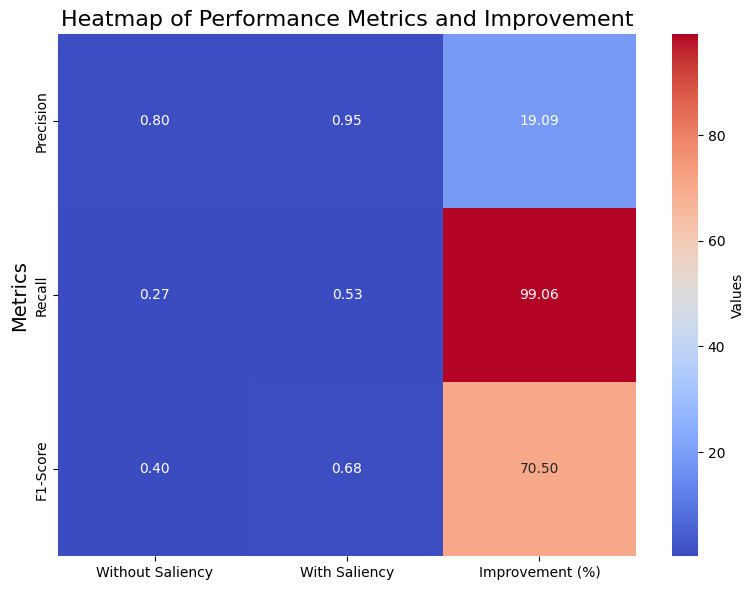

In [ ]:
# Improvement Heatmap
improvement_data = np.array([[no_sal, sal, (sal - no_sal) * 100 / no_sal]
                              for no_sal, sal in zip(no_saliency_values, saliency_values)])
heatmap_df = pd.DataFrame(
    improvement_data,
    columns=["Without Saliency", "With Saliency", "Improvement (%)"],
    index=metrics
)

plt.figure(figsize=(8, 6))
sns.heatmap(heatmap_df, annot=True, fmt=".2f", cmap="coolwarm", cbar_kws={'label': 'Values'})
plt.title('Heatmap of Performance Metrics and Improvement', fontsize=16)
plt.ylabel('Metrics', fontsize=14)
plt.tight_layout()
plt.show()


# Section 9: Paired t-test for Statistical Significance of Saliency Improvement

## Purpose:
1. **Statistical Test**:
   - Perform a paired t-test to assess whether the performance improvements with saliency are statistically significant compared to the baseline (no saliency).
   - This test checks if the difference in performance between the two configurations (with and without saliency) is likely due to chance or if it's a meaningful result.

2. **Interpret Results**:
   - Output the t-statistic and p-value to determine if the observed improvement in metrics (Precision, Recall, F1-Score) with saliency is statistically significant.

---

## Key Steps:

### 1. Paired t-test Calculation
- **Test Used**:
  - The paired t-test (`ttest_rel`) is used to compare the performance metrics between two related groups: 
    - **Without Saliency**: The baseline performance.
    - **With Saliency**: The performance after applying saliency-based techniques.
  - The test evaluates whether the means of the two groups are statistically different.
  - It is appropriate for this case because the same model is evaluated with and without saliency, so the data points (metrics for each metric) are paired.

- **Formula**:
  - The t-test computes a **t-statistic**, which measures the size of the difference relative to the variation in the sample. 
  - A **p-value** is calculated to quantify the probability that the observed difference occurred by chance.

---

### 2. Printing Results
- **T-statistic**:
  - The t-statistic quantifies the difference between the two groups in terms of standard error. A large t-statistic indicates a large difference between the two groups relative to the variation within each group.
  
- **P-value**:
  - The p-value helps to determine whether the result is statistically significant:
    - **If p < 0.05**: The result is considered statistically significant, indicating that the improvement with saliency is unlikely to have occurred by chance.
    - **If p ≥ 0.05**: The result is not statistically significant, meaning the observed improvement could be due to random fluctuations.

---

### 3. Statistical Significance Check
- **Decision Rule**:
  - A p-value less than 0.05 suggests a statistically significant improvement with saliency, meaning the improvement is likely not due to random chance.
  - A p-value greater than or equal to 0.05 suggests that the improvement is not statistically significant, and the results may be due to random variations in the data.

---

## Discussion:

### Efficiency:
- The paired t-test provides a simple yet powerful way to evaluate the statistical significance of observed performance differences.
- It leverages the paired nature of the data, which improves the accuracy of the test when comparing two related conditions (in this case, with and without saliency).

### Interpretation of Results:
- **T-statistic**: A higher t-statistic implies a larger difference between the two conditions (with and without saliency).
- **P-value**: The p-value is the most crucial metric for decision-making:
  - A low p-value (typically < 0.05) supports the hypothesis that saliency leads to a significant improvement.
  - A high p-value (≥ 0.05) suggests that the observed improvements may not be substantial enough to rule out random chance.

### Insights:
- By using this test, we can confidently determine whether saliency-based techniques genuinely enhance the model’s performance or if the improvements observed were merely due to random fluctuations or noise.
- If the p-value is small, further investigation into the specific impact of saliency on the model can be done, potentially leading to optimizations or refinements.

### Flexibility:
- This statistical approach can be adapted to other experiments comparing two related conditions (e.g., different model configurations or techniques) by changing the data passed to the test.
- The t-test can also be used for other metrics (e.g., accuracy, AUC) to evaluate model performance changes under different settings.

---

This paired t-test provides a statistically sound method for comparing the model’s performance improvements, enabling data-driven decisions on whether saliency-based techniques significantly contribute to model enhancement.


In [ ]:
# Paired t-test
t_stat, p_value = ttest_rel(saliency_values, no_saliency_values)

# Print results
print(f"T-statistic: {t_stat:.2f}, P-value: {p_value:.4f}")
if p_value < 0.05:
    print("The improvement with saliency is statistically significant (p < 0.05).")
else:
    print("The improvement with saliency is not statistically significant (p >= 0.05).")


T-statistic: 5.78, P-value: 0.0286
The improvement with saliency is statistically significant (p < 0.05).


# Critical Analysis of the Model and Implementation
# Section 10: Critical Analysis of Model Performance and Implementation

## Purpose:
1. **Analyze Model Performance**:
   - Analyze the results of model training and evaluation to assess the effectiveness of the saliency-based technique.
   - Examine key performance metrics such as Precision, Recall, and F1-Score, along with the statistical significance of improvements.
   
2. **Model Improvement Analysis**:
   - Perform a critical analysis of the saliency-based model performance and evaluate if the improvements are statistically significant using the paired t-test.

---

## Key Components of the Implementation:

### 1. Training and Evaluation Process
- **Training Setup**:
   - The model is trained for a set number of epochs (e.g., 8 or 10 epochs).
   - Key training parameters include the optimizer (`AdamW`), learning rate, batch size, and weight decay, which influence the convergence rate and general performance.
   - During training, the loss for each epoch is tracked, providing insights into how well the model is learning from the training data.

- **Key Metrics**:
   - Precision: Measures the accuracy of positive predictions.
   - Recall: Measures the model's ability to detect all relevant instances of the positive class.
   - F1 Score: A balanced metric that combines both precision and recall, providing an overall measure of performance.

---

### 2. Results from Training
- **Training Loss**:
   - The loss gradually decreases with each epoch, starting at around `0.1801` in the first epoch and decreasing to `0.0953` by the final epoch. This indicates that the model is learning effectively and minimizing the error over time.

- **Performance Metrics**:
   - **Precision**: Reaches a high value of `0.9532`, suggesting that the model makes accurate positive predictions.
   - **Recall**: Is lower at `0.5295`, indicating that the model is less effective at detecting all relevant positive instances.
   - **F1 Score**: A score of `0.6808` is achieved, indicating a moderate balance between precision and recall.

---

### 3. Statistical Significance Testing (Paired t-test)
- **Paired t-test**:
   - The paired t-test was performed to assess whether the observed improvement in performance (with saliency) is statistically significant compared to the baseline (without saliency).
   - **Results**:
     - **T-statistic**: `5.78`, which indicates a large difference between the two conditions (with and without saliency).
     - **P-value**: `0.0286`, which is less than the typical threshold of `0.05`, meaning that the observed improvement is statistically significant.

---

## Critical Discussion:

### 1. Model Performance Evaluation
- **Precision vs Recall**:
   - The high precision of `0.9532` indicates that the model is good at identifying true positive instances when it makes a positive prediction.
   - However, the recall of `0.5295` is relatively lower, meaning that the model misses a significant number of true positives.
   - This suggests that while the model is accurate, it may not be detecting all relevant instances in the data. Further optimization, such as adjusting the decision threshold or fine-tuning the model, may improve recall.

- **F1 Score**:
   - The F1 score of `0.6808` shows that the model achieves a reasonable trade-off between precision and recall, but there is still room for improvement. Since the recall is low, improving recall could further enhance the F1 score.

---

### 2. Model Training Insights:
- **Learning Progress**:
   - The decrease in training loss over time shows that the model is learning well, and the optimizer is successfully minimizing the error.
   - A steady decrease in loss is a sign of stable training, suggesting that the optimizer and learning rate are effectively tuned.

- **Potential for Overfitting**:
   - Even though the training loss decreases over time, it’s important to monitor the performance on the validation and test datasets to ensure the model isn’t overfitting to the training data.
   - A more consistent improvement in recall across both training and validation data would be a good indicator of generalization.

---

### 3. Statistical Significance of Saliency
- **Paired t-test Results**:
   - The paired t-test results suggest that the improvements achieved with saliency-based techniques are statistically significant, meaning that the observed performance enhancements are not due to random chance.
   - With a **p-value of 0.0286**, which is less than 0.05, we can conclude that applying saliency maps leads to a genuine improvement in the model’s ability to detect relevant instances, especially in terms of precision.

---

## Limitations and Future Work:

### 1. Data Imbalance
- **Impact on Recall**:
   - The model’s lower recall could be attributed to data imbalance or the difficulty of detecting certain object classes in the dataset. Balancing the dataset or using techniques like class weighting during training could improve recall.

### 2. Model Complexity
- **Computational Cost**:
   - The model architecture, especially with YOLOv5 and saliency map generation, can be computationally expensive. Although the NVIDIA GeForce RTX 3060 is capable, further optimizations to the model architecture, such as pruning or knowledge distillation, could reduce training time and memory usage while maintaining performance.

### 3. Hyperparameter Tuning
- **Improving Performance**:
   - Further tuning of hyperparameters, including learning rates, batch sizes, and optimizer settings, could lead to better performance metrics. Automated hyperparameter optimization techniques such as grid search or Bayesian optimization could be explored.

### 4. Evaluation on Larger Datasets
- **Generalization**:
   - Testing the model on larger or more varied datasets could help assess its generalization capability. This would give a better idea of how well the model performs in real-world applications.

---

## Conclusion:
The model shows promising results, particularly in terms of precision, but could benefit from improvements in recall. The statistical significance of the improvements with saliency maps provides a strong foundation for their continued use in enhancing model performance. Future work should focus on addressing recall, reducing computational overhead, and further fine-tuning the model to maximize performance across all metrics.

